In [1]:
# BENTCHMARK CASES
import tensorflow.keras.backend as K
from tensorflow.keras.regularizers import l2
from hyperopt import STATUS_OK, tpe, Trials, hp, fmin
from hyperopt.pyll.stochastic import sample
from hyperopt.pyll.base import scope
from sklearn.model_selection import KFold
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras.optimizers import Adam,Nadam,Adamax
from time import perf_counter
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="tensorflow")

import tinyDA as tda
from scipy.stats import multivariate_normal, uniform
import arviz as az
import keras




from module_utils import * 
from data_collection import *
sys.path.append('../utils')
from Structure2 import *
from pathlib import Path



"""
Tutorial for the creation of multifidelity Neural Networks
"""

# # path to the current notebook
# current_file_path = Path().resolve()
# # path to the current folder
# load_context_functions(current_file_path.parent.name)



# # fixing the seeds for reproducibility purposes
# seed = 10
# tf.random.set_seed(seed)
# np.random.seed(seed)
# keras.utils.set_random_seed(seed)


import numpy as np
import inspect
from matplotlib import pyplot as plt
from typing import Dict, Any

class FidelityFunctions:
    def __init__(self, case: str, **kwargs: Any) -> None:
        """
        Initializes the FidelityFunctions object with a specified case and optional parameters.

        :param case: The case to use ('Basic', 'Discontinuous', or 'Oscillatory').
        :param kwargs: Additional parameters to override defaults for the specified case.
        """
        self.cases = {
            "Basic": {
                "high_fid": self.high_fidelity_basic,
                "low_fid": self.low_fidelity_basic,
                "Nhf": 5,
                "Nlf": 32,
                "NepoLF": 1000,
                "NepoHF": 500
            },
            "Discontinuous": {
                "high_fid": self.high_fidelity_discontinuous,
                "low_fid": self.low_fidelity_discontinuous,
                "Nhf": 6,
                "Nlf": 32,
                "NepoLF": 5000,
                "NepoHF": 1200
            },
            "Oscillatory": {
                "high_fid": self.high_fidelity_oscillatory,
                "low_fid": self.low_fidelity_oscillatory,
                "Nhf": 15,
                "Nlf": 64,
                "NepoLF": 3000,
                "NepoHF": 3000
            }
        }
        if case not in self.cases:
            raise ValueError(f"Example {case} not recognized")
        
        self.data = self.cases[case]
        self.data.update(kwargs)
        self.evaluate_case_data()

    @staticmethod
    def high_fidelity_basic(x: np.ndarray) -> np.ndarray:
        """
        High fidelity function for the 'Basic' case.
        
        :param x: Input array.
        :return: Calculated high fidelity values.
        """
        return (6.*x/5-2.)**2 * np.sin(12.*x/5-4.)

    @staticmethod
    def low_fidelity_basic(x: np.ndarray) -> np.ndarray:
        """
        Low fidelity function for the 'Basic' case.
        
        :param x: Input array.
        :return: Calculated low fidelity values.
        """
        return 0.5 * FidelityFunctions.high_fidelity_basic(x) + 10 * (x/5-0.5) + 5.

    @staticmethod
    def high_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        High fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated high fidelity values.
        """    
        lowfid = FidelityFunctions.low_fidelity_discontinuous(x)
        return (2*lowfid - 20*x/5 + 20) * (x/5 < 0.5) + (4 + 2*lowfid - 20*x/5 + 20) * (x/5 > 0.5)

    @staticmethod
    def low_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        Low fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated low fidelity values.
        """
        return (0.5 * (6.*x/5.-2.)**2 * np.sin(12.*x/5.-4) + 10.*(x/5-0.5) - 5.) * (x < 2.5) + \
               (3 + 0.5 * (6.*x/5.-2)**2 * np.sin(12.*x/5.-4) + 10 * (x/5.-0.5) - 5.) * (x > 2.5)

    @staticmethod
    def high_fidelity_oscillatory(x: np.ndarray) -> np.ndarray:
        """
        High fidelity function for the 'Oscillatory' case.
        
        :param x: Input array.
        :return: Calculated high fidelity values.
        """
        lowfid = FidelityFunctions.low_fidelity_oscillatory(x)
        return (x/5 - np.sqrt(2)) * lowfid**2

    @staticmethod
    def low_fidelity_oscillatory(x: np.ndarray) -> np.ndarray:
        """
        Low fidelity function for the 'Oscillatory' case.
        
        :param x: Input array.
        :return: Calculated low fidelity values.
        """
        return np.sin(8 * np.pi * x / 5)

    @staticmethod
    def function_to_string(func: Any) -> str:
        """
        Converts a function to its string representation.

        :param func: The function to convert.
        :return: String representation of the function.
        """
        return inspect.getsource(func).strip()
    
    def plot_functions(self) -> None:
        """
        Plots the high fidelity and low fidelity functions along with their data points.
        """
        #data = self.get_data()
        xhf = self.data["xhf"]
        xlf = self.data["xlf"]
        x_test = self.data["x_test"]
        high_fid = self.data["high_fid"]
        low_fid = self.data["low_fid"]

        plt.figure()
        plt.plot(x_test, high_fid(x_test), 'r', label='high-fidelity sol')
        plt.plot(x_test, low_fid(x_test), 'g', label='low-fidelity sol')
        plt.plot(xhf, high_fid(xhf), 'ro', label='high-fidelity data', markersize=4)
        plt.plot(xlf, low_fid(xlf), 'go', label='low-fidelity data', markersize=4)
        plt.xlabel('x')
        plt.legend()
        plt.title('Benchmark 1D')
        plt.show()

    def evaluate_case_data(self) -> None:
        """
        Evaluates and stores the necessary data for the selected case.
        """
        Nhf = self.data["Nhf"]
        Nlf = self.data["Nlf"]
        self.data["xhf"] = np.linspace(0, 5, Nhf)
        self.data["xlf"] = np.linspace(0, 5, Nlf)
        self.data["x_test"] = np.linspace(0, 5, 1000)
        self.data["Yhf"] = self.data["high_fid"](self.data["xhf"])
        self.data["Ylf"] = self.data["low_fid"](self.data["xlf"])

    def get_data(self) -> Dict[str, Any]:
        """
        Returns the evaluated data for the selected case.

        :return: Dictionary containing evaluated data and function representations.
        """
        high_fid = self.data["high_fid"]
        low_fid = self.data["low_fid"]
        
        Yhf = self.data["Yhf"]
        Ylf = self.data["Ylf"]

        # return {
        #     "xhf dimensions": self.data["xhf"].shape[0],
        #     "xlf dimensions": self.data["xlf"].shape[0],
        #     "x_test dimensions": self.data["x_test"].shape[0],
        #     "Yhf dimensions": Yhf.shape[0],
        #     "Ylf dimensions": Ylf.shape[0],
        #     "NepoLF": self.data["NepoLF"],
        #     "NepoHF": self.data["NepoHF"],
        #     "high_fid_function": self.function_to_string(high_fid),
        #     "low_fid_function": self.function_to_string(low_fid)
        # }
        return self.data


def main():
    # path to the current notebook
    current_file_path = Path().resolve()
    # path to the current folder
    load_context_functions(current_file_path.parent.name)

    # introduction of a seed for reproducibility purposes
    seed = 10
    tf.random.set_seed(seed)
    np.random.seed(seed)
    keras.utils.set_random_seed(seed)


    # Case to consider:
    example = "Discontinuous"
    fidelity_func = FidelityFunctions(example) #fidelity_func = FidelityFunctions(example, Nlf=40, NepoLF=6000)

    data = fidelity_func.get_data()

    # Print the functions in a readable format
    print("High Fidelity Function:\n", fidelity_func.function_to_string(data["high_fid"]), "\n")
    print("Low Fidelity Function:\n", fidelity_func.function_to_string(data["low_fid"]), "\n")
    #print(data)
    # Plot the functions
    fidelity_func.plot_functions()


    ### LOW FIDELITY NEURAL NETWORK ###
    bestLF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
    definition_LF={
        "network_type": "LF",
        "params": bestLF_params,
        "data_train": data["xlf"],
        "output_train": data["Ylf"],
        "N": data["NepoLF"],
        "n": data["Nlf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
    modelLF=NetworkFactory.build_network(**definition_LF)
    yLF=modelLF.prediction(data["x_test"])
    (mse_LF,R_LF)=modelLF.performance(data["x_test"],data["high_fid"](data["x_test"]))


    ### HIGH FIDELITY NEURAL NETWORK ###
    bestHF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
    definition_HF={
        "network_type": "LF",
        "params": bestHF_params,
        "data_train": data["xhf"],
        "output_train": data["Yhf"],
        "N": data["NepoHF"],
        "n": data["Nhf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
    modelHF=NetworkFactory.build_network(**definition_HF)
    yHF=modelHF.prediction(data["x_test"])
    (mse_HF,R_HF)=modelHF.performance(data["x_test"],data["high_fid"](data["x_test"]))


    ### 2 steps NEURAL NETWORK ###
    # collection of parameters
    bestLF_params = {
        'lr': 0.0255, 
        'kernel_init': 'glorot_uniform', 
        'opt': 'Adam'
    }
    
    best_params = {
        'kernel_init': 'uniform', 
        'l2weight': 0.00010018625799978436, 
        'lr': 0.07093837044166487, 
        'nodes': 74.0, 
        'opt': 'Adamax'
    }
    params = [bestLF_params, best_params]

    N = [data["NepoLF"], data["NepoHF"]]
    n = [data["Nlf"], data["Nhf"]]

    # names of the networks 
    names = ['LF', 'HF']

    # collection of the parameters
    definition_2steps = {
        "network_type": "2step",
        "names": names,
        "params": params,
        "data_train": [data["xlf"], data["xhf"]],
        "output_train": [data["Ylf"], data["Yhf"]],
        "N": N,
        "n": n,
        "train": True,
        "do_HPO": True,
        "verbose": False
    }


    # creation of 2 steps model 
    final_model = NetworkFactory.build_network(**definition_2steps)
    
    if final_model == -1:
        raise ValueError("Failed to build the network. Check the network type and parameters.")
    

    y_test = final_model.prediction(data["x_test"])

    # 2 steps performance 
    (mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))


    ### PLOT of predicted models ###
    #LF single-fidelity
    plt.figure()
    plt.plot(data["xlf"],data["Ylf"],'go', label = 'LF training data', markersize = 4)
    plt.plot(data["x_test"],data["low_fid"](data["x_test"]),'g', label = 'exact LF') 
    plt.plot(data["x_test"],yLF,'k--', label = 'pred LF')
    plt.legend()
    plt.title('Low fidelity model')

    #HF single-fidelity
    plt.figure()
    plt.plot(data["xhf"],data["Yhf"],'ro', label = 'HF training data')
    plt.plot(data["x_test"],data["high_fid"](data["x_test"]),'-r', label = 'exact HF')
    plt.plot(data["x_test"],yHF,'--k', label = 'pred HF')
    plt.legend()
    plt.title('High fidelity model - single-fidelity')

    #2-step MF
    plt.figure()
    plt.plot(data["xhf"],data["Yhf"],'ro', label = 'HF training data')
    plt.plot(data["x_test"],data["high_fid"](data["x_test"]),'-r', label = 'exact HF')
    plt.plot(data["x_test"],y_test,'--k', label = 'pred HF')
    plt.legend()
    plt.title('High fidelity model - 2-step')




High Fidelity Function:
 @staticmethod
    def high_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        High fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated high fidelity values.
        """    
        lowfid = FidelityFunctions.low_fidelity_discontinuous(x)
        return (2*lowfid - 20*x/5 + 20) * (x/5 < 0.5) + (4 + 2*lowfid - 20*x/5 + 20) * (x/5 > 0.5) 

Low Fidelity Function:
 @staticmethod
    def low_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        Low fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated low fidelity values.
        """
        return (0.5 * (6.*x/5.-2.)**2 * np.sin(12.*x/5.-4) + 10.*(x/5-0.5) - 5.) * (x < 2.5) + \
               (3 + 0.5 * (6.*x/5.-2)**2 * np.sin(12.*x/5.-4) + 10 * (x/5.-0.5) - 5.) * (x > 2.5) 



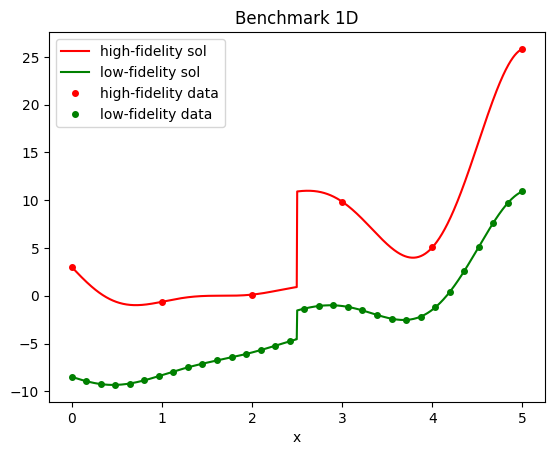

Function training took 10.9615 seconds
The function training took 10.961528062820435 seconds.


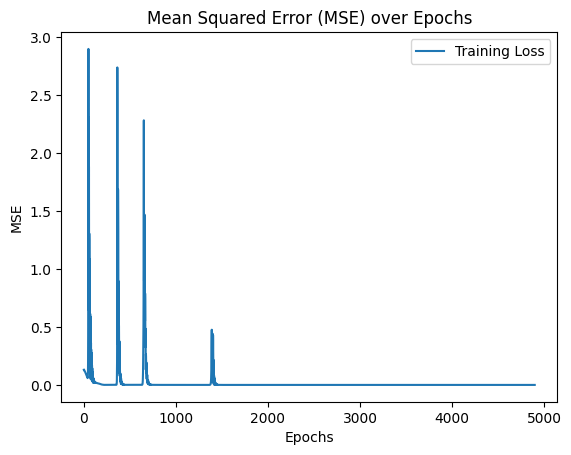

Test MSE: 82.28459782010431
R^2: -0.6799807891951397
Function training took 3.2743 seconds
The function training took 3.2743194103240967 seconds.


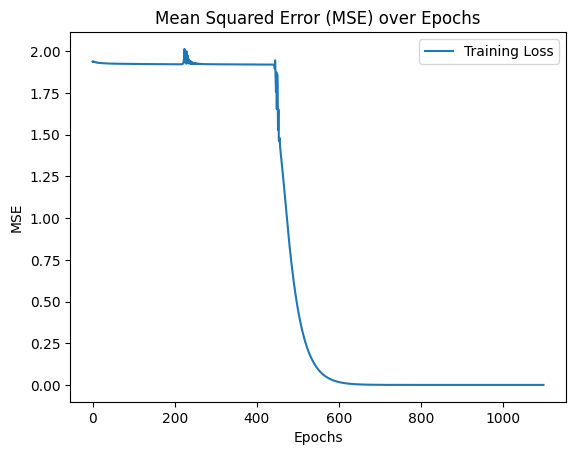

Test MSE: 3.500971598195358
R^2: 0.9285216773940531
1/1 [==============================] - 0s 55ms/step 

1/1 [==============================] - 0s 18ms/step 

1/1 [==============================] - 0s 19ms/step 

1/1 [==============================] - 0s 20ms/step 

  0%|          | 0/1 [00:48<?, ?trial/s, best loss=?]


KeyboardInterrupt: 

In [2]:
if __name__ == "__main__":
    main()

NameError: name 'data' is not defined

In [37]:
import tensorflow.keras.backend as K
from tensorflow.keras.regularizers import l2
from hyperopt import STATUS_OK, tpe, Trials, hp, fmin
from hyperopt.pyll.stochastic import sample
from hyperopt.pyll.base import scope
from sklearn.model_selection import KFold
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras.optimizers import Adam,Nadam,Adamax
from time import perf_counter
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="tensorflow")

import tinyDA as tda
from scipy.stats import multivariate_normal, uniform
import arviz as az
import keras




from module_utils import * 
from data_collection import *
sys.path.append('../utils')
from Structure import *
from pathlib import Path

# path to the current notebook
current_file_path = Path().resolve()
# path to the current folder
load_context_functions(current_file_path.parent.name)

# introduction of a seed for reproducibility purposes
seed = 10
tf.random.set_seed(seed)
np.random.seed(seed)
keras.utils.set_random_seed(seed)



# Chosen example:
example="Continuous"
params = get_parameters(example)

x_values = np.linspace(0, 5, 1000)
# parameters 
deltas=params["deltas"]


plt.figure(figsize=(12, 8))
for delta in deltas:
    y_highfid = params["modified_highfid"](x_values,delta)
    y_lowfid = params["modified_lowfid"](x_values,delta)
    plt.plot(x_values, y_highfid, label=f'High Fidelity, delta={delta}')
    plt.plot(x_values, y_lowfid, label=f'Low Fidelity, delta={delta}', linestyle='--')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.show()



NameError: name 'get_parameters' is not defined

High Fidelity Function:
 @staticmethod
    def high_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        High fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated high fidelity values.
        """    
        lowfid = FidelityFunctions.low_fidelity_discontinuous(x)
        return (2*lowfid - 20*x/5 + 20) * (x/5 < 0.5) + (4 + 2*lowfid - 20*x/5 + 20) * (x/5 > 0.5) 

Low Fidelity Function:
 @staticmethod
    def low_fidelity_discontinuous(x: np.ndarray) -> np.ndarray:
        """
        Low fidelity function for the 'Discontinuous' case.
        
        :param x: Input array.
        :return: Calculated low fidelity values.
        """
        return (0.5 * (6.*x/5.-2.)**2 * np.sin(12.*x/5.-4) + 10.*(x/5-0.5) - 5.) * (x < 2.5) + \
               (3 + 0.5 * (6.*x/5.-2)**2 * np.sin(12.*x/5.-4) + 10 * (x/5.-0.5) - 5.) * (x > 2.5) 



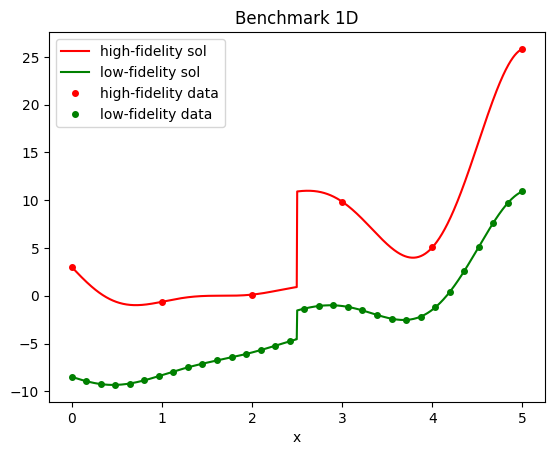

The function training took 11.333322763442993 seconds.


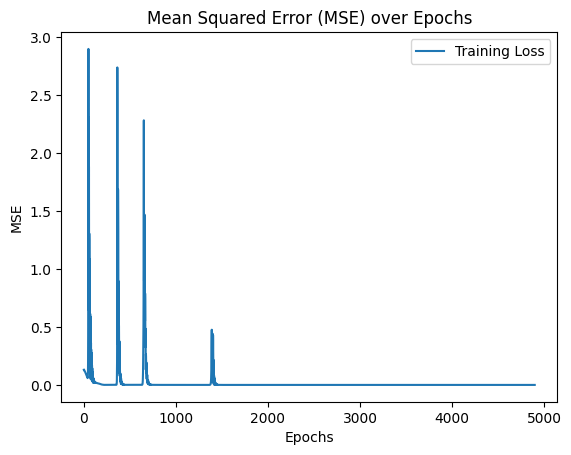

Test MSE: 82.28459782010431
R^2: -0.6799807891951397
The function training took 3.0783660411834717 seconds.


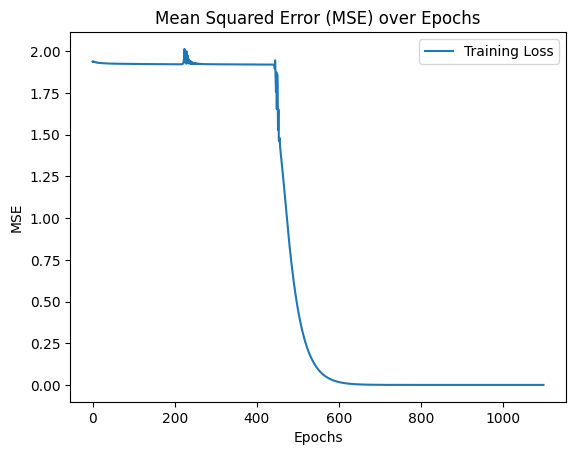

Test MSE: 3.500971598195358
R^2: 0.9285216773940531
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

job exception: tuple index out of range



  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]


IndexError: tuple index out of range

In [4]:
if __name__ == "__main__":
    main()

In [38]:
import tensorflow.keras.backend as K
from tensorflow.keras.regularizers import l2
from hyperopt import STATUS_OK, tpe, Trials, hp, fmin
from hyperopt.pyll.stochastic import sample
from hyperopt.pyll.base import scope
from sklearn.model_selection import KFold
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras.optimizers import Adam,Nadam,Adamax
from time import perf_counter
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="tensorflow")

import tinyDA as tda
from scipy.stats import multivariate_normal, uniform
import arviz as az
import keras




from module_utils import * 
from data_collection import *
sys.path.append('../utils')
from Structure2 import *
from pathlib import Path

# path to the current notebook
current_file_path = Path().resolve()
# path to the current folder
load_context_functions(current_file_path.parent.name)

# introduction of a seed for reproducibility purposes
seed = 10
tf.random.set_seed(seed)
np.random.seed(seed)
keras.utils.set_random_seed(seed)

In [39]:
data["deltas"]

array([1.25663706, 2.51327412, 3.76991118, 5.02654825])

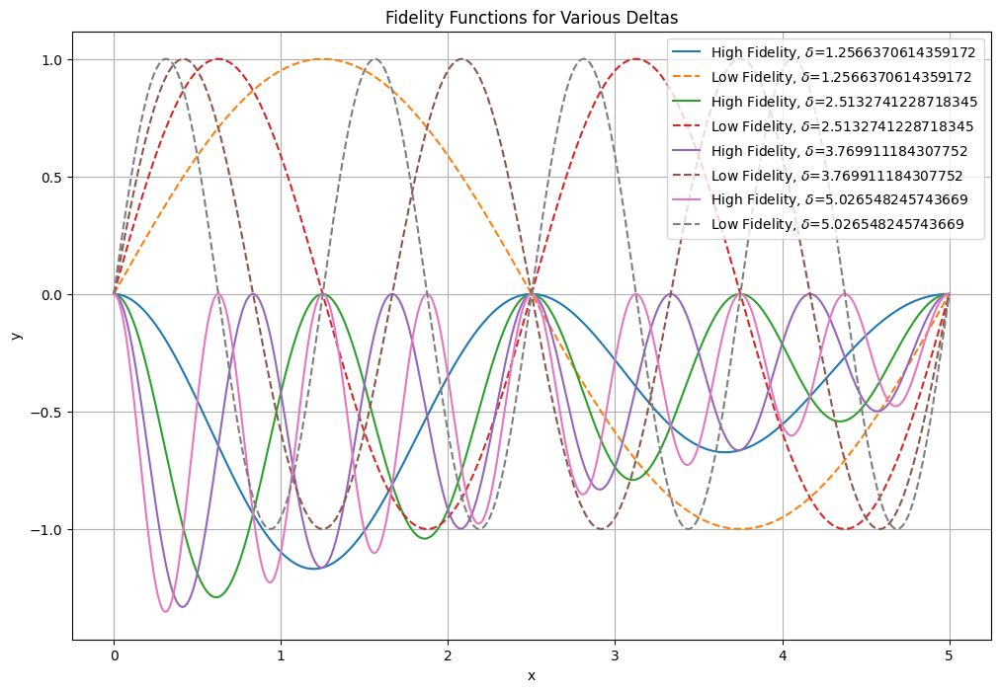

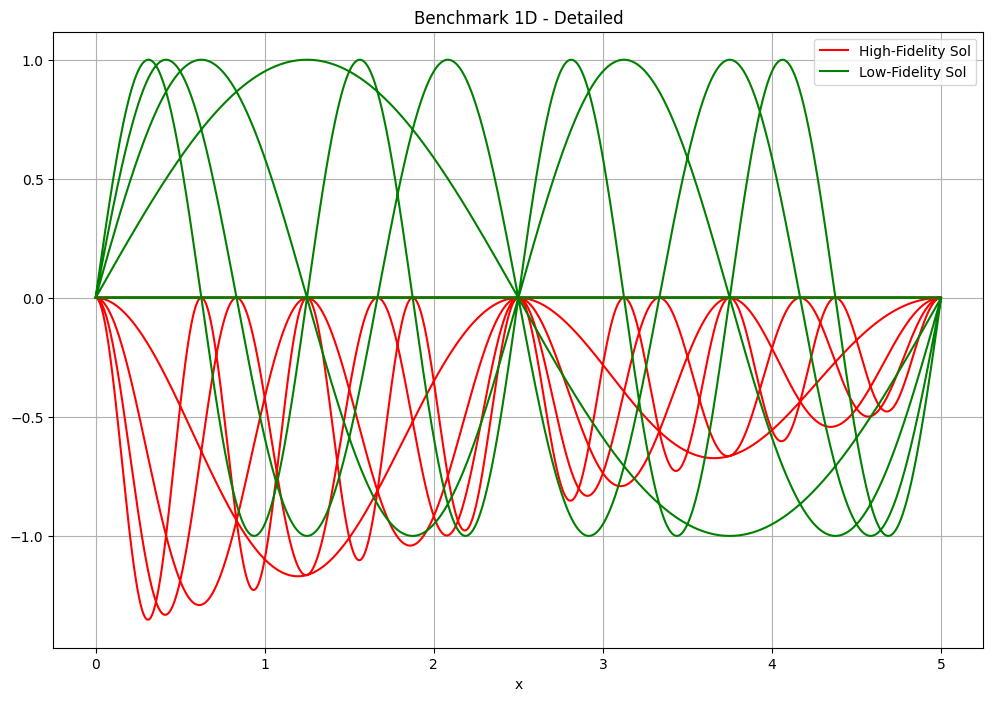

In [40]:
example = "Oscillatory"
fidelity_func = FidelityFunctionModified(example)
fidelity_func.plot_functions()
fidelity_func.plot_detailed_functions()

In [41]:
data=fidelity_func.get_parameters(example)

In [42]:
data

{'modified_highfid': CPUDispatcher(<function FidelityFunctionModified.create_oscillatory_functions.<locals>.modified_highfid at 0x000001EBE1616160>),
 'modified_lowfid': CPUDispatcher(<function FidelityFunctionModified.create_oscillatory_functions.<locals>.modified_lowfid at 0x000001EB5EB9EC00>),
 'Nhf': 15,
 'Nlf': 64,
 'xhf': array([[0.        , 1.25663706],
        [0.35714286, 1.25663706],
        [0.71428571, 1.25663706],
        [1.07142857, 1.25663706],
        [1.42857143, 1.25663706],
        [1.78571429, 1.25663706],
        [2.14285714, 1.25663706],
        [2.5       , 1.25663706],
        [2.85714286, 1.25663706],
        [3.21428571, 1.25663706],
        [3.57142857, 1.25663706],
        [3.92857143, 1.25663706],
        [4.28571429, 1.25663706],
        [4.64285714, 1.25663706],
        [5.        , 1.25663706],
        [0.        , 2.51327412],
        [0.35714286, 2.51327412],
        [0.71428571, 2.51327412],
        [1.07142857, 2.51327412],
        [1.42857143, 2.51

Function training took 7.4392 seconds
The function training took 7.440178155899048 seconds.


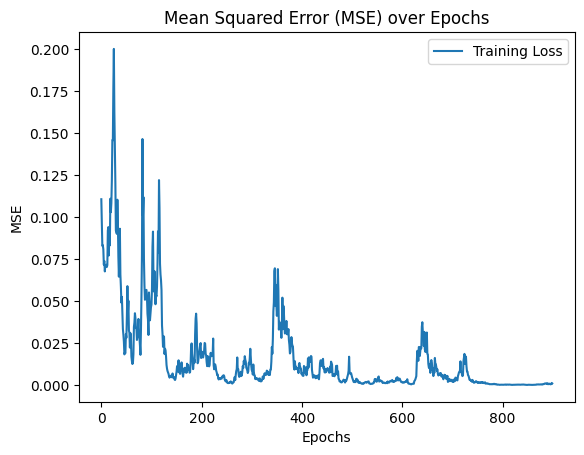

Test MSE: 0.9465075319065006
R^2: -6.083687234140271


Text(0.5, 1.0, 'Low fidelity model')

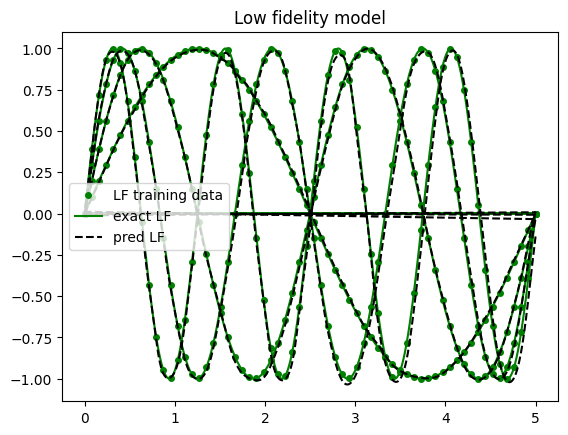

In [43]:
# parameters of the Neural Network
bestLF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
definition_LF={
        "network_type": "LF",
        "params": bestLF_params,
        "data_train": data["xlf"],
        "output_train": data["Ylf"],
        "N": data["NepoLF"],
        "n": data["Nlf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
# building of the neural network
modelLF=NetworkFactory.build_network(**definition_LF)
# prediction step
yLF=modelLF.prediction(data["datatest"])
(mse_LF,R2_LF)=modelLF.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

# Plot of the estimated results
plt.figure()
plt.plot(data["xlf"][:,0],data["Ylf"],'go', label = 'LF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_lowfid"](data["datatest"][:,0],data["datatest"][:,1]),'g', label = 'exact LF') 
plt.plot(data["datatest"][:,0],yLF,'k--', label = 'pred LF')
plt.legend()
plt.title('Low fidelity model')

Function training took 16.0254 seconds
The function training took 16.025381088256836 seconds.


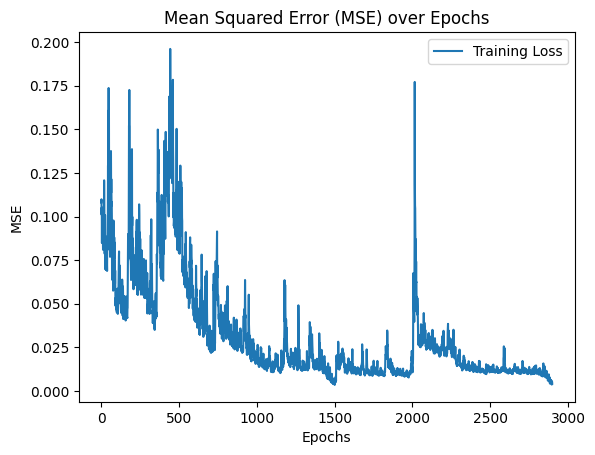

Test MSE: 0.055272597986199386
R^2: 0.5863384246251462


Text(0.5, 1.0, 'High fidelity model')

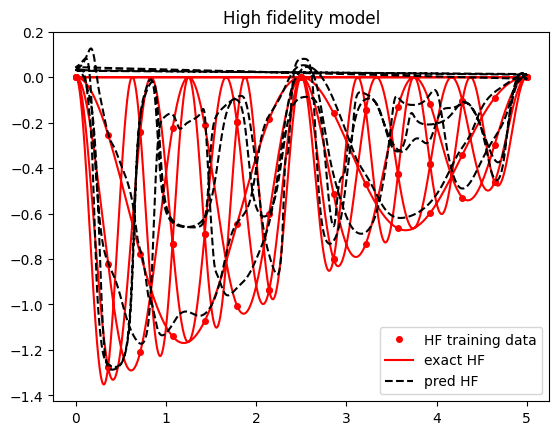

In [44]:
# parameters of the Neural Network
bestHF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
definition_HF={
        "network_type": "LF",
        "params": bestLF_params,
        "data_train": data["xhf"],
        "output_train": data["Yhf"],
        "N": data["NepoHF"],
        "n": data["Nhf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
modelHF=NetworkFactory.build_network(**definition_HF)
yHF=modelHF.prediction(data["datatest"])
(mse_HF,R2_HF)=modelHF.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

# Plot of the estimated results
plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],yHF,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')



Function training took 6.2498 seconds
The function training took 6.249806642532349 seconds.


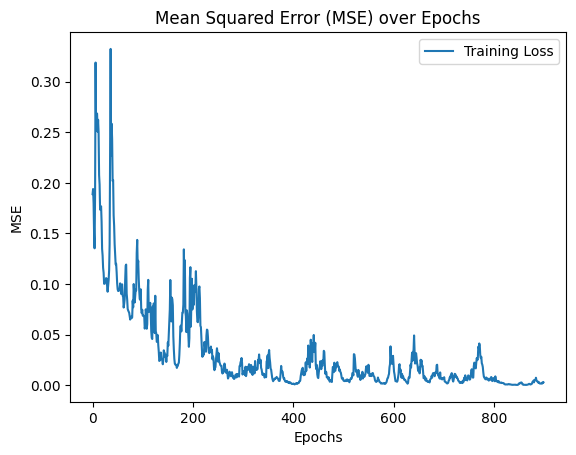

Function training took 13.5734 seconds
The function training took 13.573378562927246 seconds.


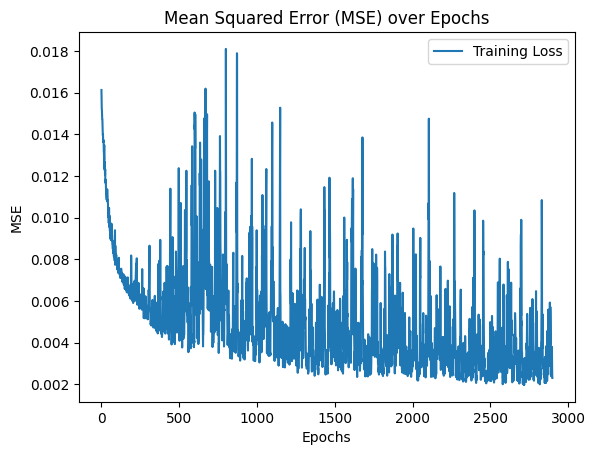

Test MSE: 0.002467188671321158
R^2: 0.9815354951692243


Text(0.5, 1.0, 'High fidelity model')

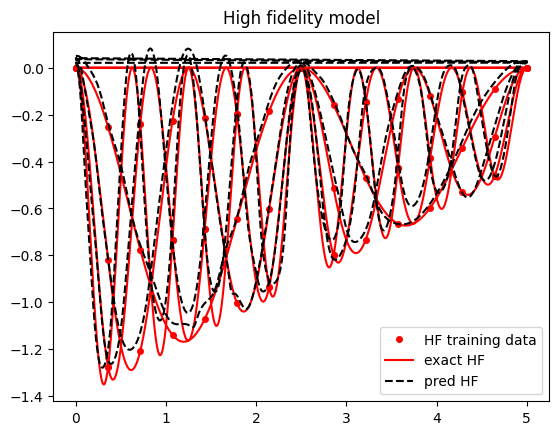

In [45]:
### 2 steps NEURAL NETWORK ###
# collection of parameters
bestLF_params = {
    'lr': 0.0255, 
    'kernel_init': 'glorot_uniform', 
    'opt': 'Adam'
}

best_params = {
    'kernel_init': 'uniform', 
    'l2weight': 0.00010018625799978436, 
    'lr': 0.07093837044166487, 
    'nodes': 74.0, 
    'opt': 'Adamax'
}

params = [bestLF_params, best_params]

N = [data["NepoLF"], data["NepoHF"]]
n = [data["Nlf"], data["Nhf"]]

# names of the networks 
names = ['LF', 'HF']

# collection of the parameters
definition_2steps = {
    "network_type": "2step",
    "names": names,
    "params": params,
    "data_train": [data["xlf"], data["xhf"]],
    "output_train": [data["Ylf"], data["Yhf"]],
    "N": N,
    "n": n,
    "train": True,
    "do_HPO": False,
    "verbose": False
}

# creation of 2 steps model 
final_model = NetworkFactory.build_network(**definition_2steps)

if final_model == -1:
    raise ValueError("Failed to build the network. Check the network type and parameters.")

y_test=final_model.prediction(data["datatest"])

(mse_MF,R_MF)=final_model.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

    #(mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))

### PLOT of predicted models ###
#LF single-fidelity



plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],y_test,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')


# Prediction of a parameter 2 step nn

In [46]:
deltas = np.linspace(2 / 5, 8 / 5, 4) * np.pi


In [47]:
deltas

array([1.25663706, 2.51327412, 3.76991118, 5.02654825])

Sampling chain 1/2


Running chain, α = 0.23: 100%|██████████| 2500/2500 [04:10<00:00,  9.97it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [04:18<00:00,  9.66it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.731]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.731  0.093   3.564    3.898      0.005    0.004     313.0     230.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.29554825]



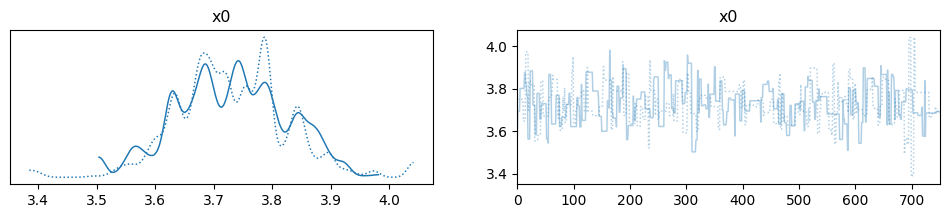

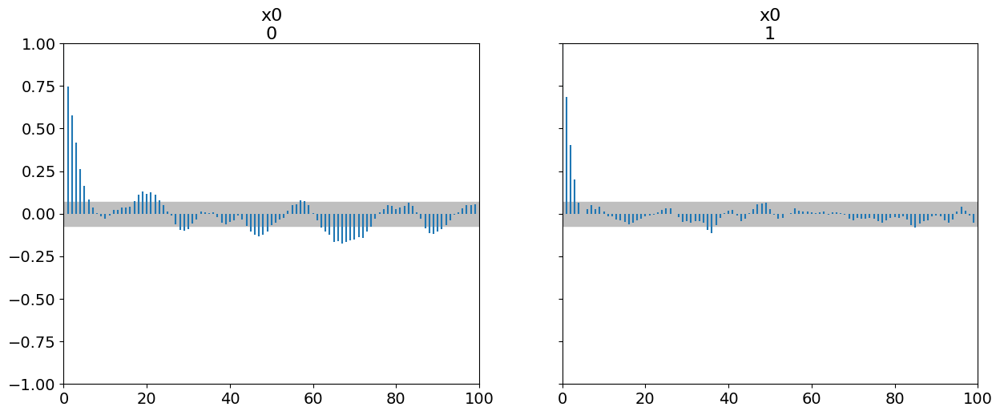

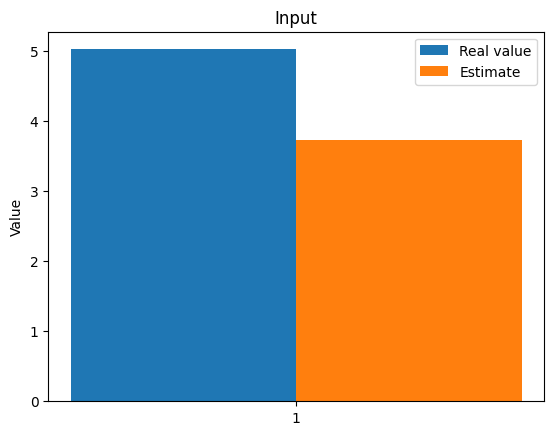

The function param_inverse took 511.5634479522705 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [04:17<00:00,  9.69it/s]


Sampling chain 2/2


Running chain, α = 0.33: 100%|██████████| 2500/2500 [04:16<00:00,  9.74it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.724]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.724  0.084   3.561    3.859      0.005    0.004     278.0     302.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [1.30254825]



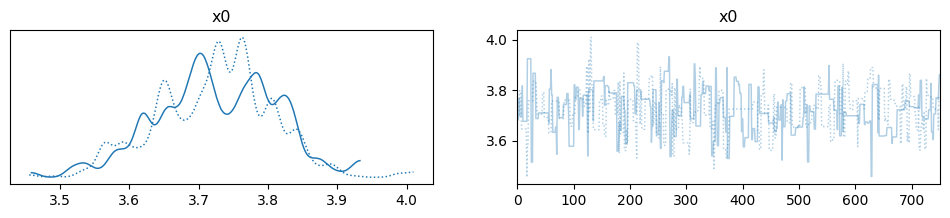

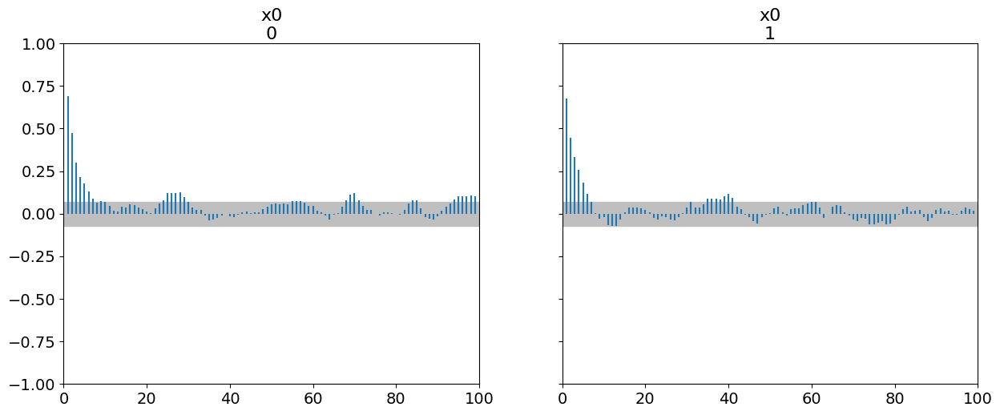

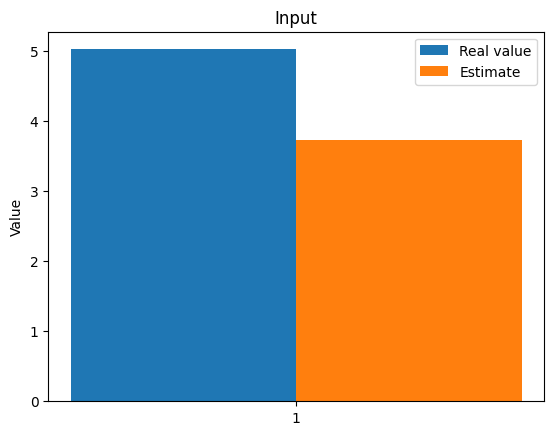

The function param_inverse took 515.6983406543732 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 2500/2500 [04:17<00:00,  9.72it/s]


Sampling chain 2/2


Running chain, α = 0.14: 100%|██████████| 2500/2500 [04:16<00:00,  9.73it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.216]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.216  0.99   1.416    5.256      0.068    0.048     216.0     302.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [1.81054825]



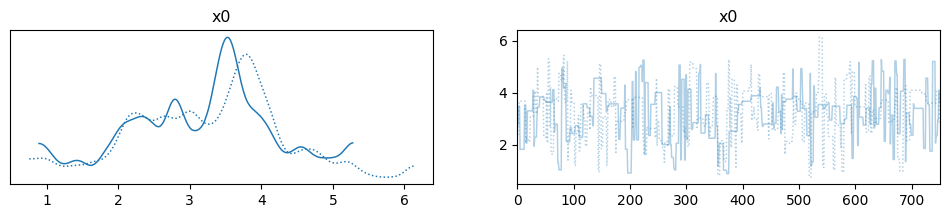

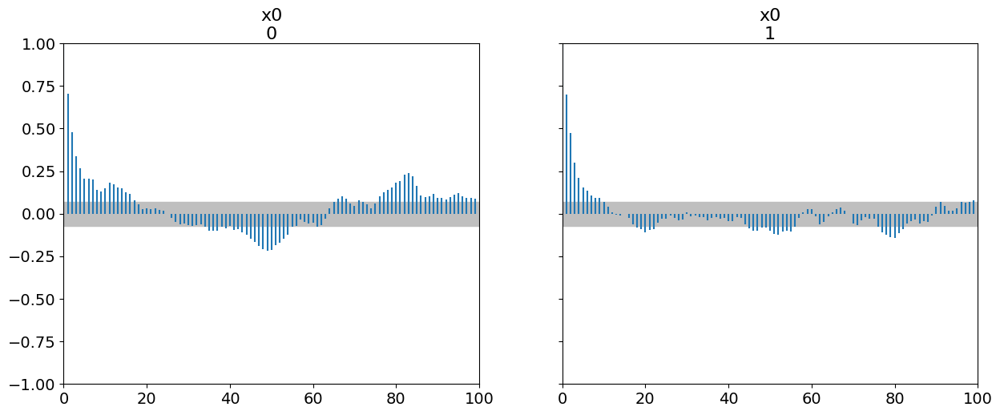

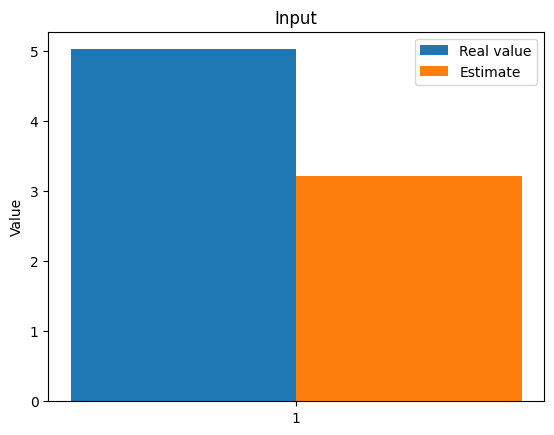

The function param_inverse took 527.3231744766235 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:16<00:00,  9.74it/s]


Sampling chain 2/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [04:17<00:00,  9.72it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.264]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.264  0.877   1.681    5.042      0.048    0.034     319.0     333.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [1.76254825]



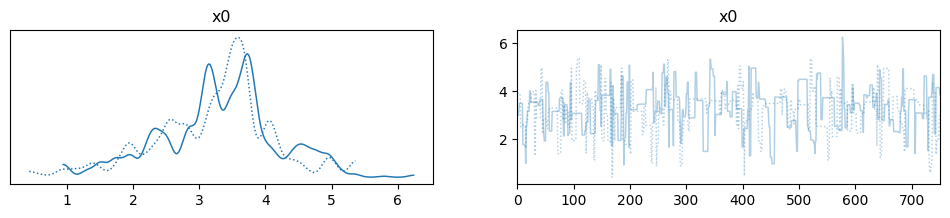

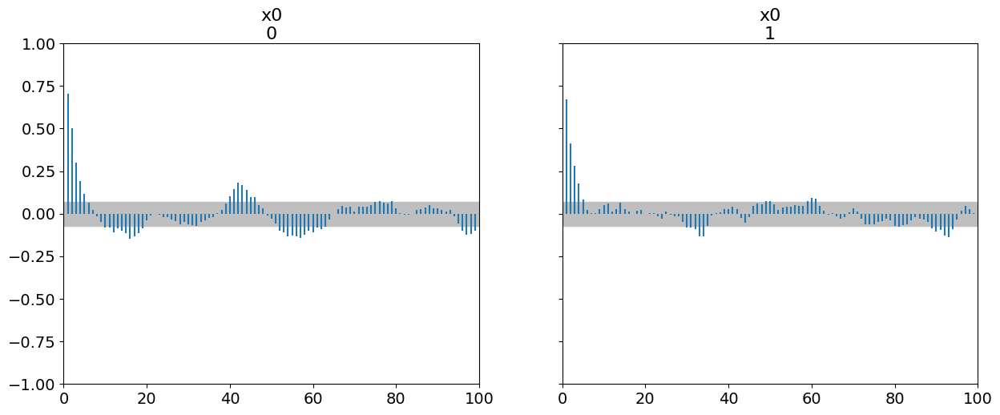

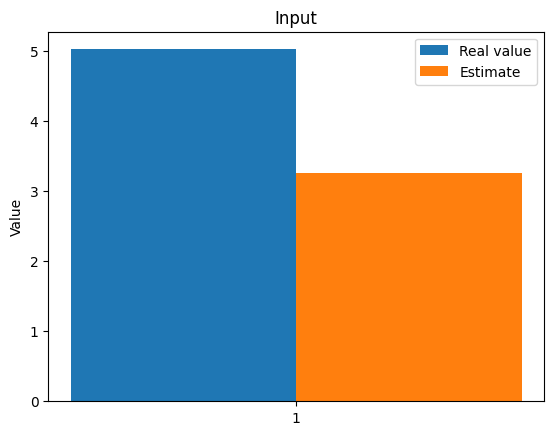

The function param_inverse took 515.0592470169067 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 2500/2500 [04:06<00:00, 10.15it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:05<00:00, 10.19it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.687]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.687  0.114   3.491    3.886      0.007    0.005     248.0     224.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.33954825]



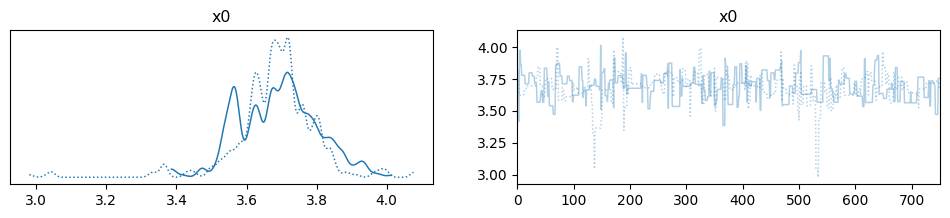

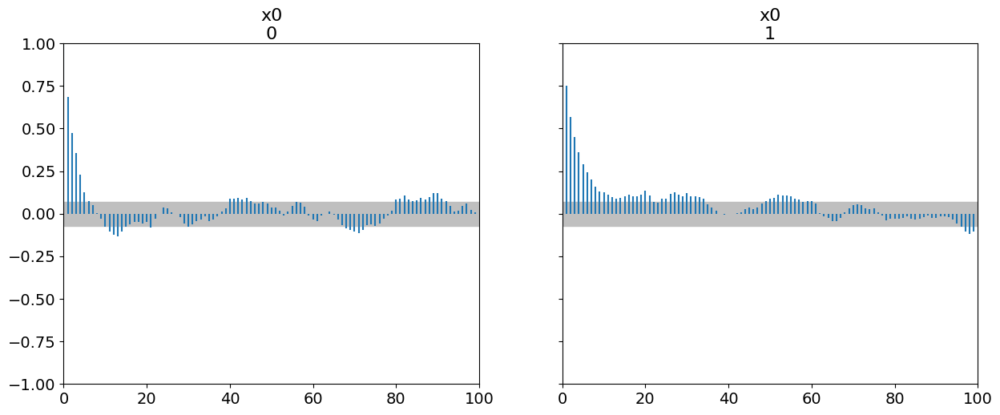

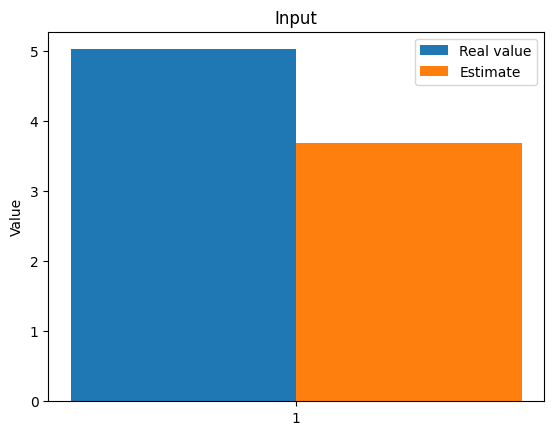

The function param_inverse took 492.80179476737976 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:06<00:00, 10.14it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.68]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.68  0.118   3.507    3.928      0.009    0.006     215.0     178.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.34654825]



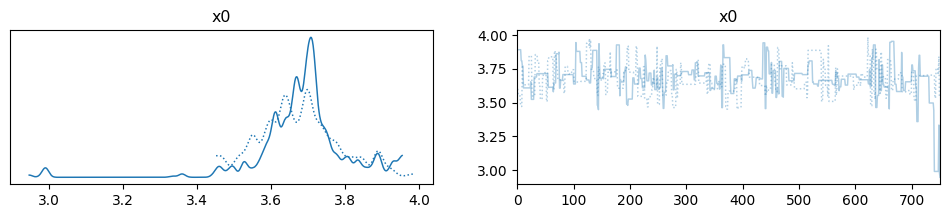

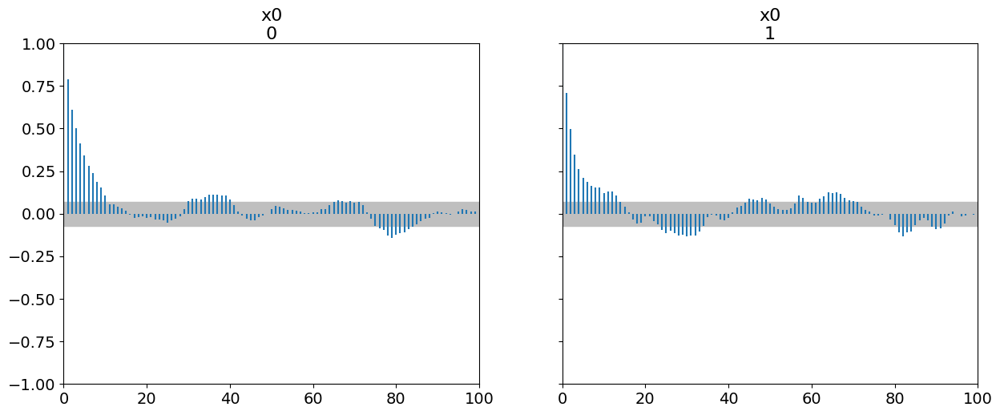

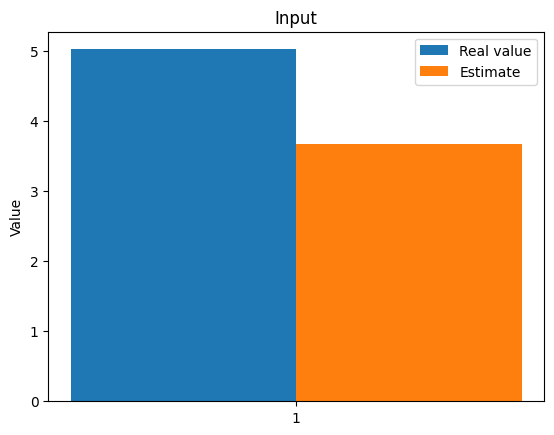

The function param_inverse took 492.9401915073395 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.052]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.052  0.907   1.405    4.607      0.056     0.04     265.0     279.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.97454825]



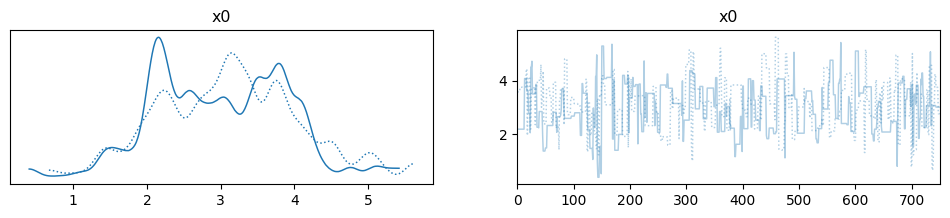

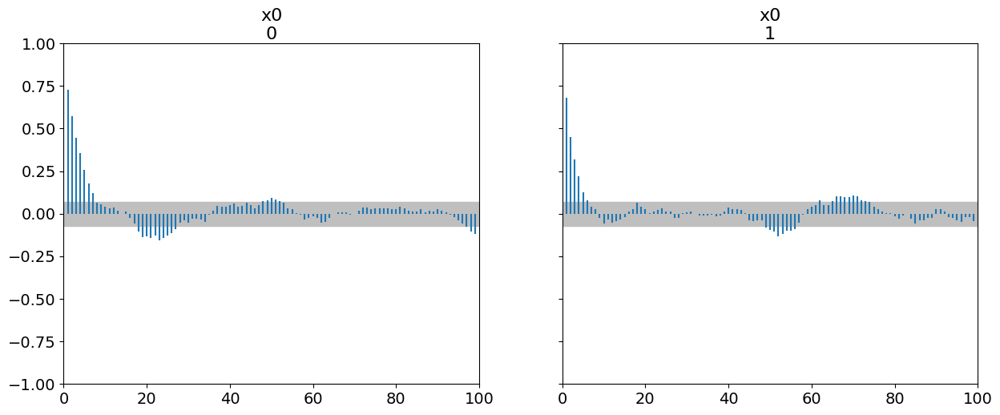

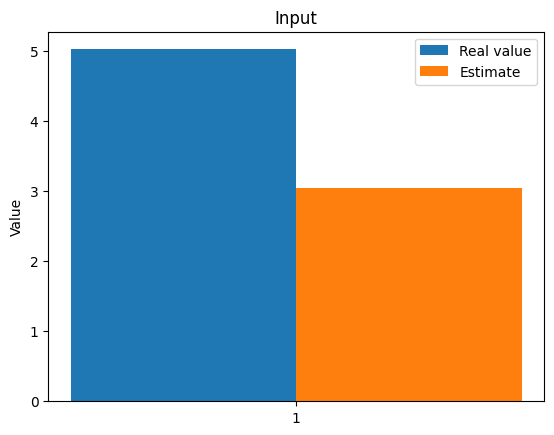

The function param_inverse took 490.8680591583252 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [04:05<00:00, 10.18it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:05<00:00, 10.20it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.125]
     mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
x0  3.125  0.9   1.558    4.945      0.048    0.035     356.0     304.0   1.02
Autocorrelation...
the difference between estimated values [1.90154825]



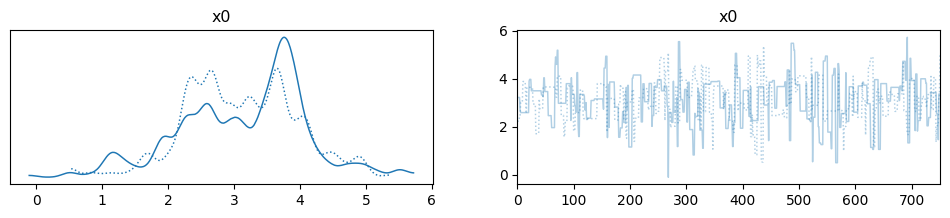

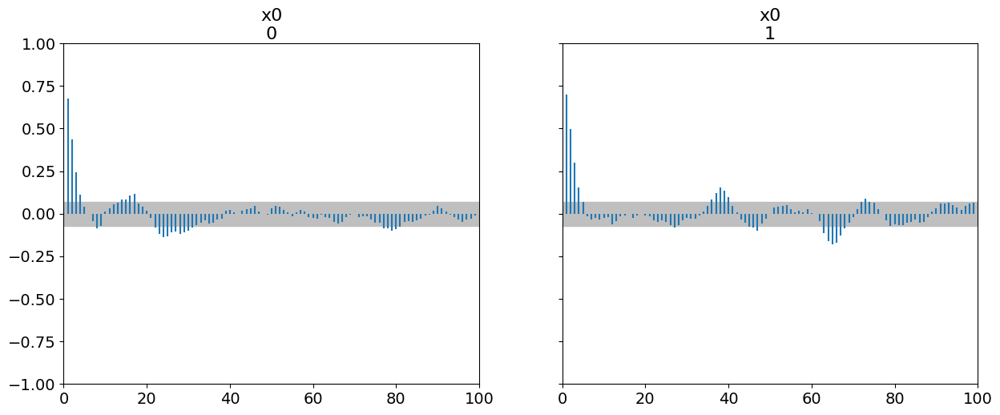

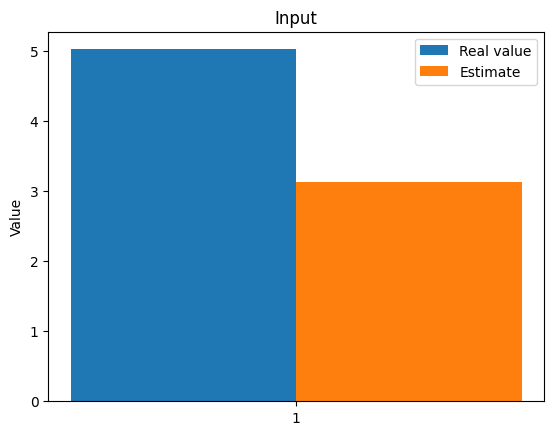

The function param_inverse took 491.8658800125122 seconds.
Sampling chain 1/2


Running chain, α = 0.39: 100%|██████████| 2500/2500 [04:04<00:00, 10.23it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:04<00:00, 10.23it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.667]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.667  1.105   1.129     5.35       0.07     0.05     252.0     281.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.35954825]



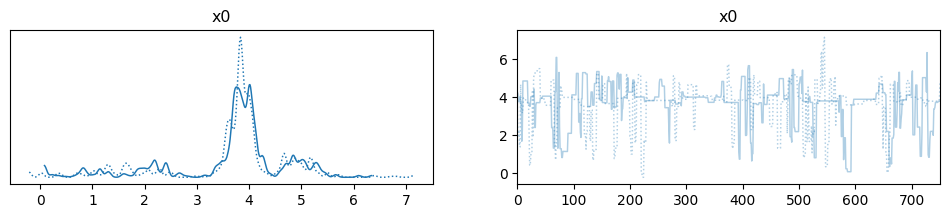

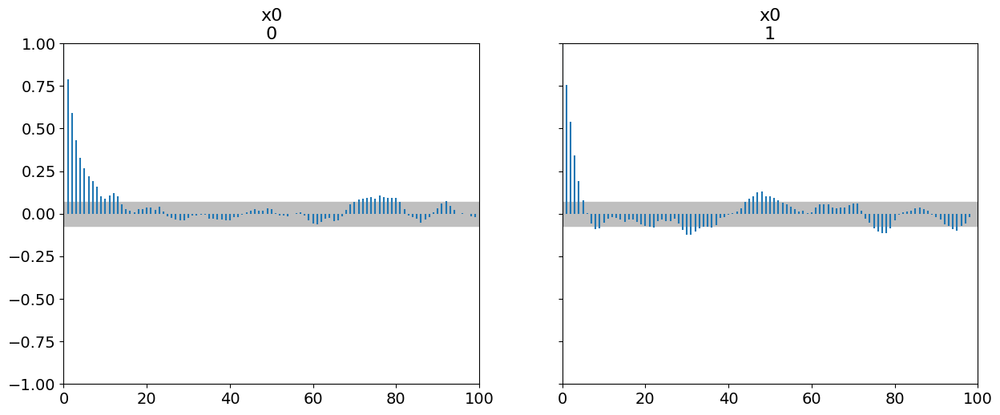

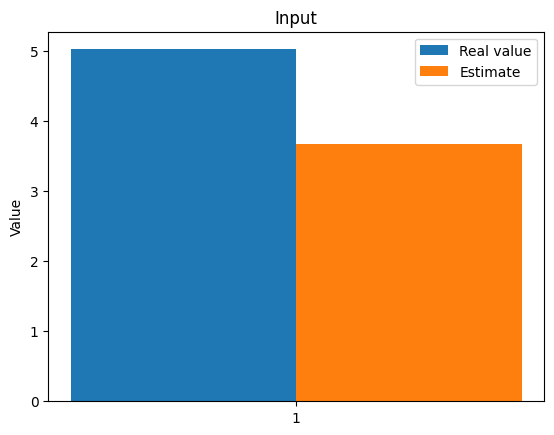

The function param_inverse took 507.73299527168274 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [04:04<00:00, 10.23it/s]


Sampling chain 2/2


Running chain, α = 0.12: 100%|██████████| 2500/2500 [04:05<00:00, 10.19it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.817]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.817  0.976   1.633    5.447      0.076    0.054     177.0     202.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [1.20954825]



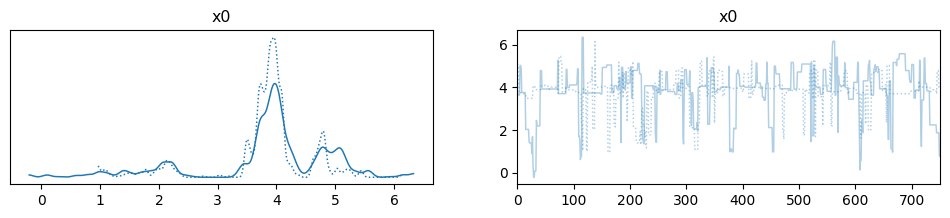

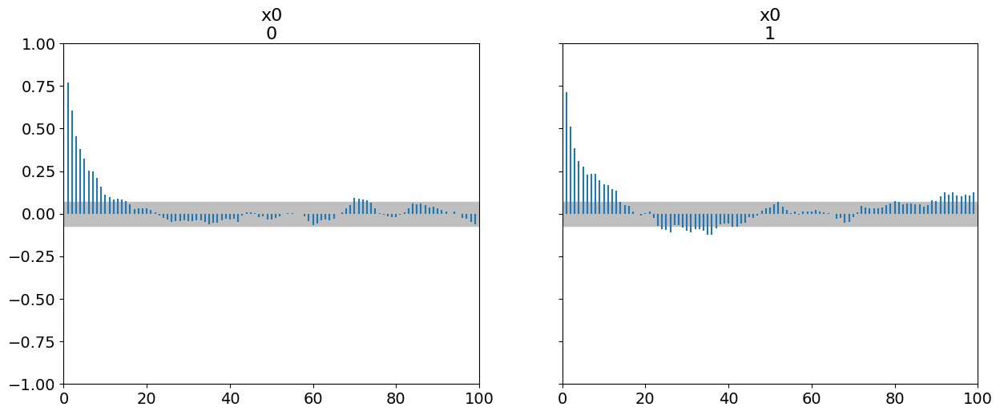

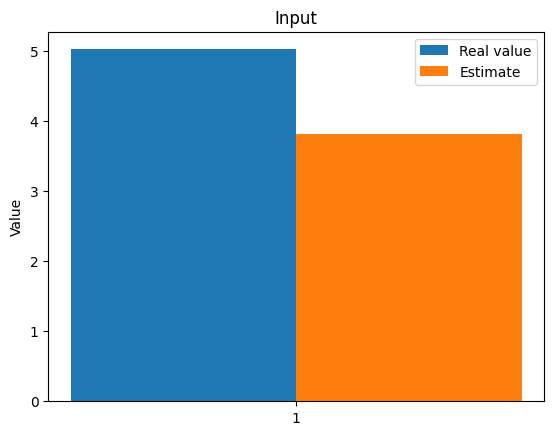

The function param_inverse took 501.1288831233978 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:04<00:00, 10.24it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.07]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.07  1.082   1.319    4.992      0.072    0.051     219.0     205.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.95654825]



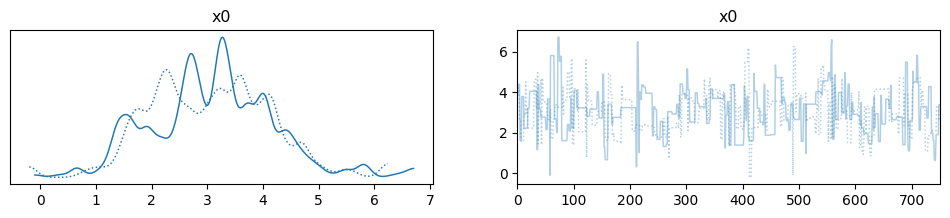

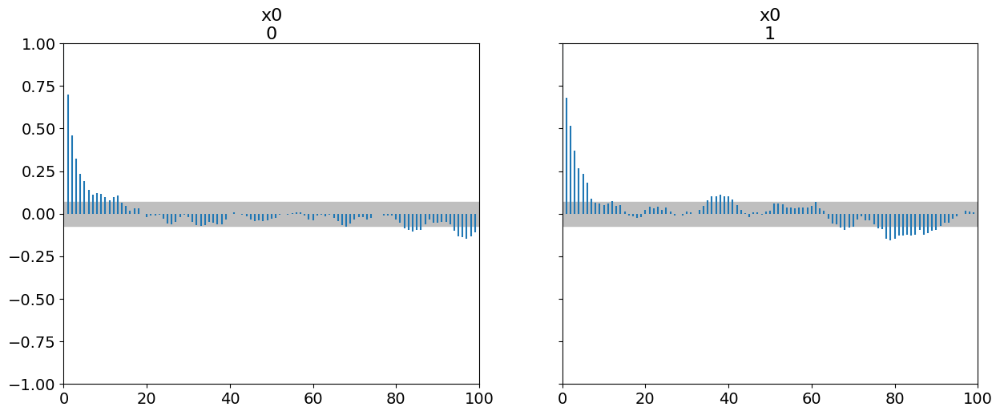

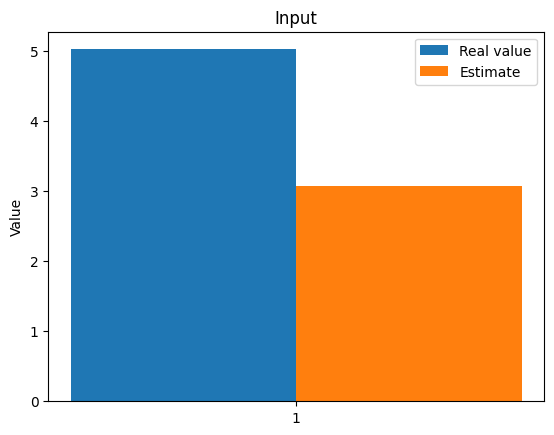

The function param_inverse took 502.73249554634094 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:04<00:00, 10.23it/s]


Sampling chain 2/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.099]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.099  1.09   1.029    5.185      0.089    0.063     150.0     181.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.92754825]



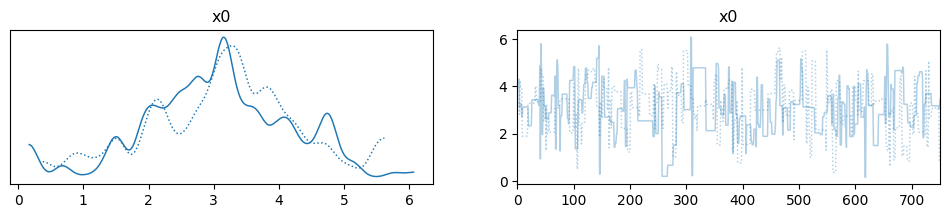

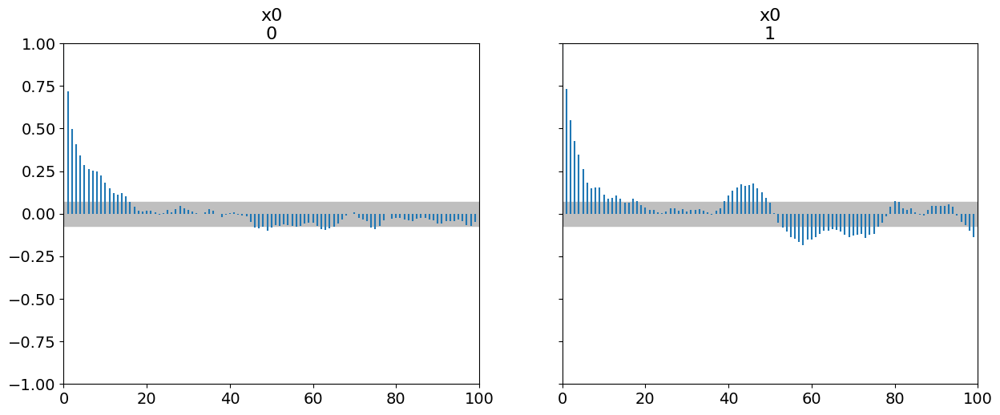

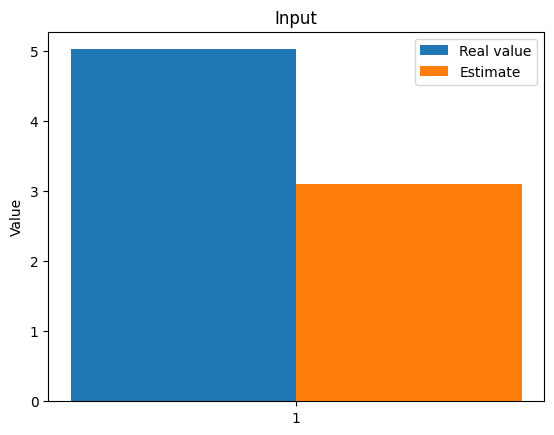

The function param_inverse took 503.4811120033264 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [04:18<00:00,  9.66it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [04:18<00:00,  9.67it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.762]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.762  0.084    3.59     3.91      0.005    0.003     312.0     267.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.26454825]



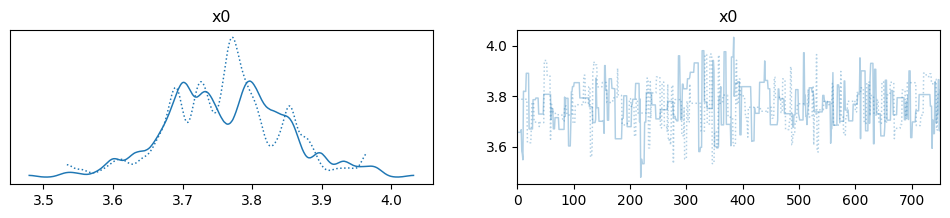

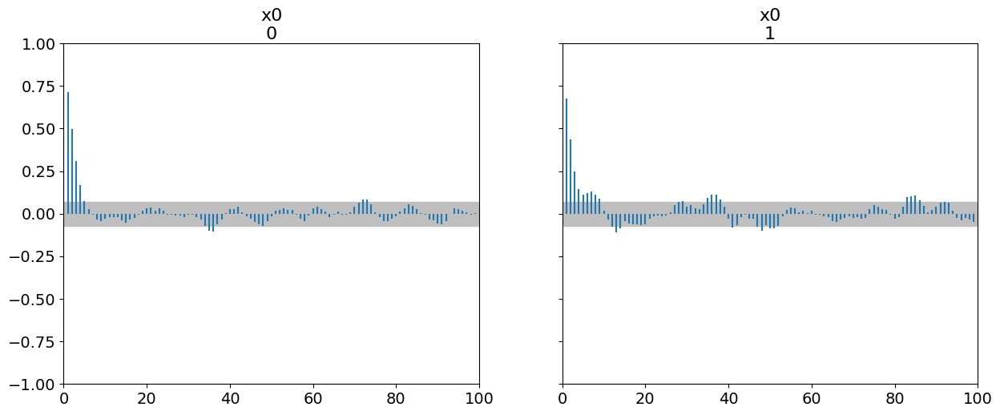

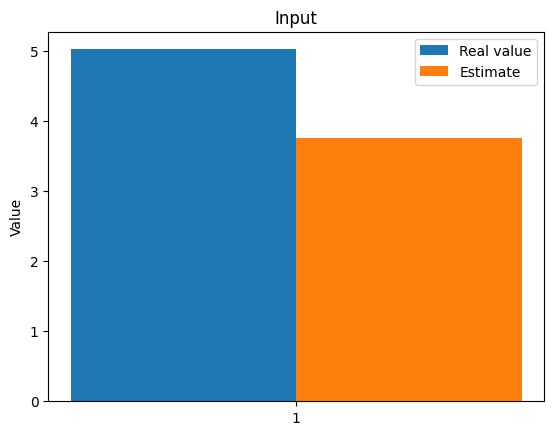

The function param_inverse took 518.6114935874939 seconds.
Sampling chain 1/2


Running chain, α = 0.18: 100%|██████████| 2500/2500 [04:18<00:00,  9.67it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [04:17<00:00,  9.71it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.757]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.757  0.077     3.6    3.885      0.005    0.004     255.0     224.0   

    r_hat  
x0   1.06  
Autocorrelation...
the difference between estimated values [1.26954825]



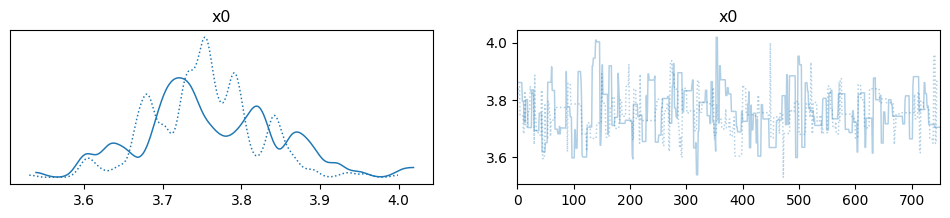

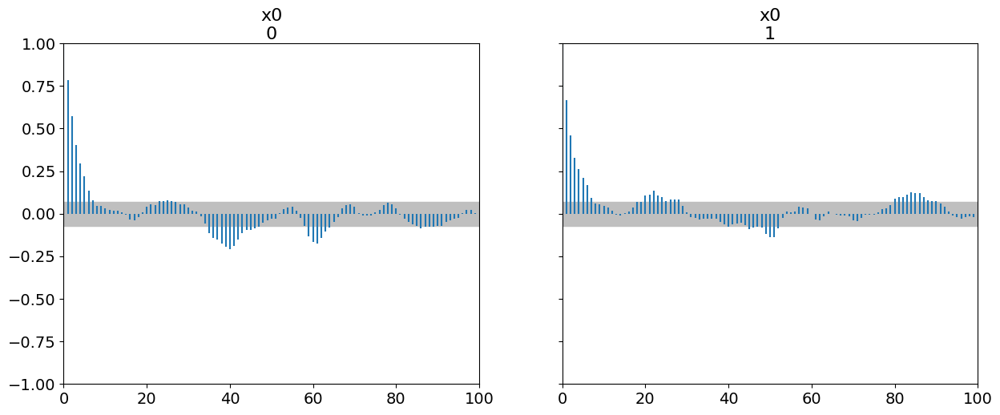

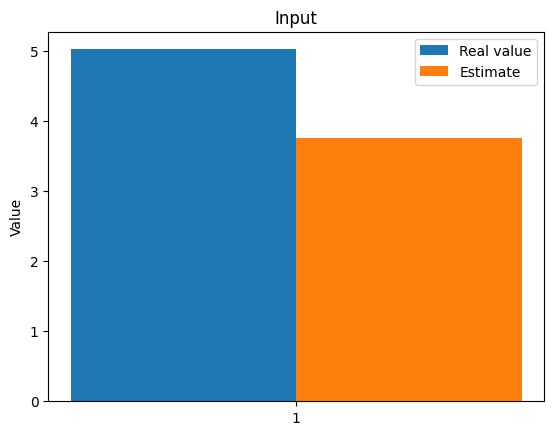

The function param_inverse took 528.6356287002563 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 2500/2500 [04:18<00:00,  9.68it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:18<00:00,  9.68it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.337]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.337  0.942   1.646     5.16      0.051    0.037     341.0     315.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.68954825]



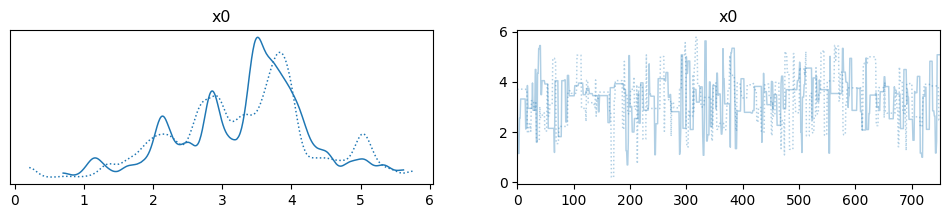

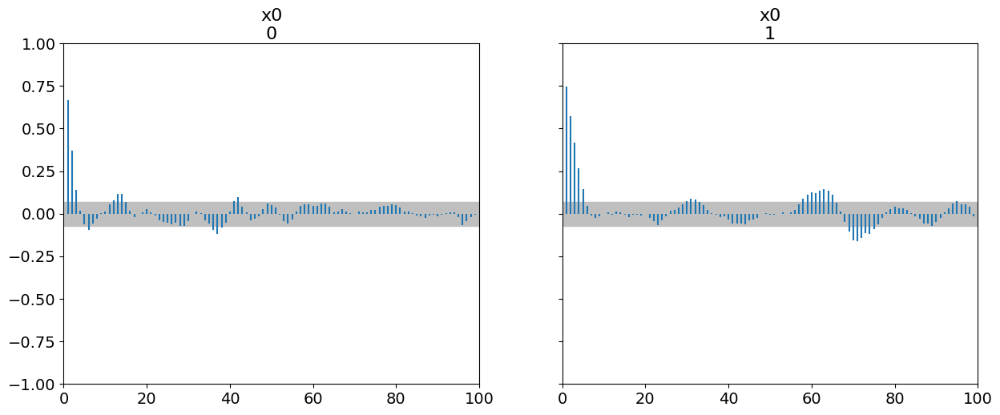

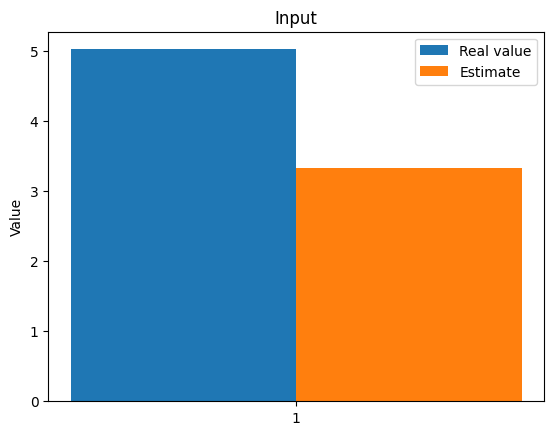

The function param_inverse took 529.7319331169128 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:17<00:00,  9.71it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:16<00:00,  9.73it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.299]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.299  0.928   1.253    4.873      0.054    0.039     290.0     309.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [1.72754825]



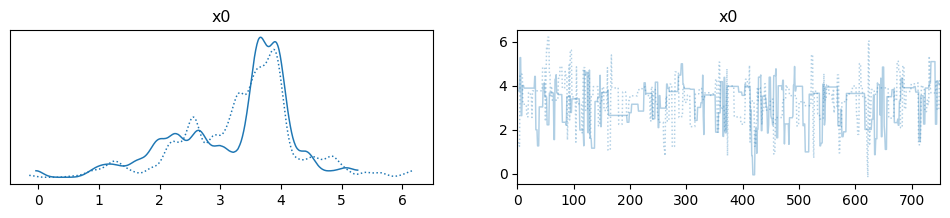

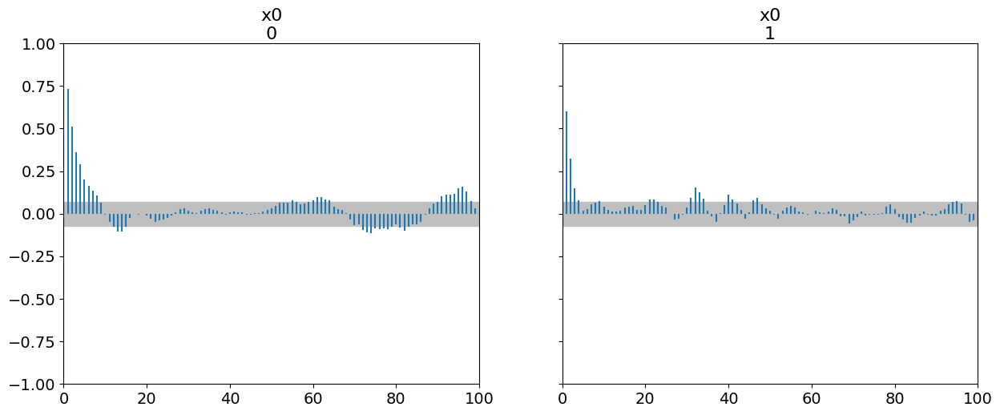

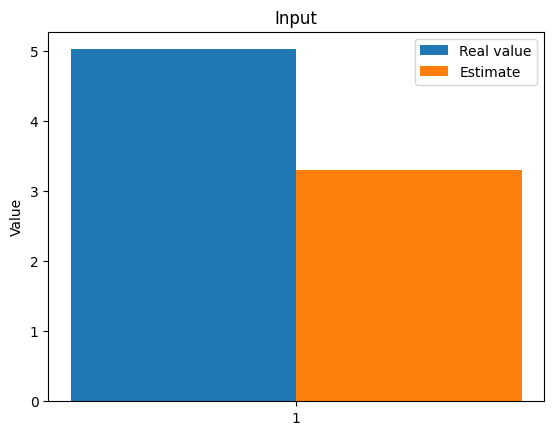

The function param_inverse took 530.4267528057098 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [04:05<00:00, 10.17it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:05<00:00, 10.17it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.737]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.737  0.122   3.526    3.944      0.008    0.006     228.0     171.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.28954825]



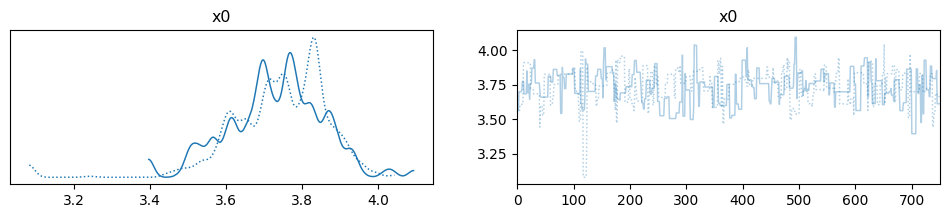

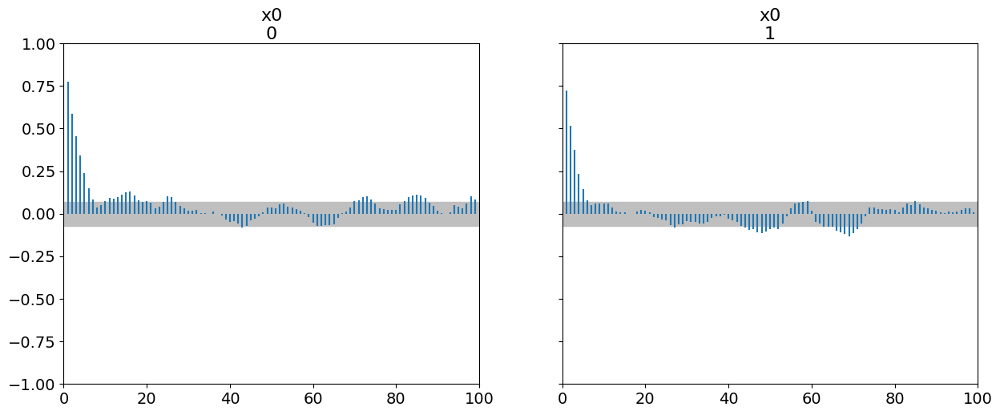

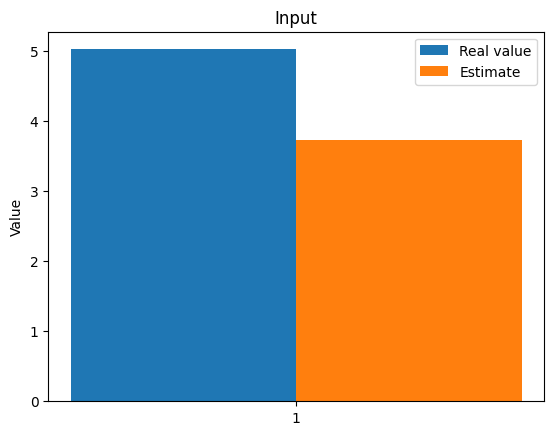

The function param_inverse took 506.5727217197418 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [04:04<00:00, 10.22it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:05<00:00, 10.20it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.779]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.779  0.16   3.559    3.976      0.012    0.009     273.0     180.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [1.24754825]



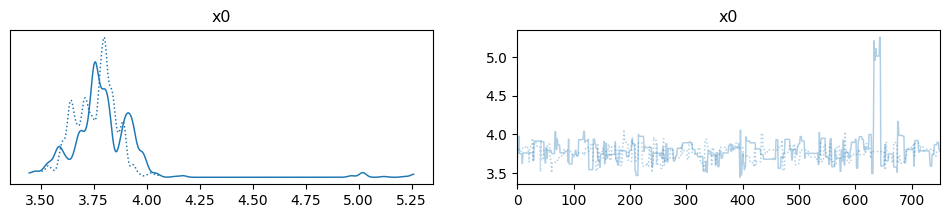

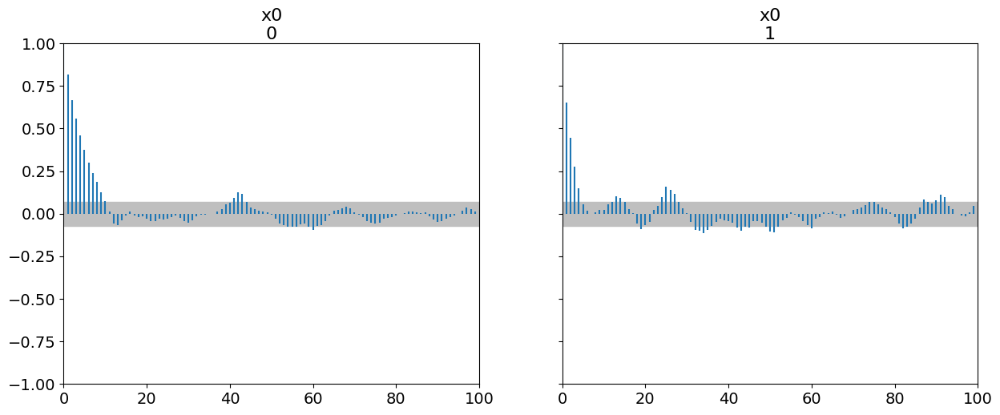

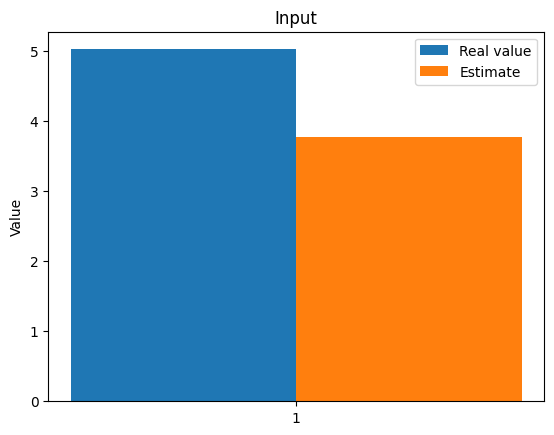

The function param_inverse took 490.6771275997162 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:06<00:00, 10.16it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [04:06<00:00, 10.16it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.126]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.126  0.942   1.528    5.094      0.074    0.053     168.0     164.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [1.90054825]



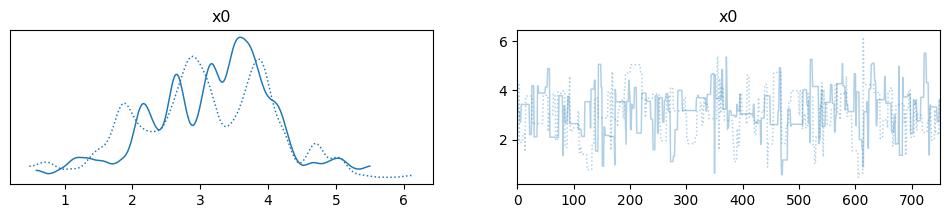

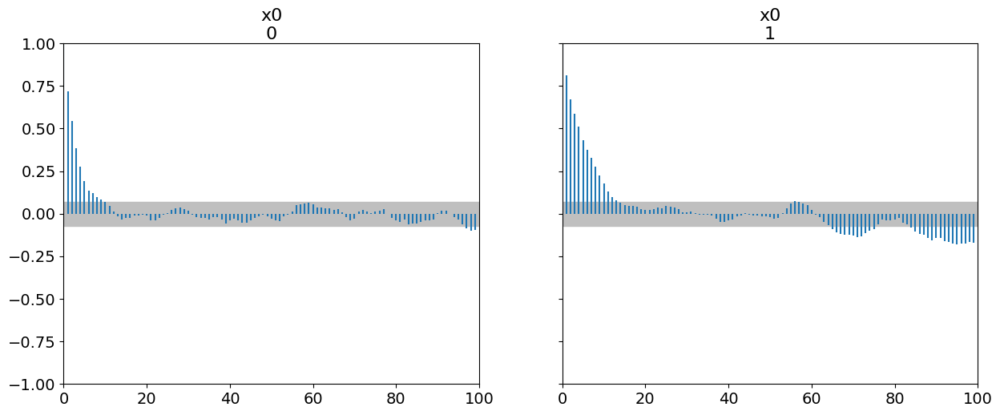

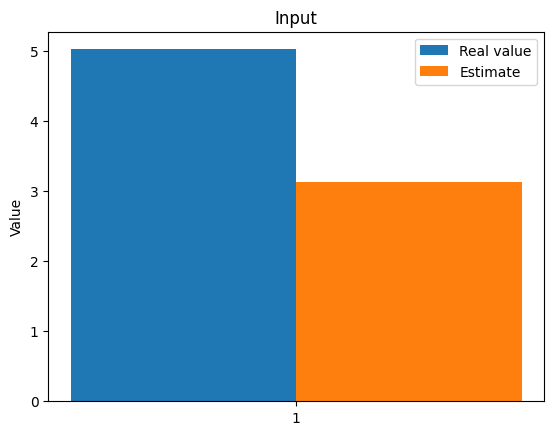

The function param_inverse took 493.45414686203003 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [04:07<00:00, 10.10it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:07<00:00, 10.10it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.154]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.154  0.999   1.228    4.784      0.071     0.05     192.0     214.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.87254825]



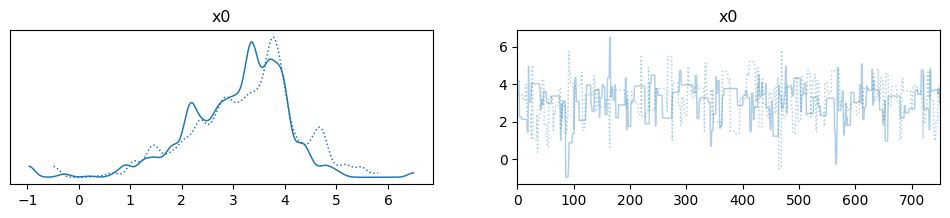

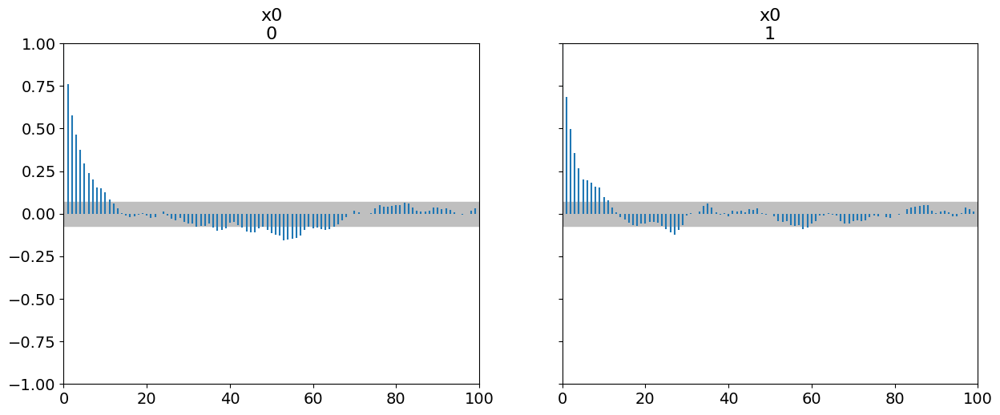

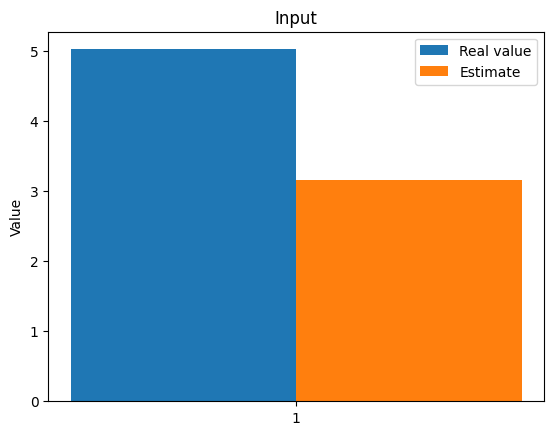

The function param_inverse took 496.4495463371277 seconds.
Sampling chain 1/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [04:06<00:00, 10.14it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:05<00:00, 10.20it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.856]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.856  0.912   1.553    5.252      0.072    0.051     179.0     215.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.17054825]



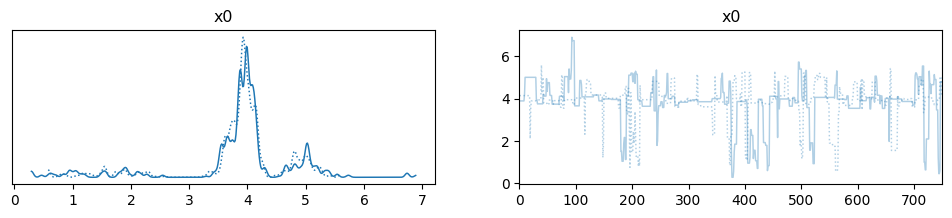

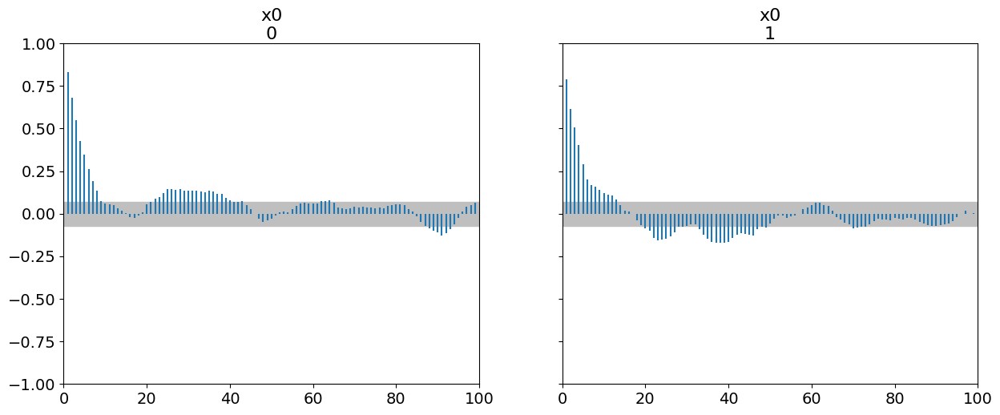

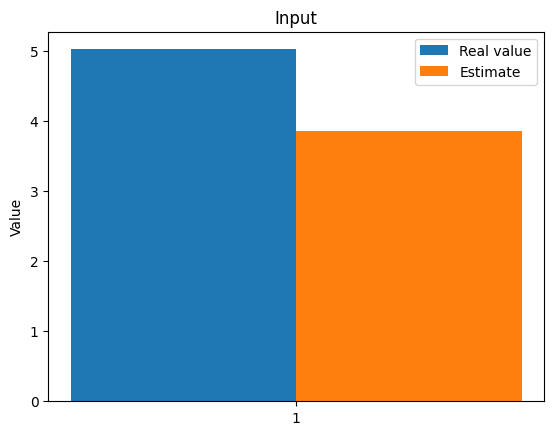

The function param_inverse took 505.12435126304626 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [04:04<00:00, 10.21it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:04<00:00, 10.22it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.938]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.938  1.031   1.491    5.548      0.091    0.065     176.0     128.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.08854825]



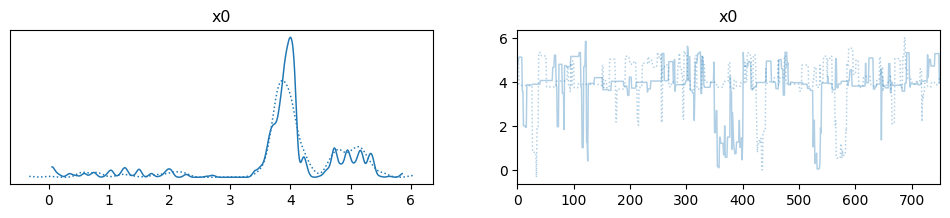

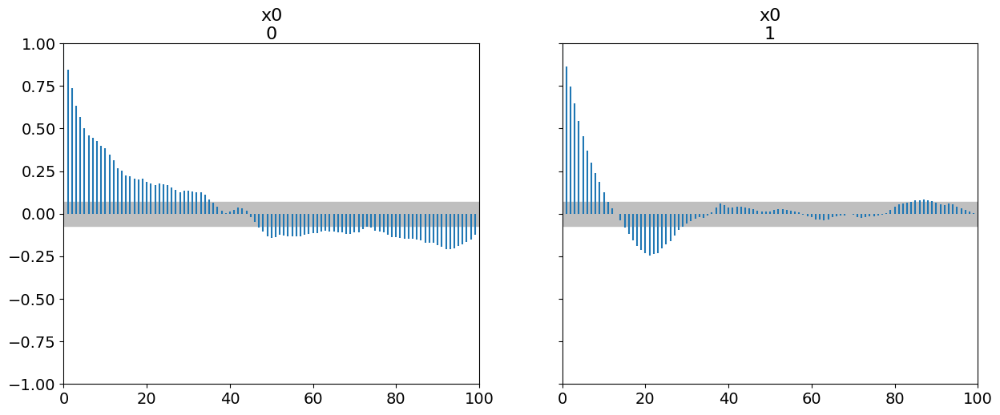

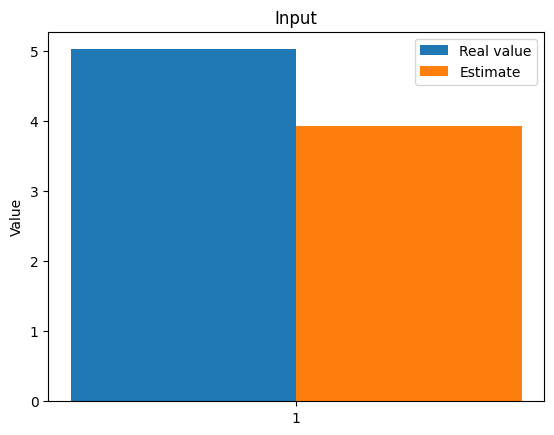

The function param_inverse took 490.7766032218933 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:06<00:00, 10.13it/s]


Sampling chain 2/2


Running chain, α = 0.29: 100%|██████████| 2500/2500 [04:05<00:00, 10.19it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.083]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.083  1.021   1.185    4.762       0.07     0.05     219.0     251.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.94354825]



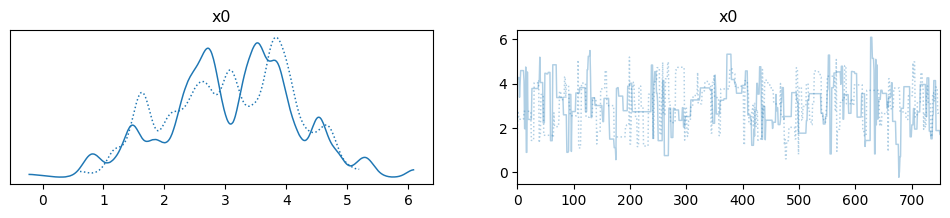

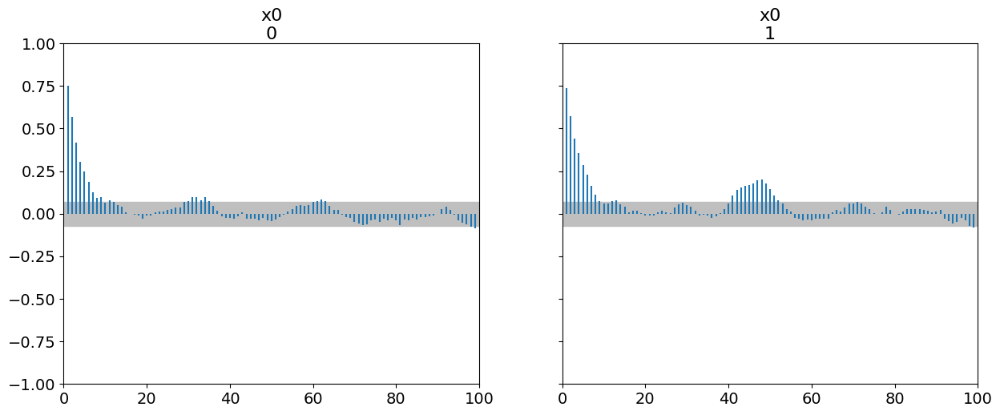

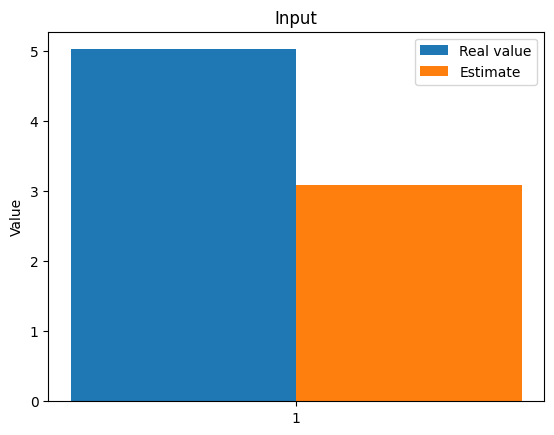

The function param_inverse took 493.6478931903839 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [04:05<00:00, 10.20it/s]


Sampling chain 2/2


Running chain, α = 0.16: 100%|██████████| 2500/2500 [04:07<00:00, 10.12it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.132]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.132  0.941   1.468    4.695      0.059    0.042     265.0     265.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [1.89454825]



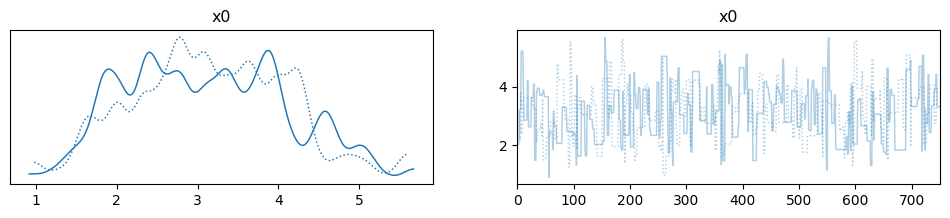

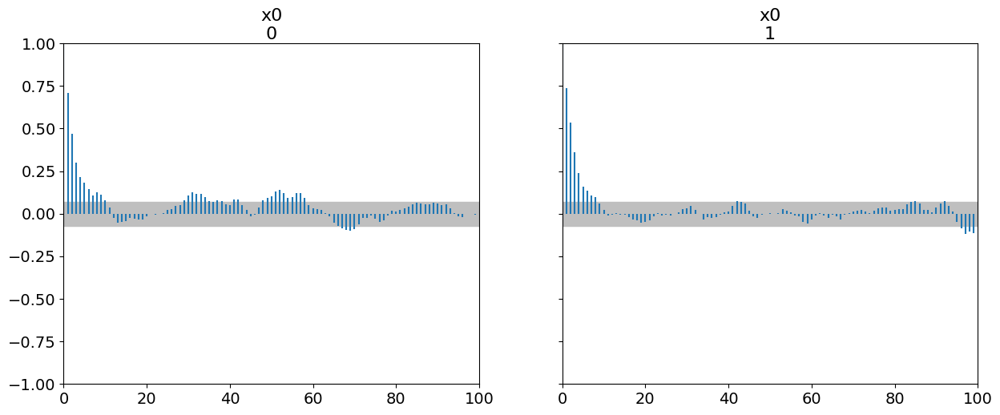

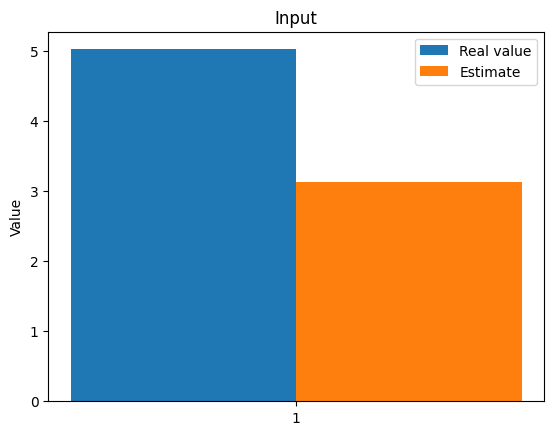

The function param_inverse took 506.7971382141113 seconds.
The best estimate is given by: sigma_noise=0.1, number of data=10, sigma=0.5, rwmh_scaling=1.0
(50,)
real values are [5.02654825]
Sampling chain 1/2


IndexError: tuple index out of range

In [49]:
mean_prior = np.array([3.])
cov_prior = np.diag([1.])
sigma_noise = [0.05,0.1]
n_data = [50,30,10]
parameters = np.array([deltas[-1]])
sigma = np.array([ 0.5,2.])
rwmh_scaling = np.array([2., 1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 2500
burnin = 1750
n_chains = 2
algo = "AM"


estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)

estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)





In [51]:

estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)



(50,)
real values are [5.02654825]
Sampling chain 1/2
Sampling chain 1/2


Running chain, α = 0.10: 100%|██████████| 100/100 [00:09<00:00, 11.08it/s]


Sampling chain 2/2


Running chain, α = 0.10: 100%|██████████| 100/100 [00:10<00:00,  9.50it/s]


Sampling chain 1/2


IndexError: tuple index out of range

Sampling chain 1/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [08:37<00:00,  4.83it/s]


Sampling chain 2/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [05:12<00:00,  7.99it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.554]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.554  0.131   2.282    2.775      0.009    0.006     211.0     299.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [0.04072588]



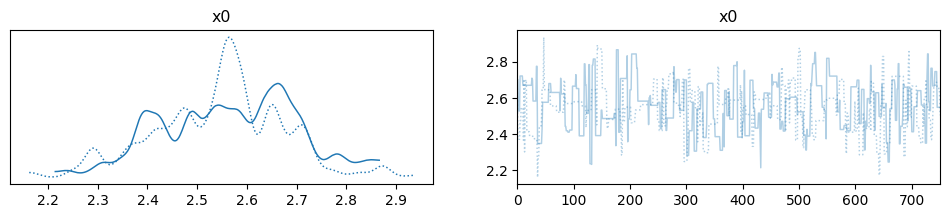

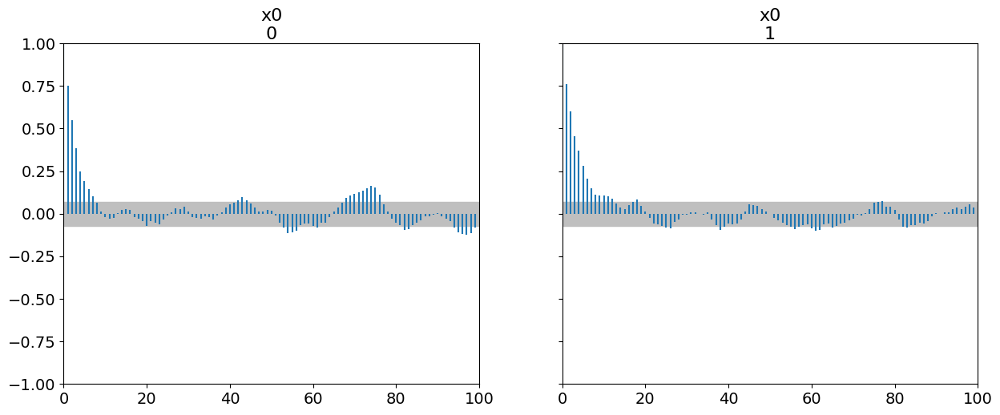

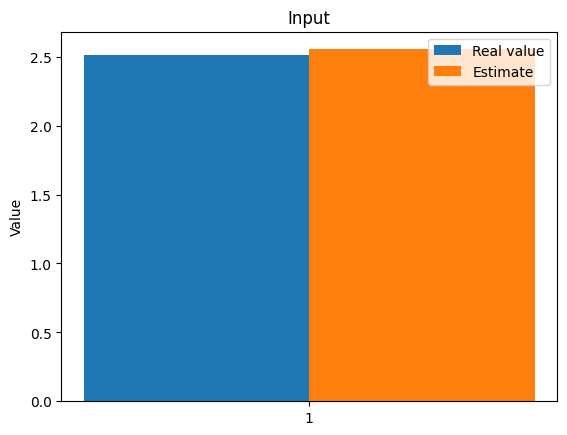

The function param_inverse took 877.8957123756409 seconds.
Sampling chain 1/2


Running chain, α = 0.16: 100%|██████████| 2500/2500 [05:34<00:00,  7.48it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [05:37<00:00,  7.41it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.527]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.527  0.129   2.285     2.76       0.01    0.007     186.0     131.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.01372588]



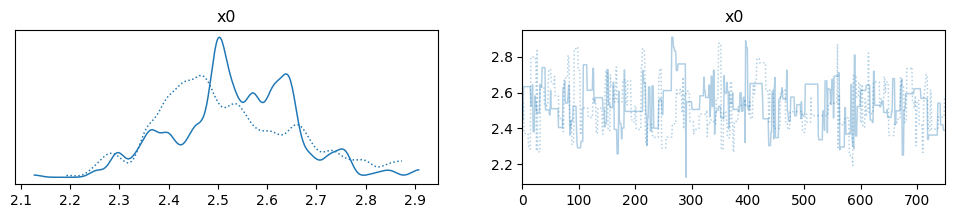

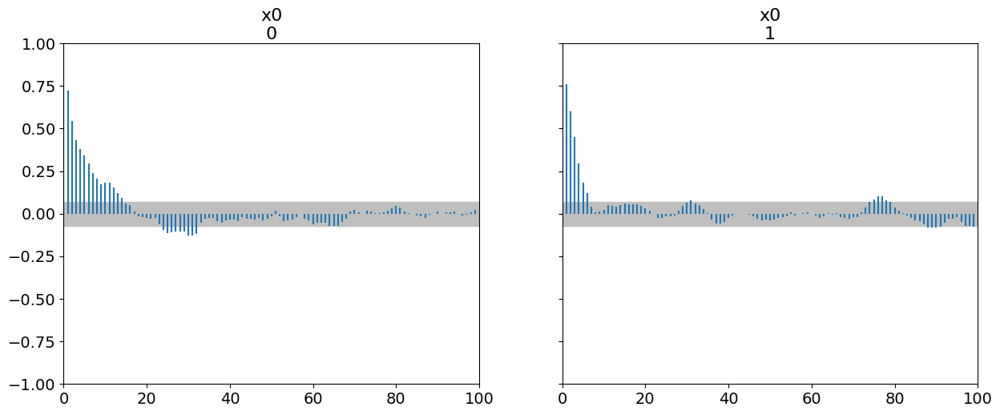

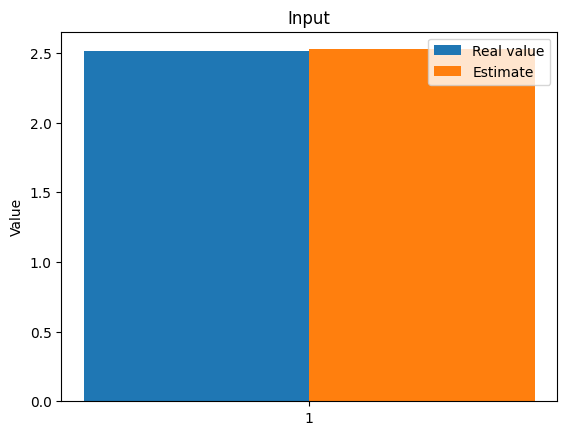

The function param_inverse took 673.2590415477753 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [05:37<00:00,  7.40it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 2500/2500 [05:37<00:00,  7.41it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.88]
    mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
x0  2.88  0.96   1.098    4.784      0.062    0.045     246.0     297.0   1.02
Autocorrelation...
the difference between estimated values [0.36672588]



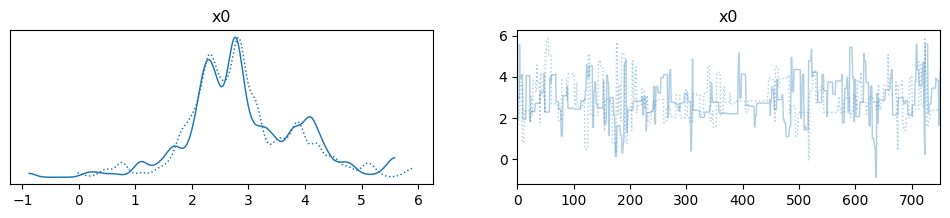

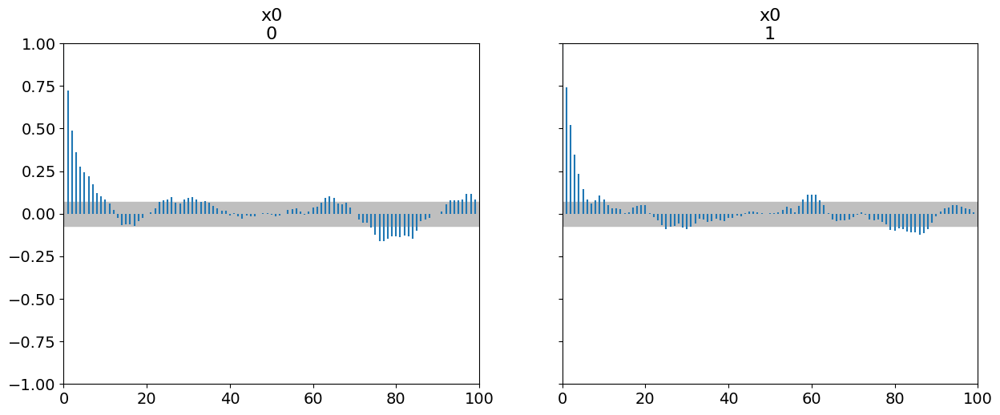

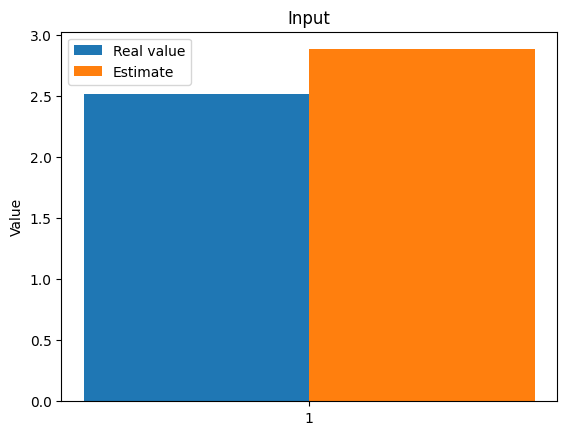

The function param_inverse took 689.430463552475 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [05:37<00:00,  7.41it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 2500/2500 [05:37<00:00,  7.40it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.897]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.897  0.822   1.419    4.661      0.044    0.033     334.0     322.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.38372588]



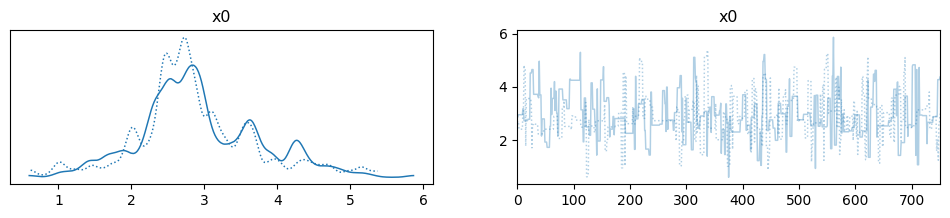

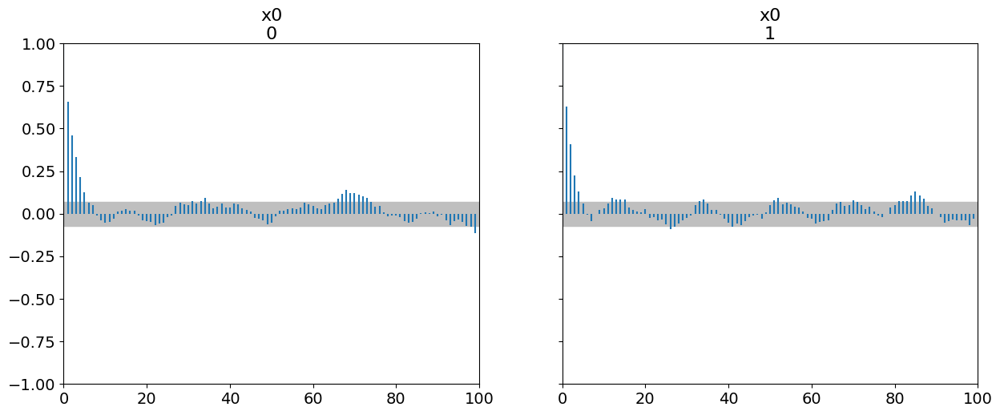

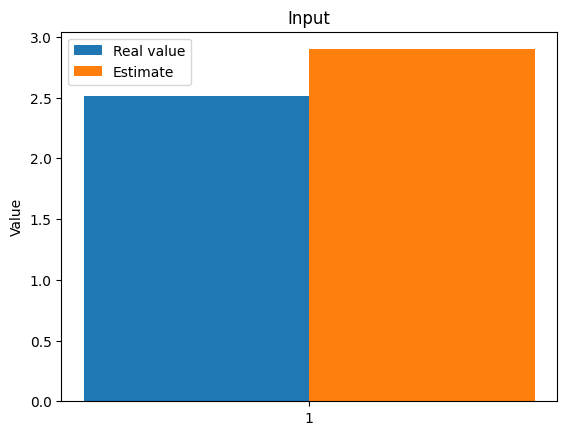

The function param_inverse took 677.0304400920868 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [05:21<00:00,  7.78it/s]


Sampling chain 2/2


Running chain, α = 0.31: 100%|██████████| 2500/2500 [05:22<00:00,  7.75it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.483]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.483  0.16   2.137    2.755      0.013     0.01     148.0     114.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.03027412]



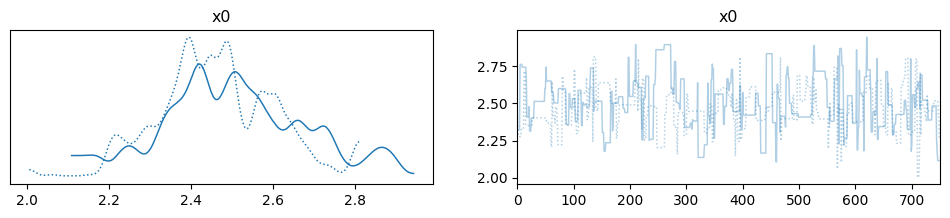

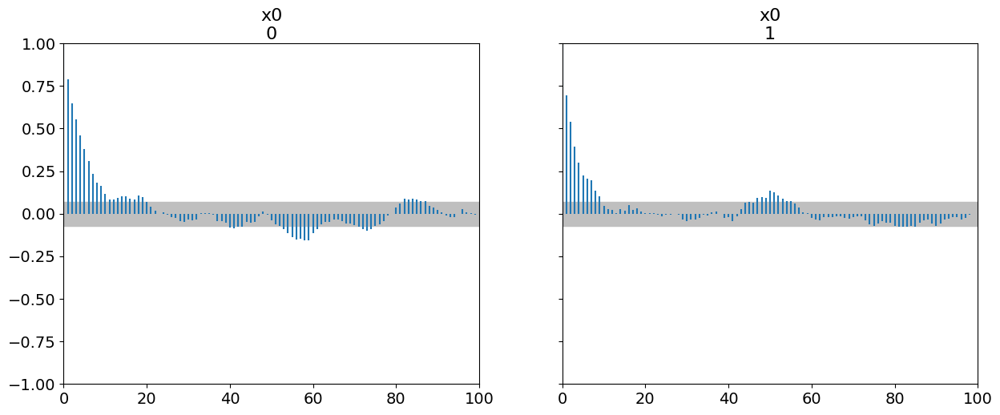

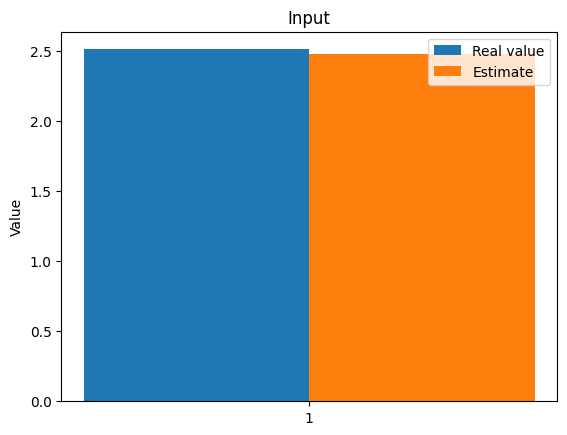

The function param_inverse took 656.6628136634827 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [05:21<00:00,  7.78it/s]


Sampling chain 2/2


Running chain, α = 0.35: 100%|██████████| 2500/2500 [05:24<00:00,  7.71it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.494]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.494  0.148   2.215    2.776      0.009    0.006     266.0     213.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [0.01927412]



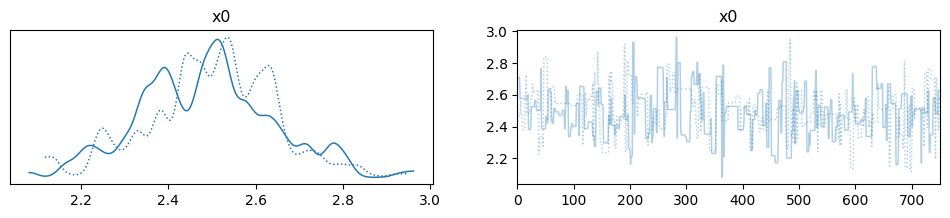

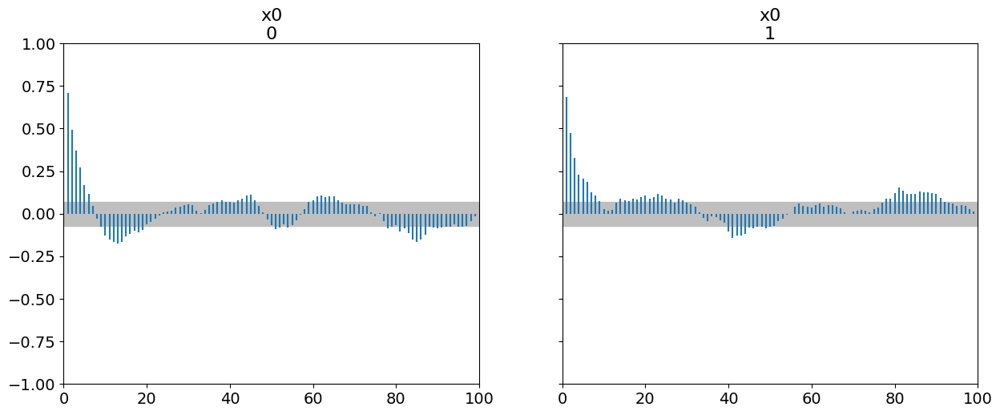

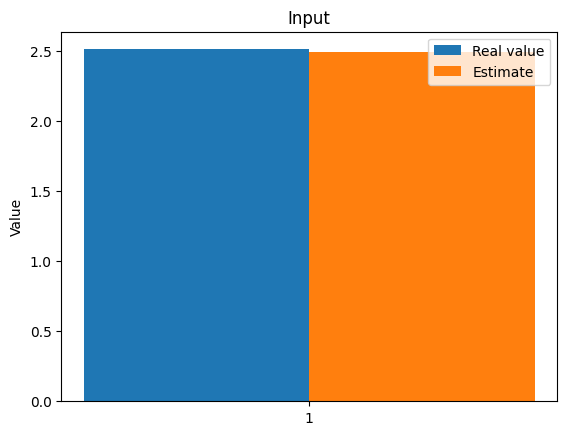

The function param_inverse took 660.1736235618591 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 2500/2500 [05:21<00:00,  7.77it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [05:22<00:00,  7.76it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.938]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.938  0.898   1.286    4.557      0.057    0.042     256.0     225.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.42472588]



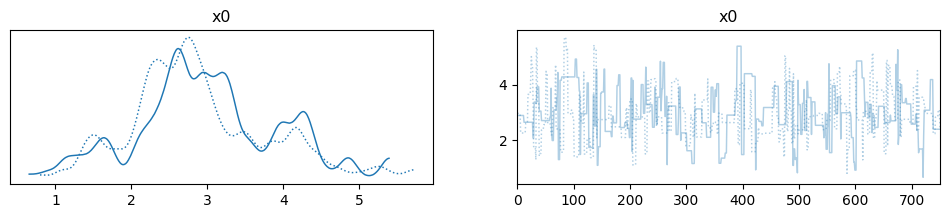

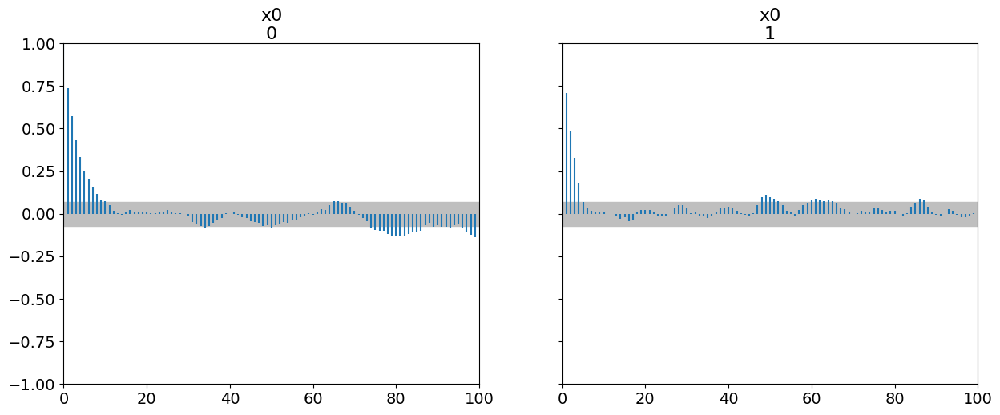

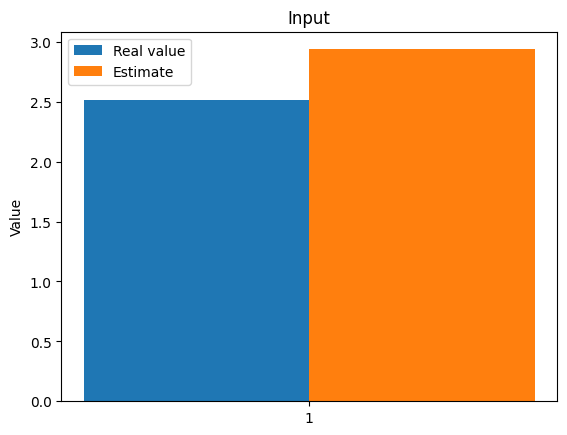

The function param_inverse took 666.4852070808411 seconds.
Sampling chain 1/2


Running chain, α = 0.34: 100%|██████████| 2500/2500 [05:22<00:00,  7.75it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [05:23<00:00,  7.73it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.89]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.89  0.871   1.467    4.712      0.055     0.04     255.0     254.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [0.37672588]



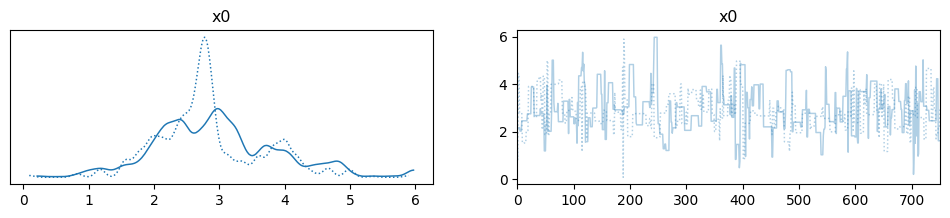

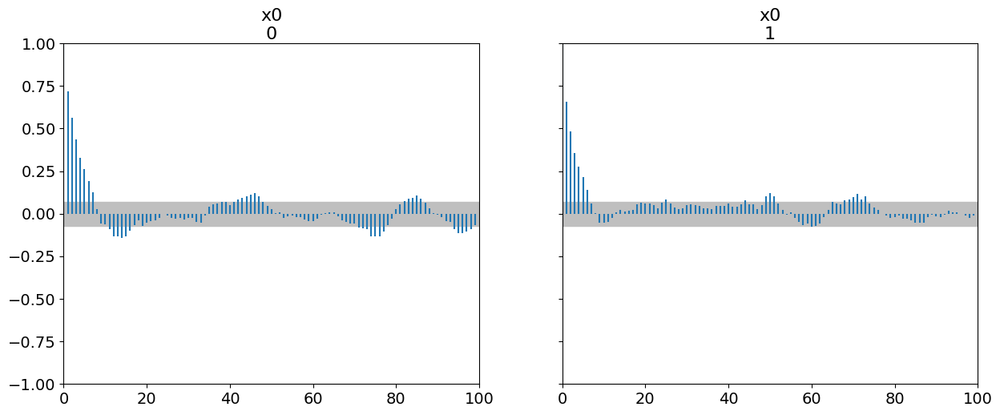

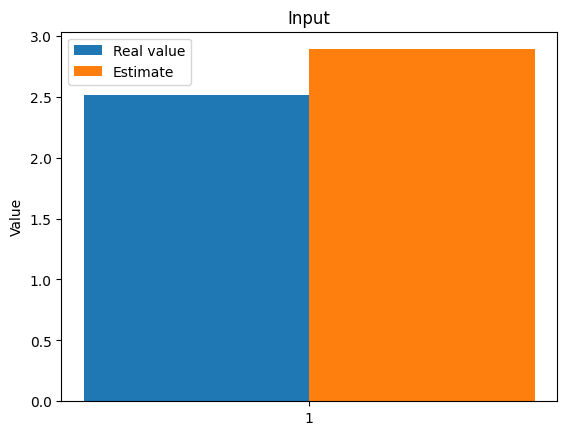

The function param_inverse took 648.1040670871735 seconds.
Sampling chain 1/2


Running chain, α = 0.39: 100%|██████████| 2500/2500 [05:22<00:00,  7.76it/s]


Sampling chain 2/2


Running chain, α = 0.18: 100%|██████████| 2500/2500 [05:26<00:00,  7.65it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.749]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.749  0.373   2.185    3.224      0.027    0.019     184.0     281.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.23572588]



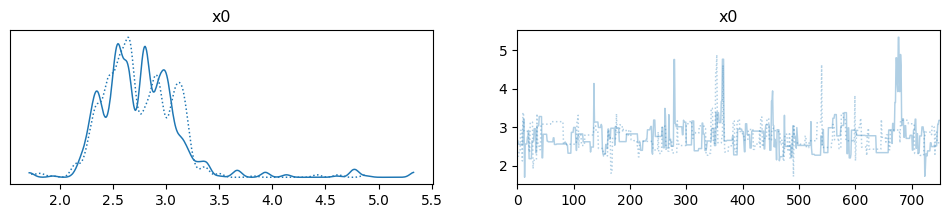

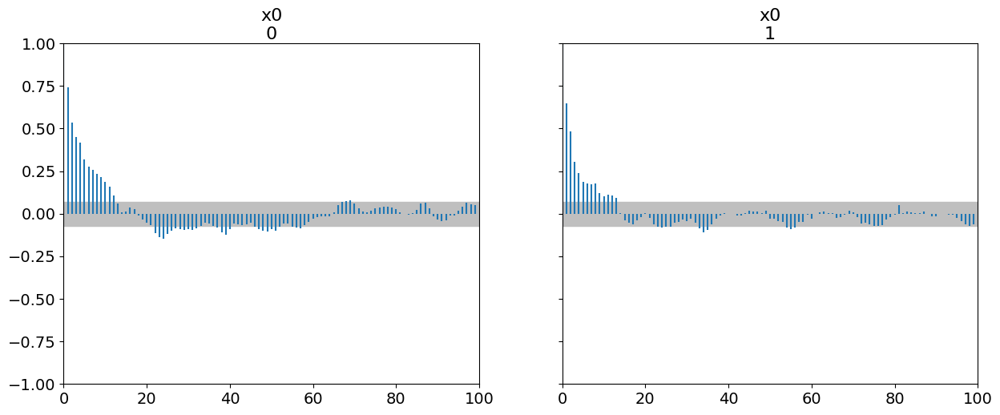

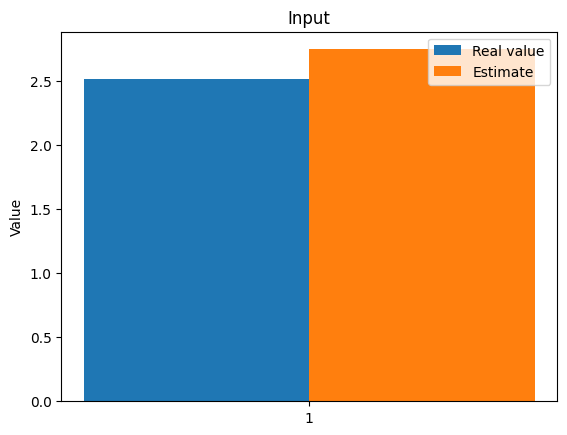

The function param_inverse took 651.6130738258362 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 2500/2500 [05:22<00:00,  7.76it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [05:16<00:00,  7.89it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.7]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0   2.7  0.344   2.135    3.221      0.024    0.017     192.0     179.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [0.18672588]



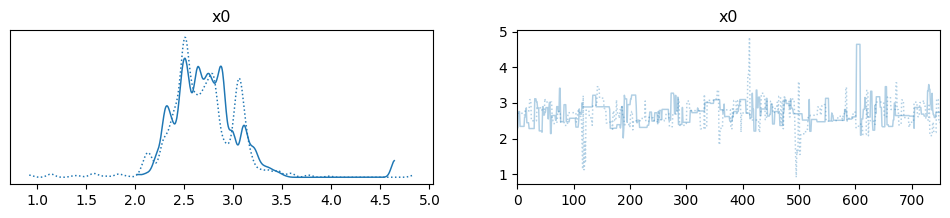

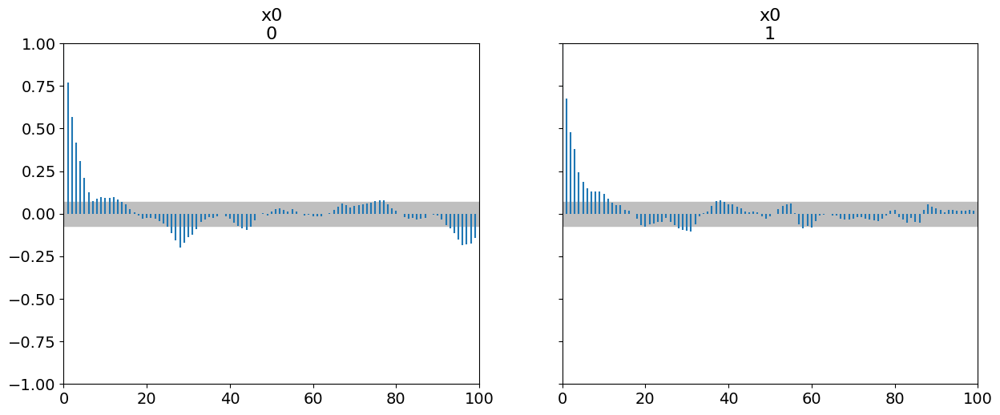

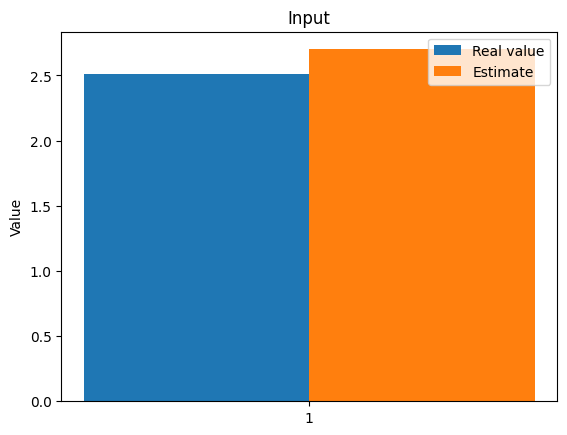

The function param_inverse took 641.0977845191956 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [05:13<00:00,  7.96it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [05:21<00:00,  7.77it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.86]
    mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
x0  2.86  0.96   1.022    4.669      0.059    0.042     262.0     262.0    1.0
Autocorrelation...
the difference between estimated values [0.34672588]



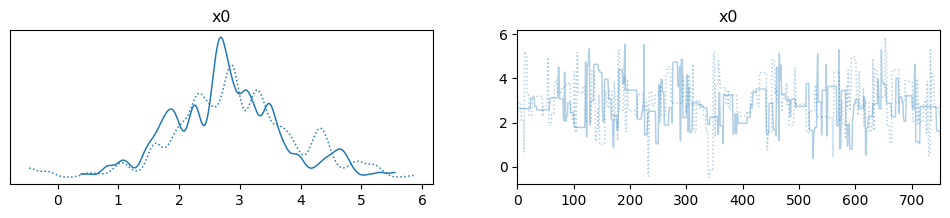

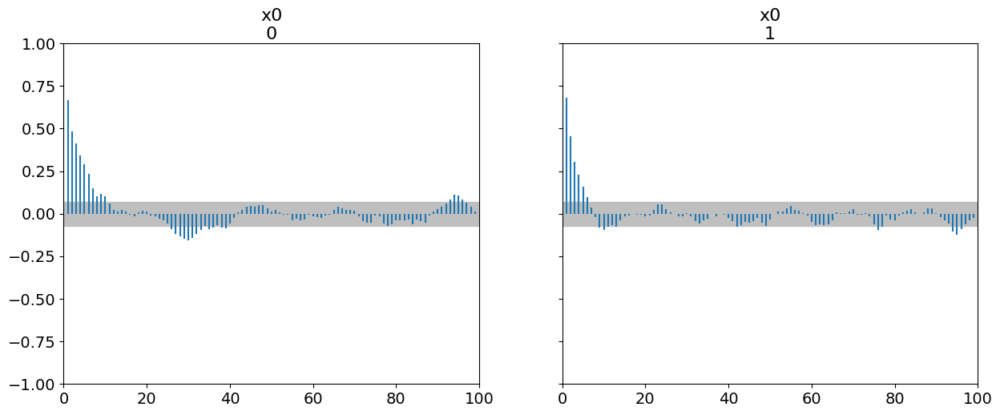

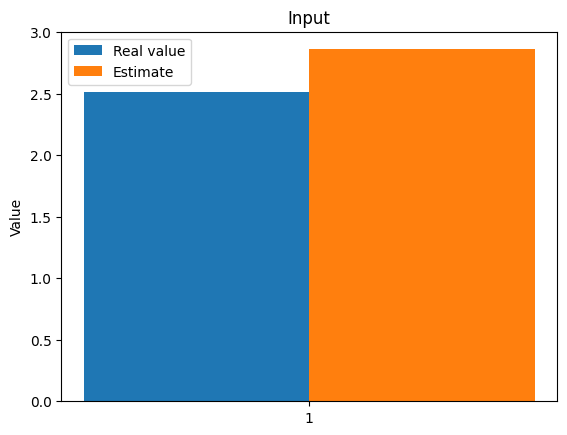

The function param_inverse took 637.8008353710175 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [05:24<00:00,  7.71it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [05:22<00:00,  7.76it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.019]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.019  0.91   1.398    4.862      0.061    0.043     218.0     166.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [0.50572588]



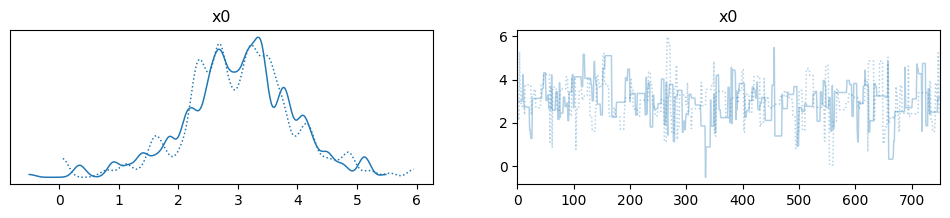

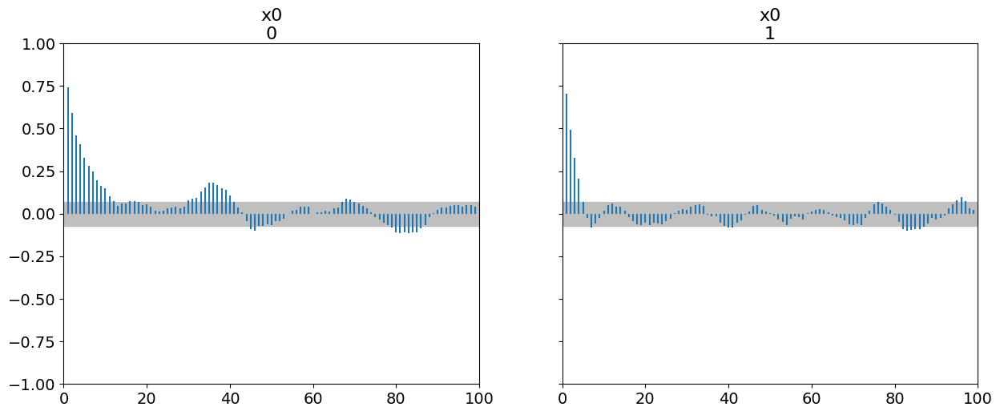

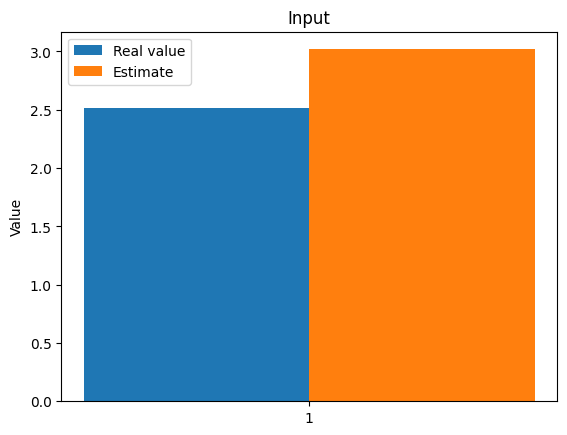

The function param_inverse took 648.2017216682434 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [05:32<00:00,  7.52it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 2500/2500 [05:31<00:00,  7.54it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.578]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.578  0.117   2.376    2.791      0.007    0.005     272.0     256.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.06472588]



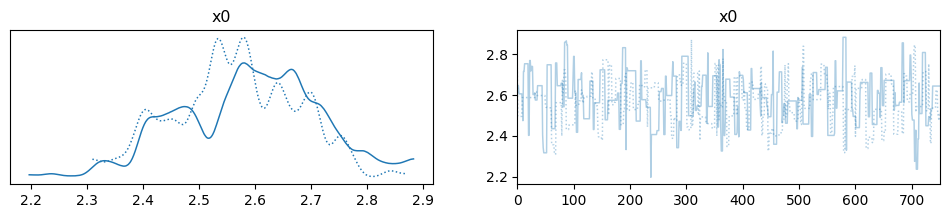

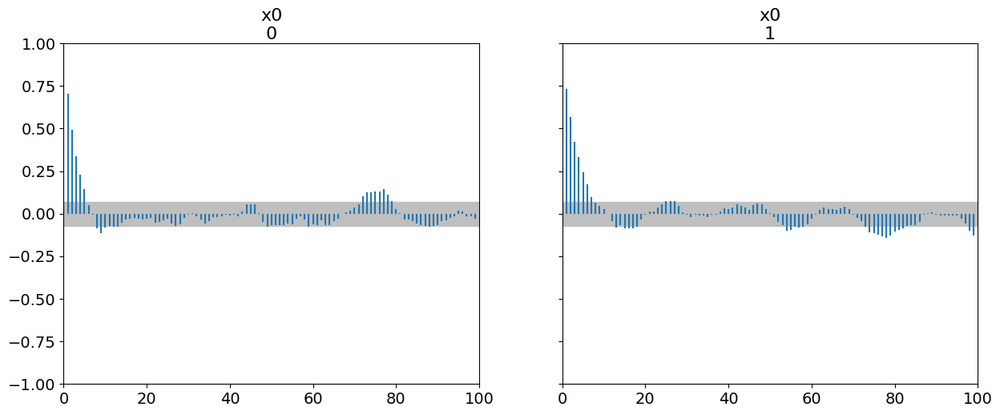

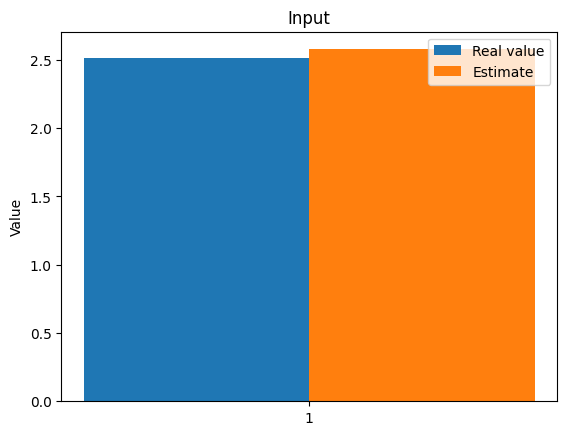

The function param_inverse took 665.7235705852509 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 2500/2500 [05:38<00:00,  7.38it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [05:38<00:00,  7.38it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.594]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.594  0.11   2.396     2.79      0.007    0.005     286.0     261.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [0.08072588]



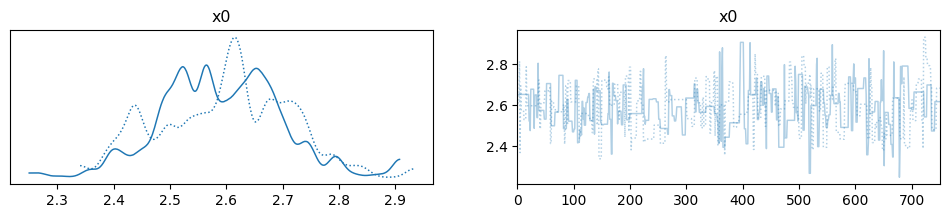

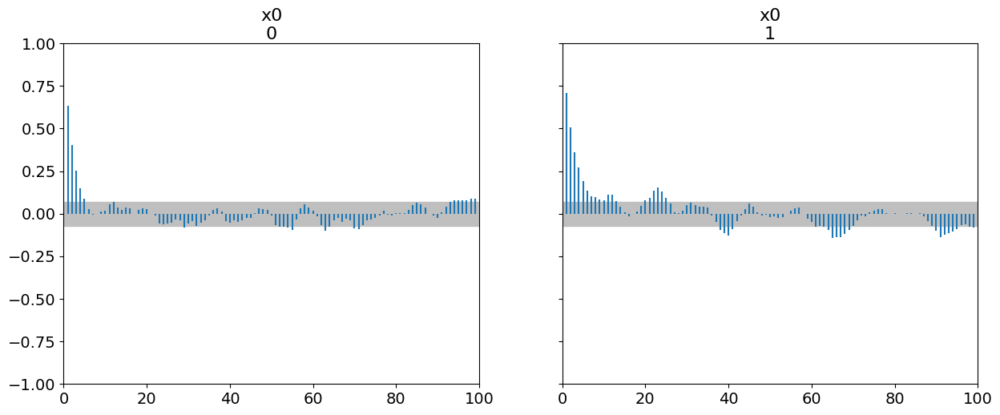

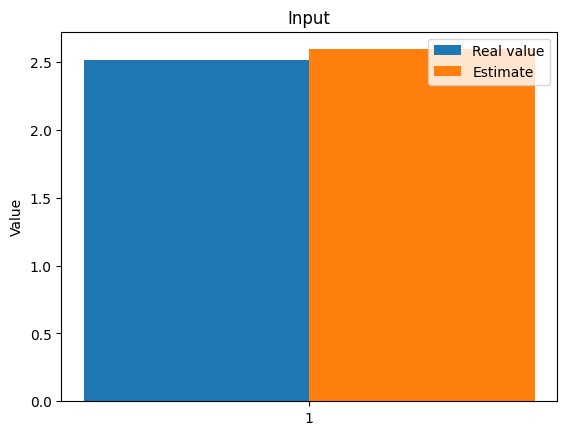

The function param_inverse took 679.6890020370483 seconds.
Sampling chain 1/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [05:37<00:00,  7.40it/s]


Sampling chain 2/2


Running chain, α = 0.30: 100%|██████████| 2500/2500 [05:39<00:00,  7.35it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.719]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.719  0.802   1.339     4.37       0.05    0.036     254.0     179.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.20572588]



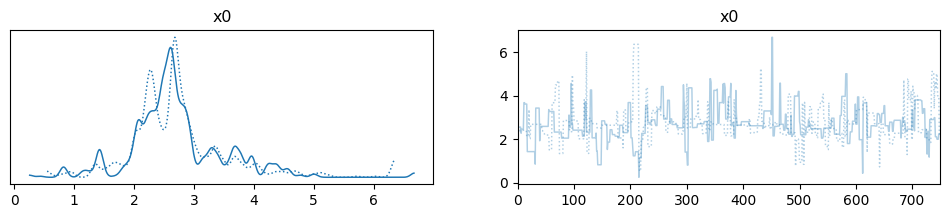

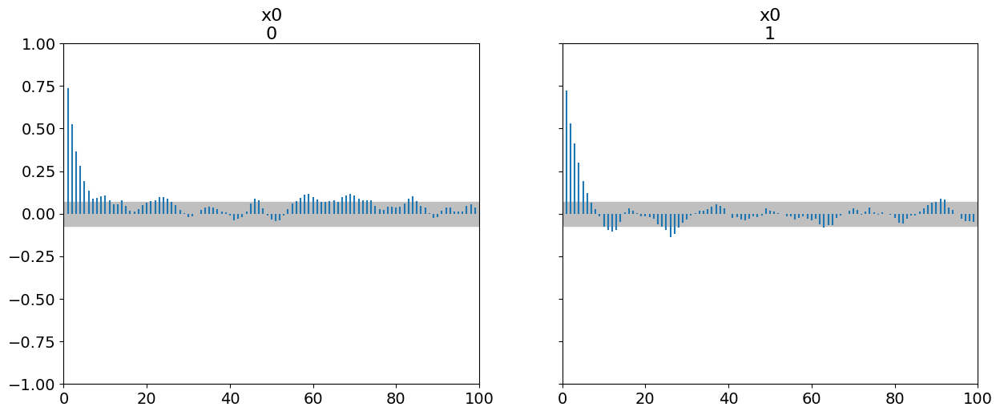

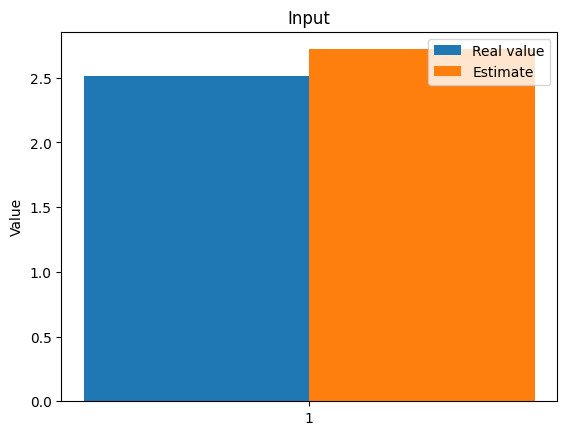

The function param_inverse took 679.5275671482086 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 2500/2500 [05:38<00:00,  7.38it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 2500/2500 [05:38<00:00,  7.39it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.78]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.78  0.812   1.434    4.517      0.043    0.033     367.0     296.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [0.26672588]



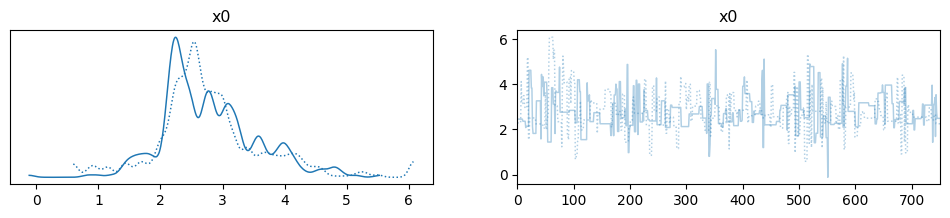

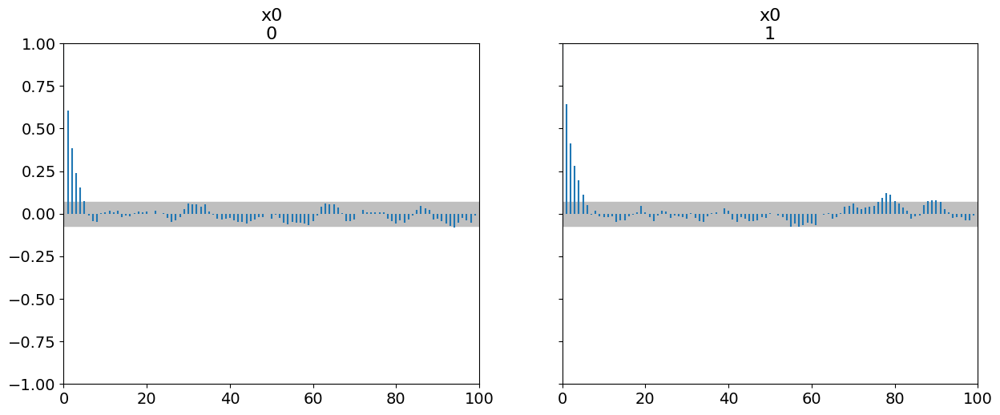

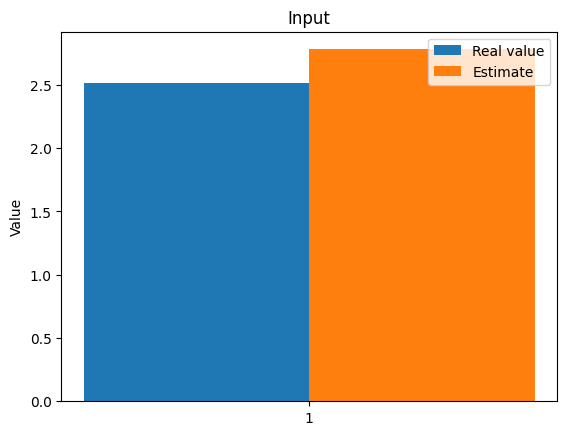

The function param_inverse took 679.2851903438568 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 2500/2500 [05:24<00:00,  7.70it/s]


Sampling chain 2/2


Running chain, α = 0.18: 100%|██████████| 2500/2500 [05:54<00:00,  7.05it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.462]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.462  0.15   2.187    2.741      0.009    0.006     283.0     289.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.05127412]



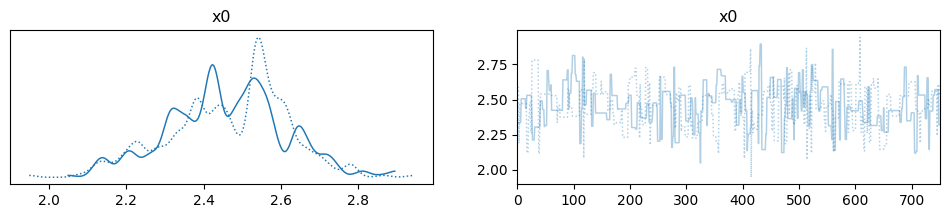

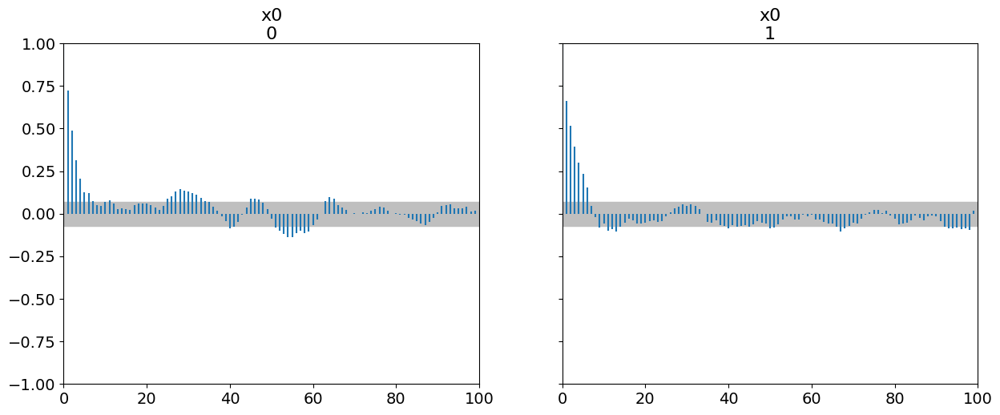

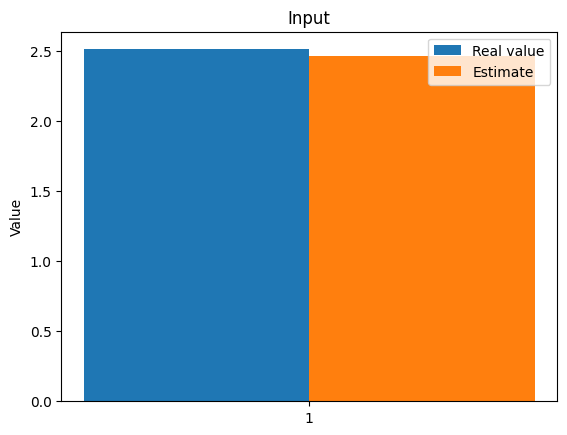

The function param_inverse took 694.2807517051697 seconds.
Sampling chain 1/2


Running chain, α = 0.31: 100%|██████████| 2500/2500 [07:58<00:00,  5.23it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [09:17<00:00,  4.49it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.457]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.457  0.161    2.14    2.728      0.009    0.006     323.0     263.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [0.05627412]



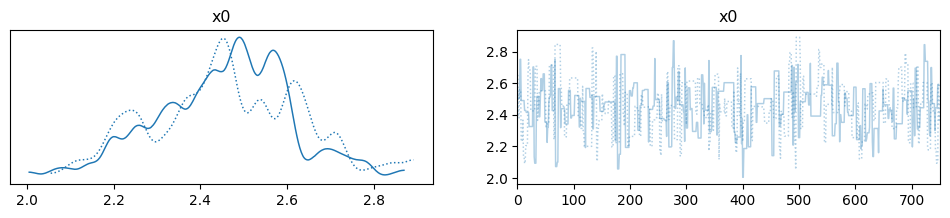

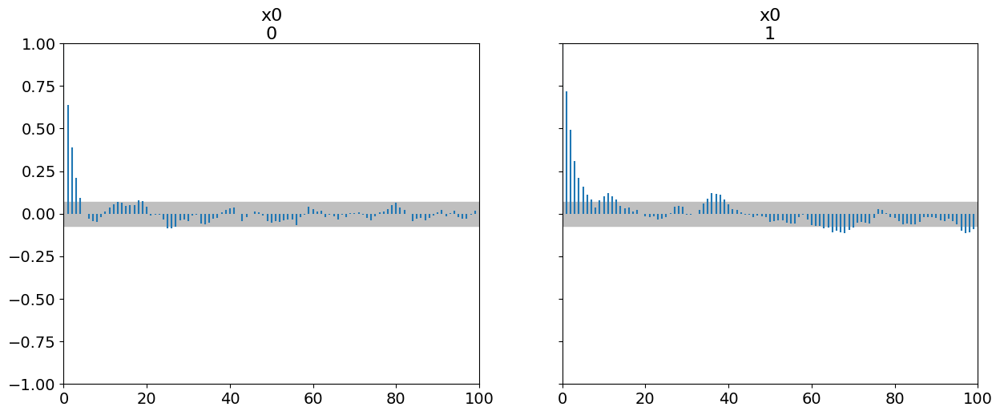

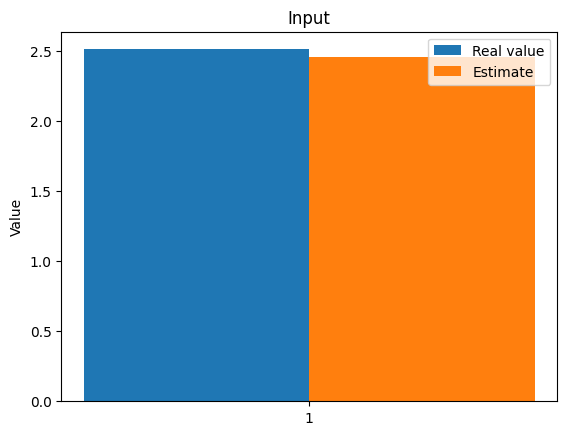

The function param_inverse took 1038.7999165058136 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [09:16<00:00,  4.50it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [41:44<00:00,  1.00s/it]  
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.89]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.89  0.909   1.253    4.659      0.057    0.041     268.0     267.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.37672588]



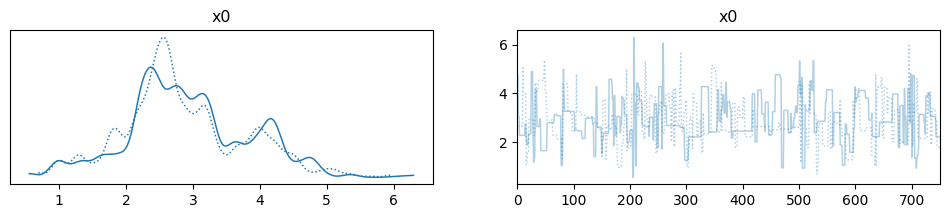

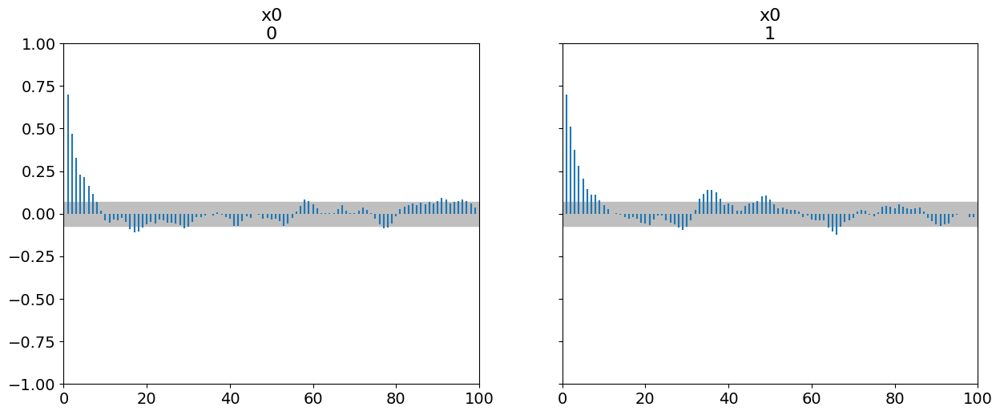

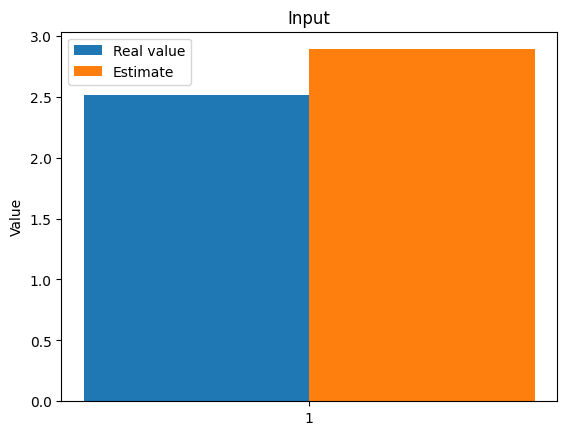

The function param_inverse took 3099.595845937729 seconds.
Sampling chain 1/2


Running chain, α = 0.32: 100%|██████████| 2500/2500 [29:40<00:00,  1.40it/s]  


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [08:23<00:00,  4.97it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.908]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.908  1.012   1.033    4.872      0.057    0.041     317.0     298.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.39472588]



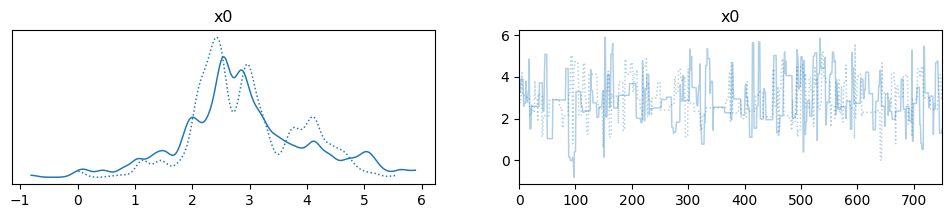

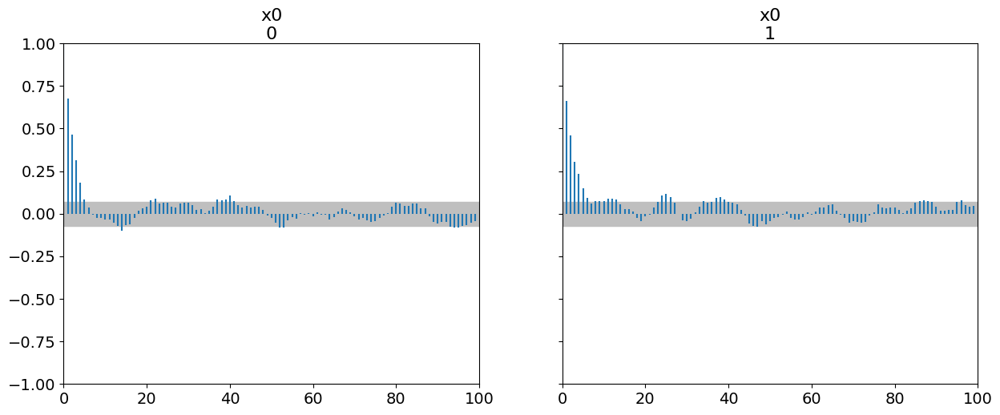

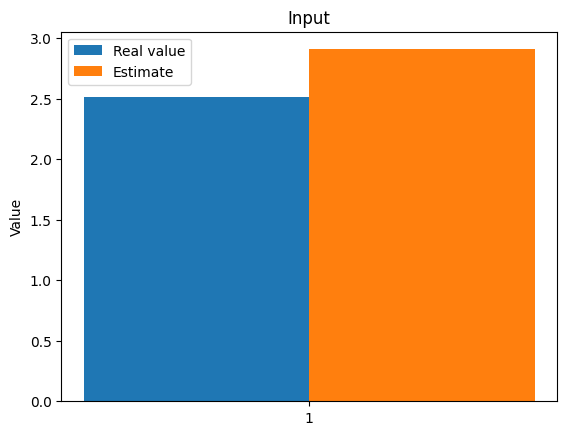

The function param_inverse took 2299.0253043174744 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 2500/2500 [08:21<00:00,  4.98it/s]


Sampling chain 2/2


Running chain, α = 0.17: 100%|██████████| 2500/2500 [08:20<00:00,  5.00it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.721]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.721  0.345    2.17    3.278      0.024    0.017     202.0     145.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.20772588]



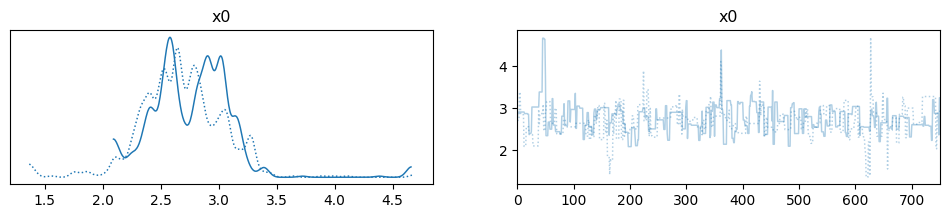

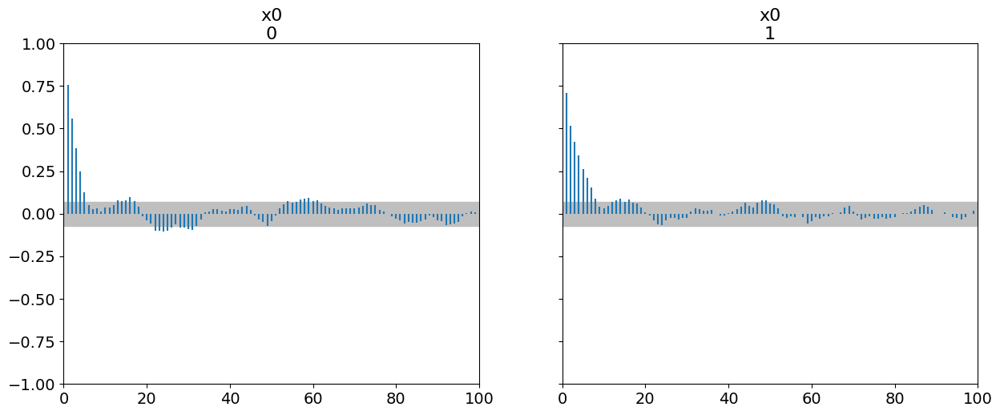

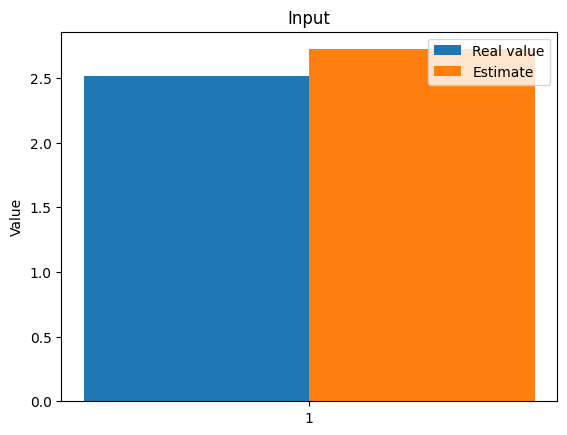

The function param_inverse took 1004.8852398395538 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [08:19<00:00,  5.00it/s]


Sampling chain 2/2


Running chain, α = 0.33: 100%|██████████| 2500/2500 [1:05:24<00:00,  1.57s/it]      
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.722]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.722  0.316   2.216    3.176      0.019    0.014     262.0     256.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [0.20872588]



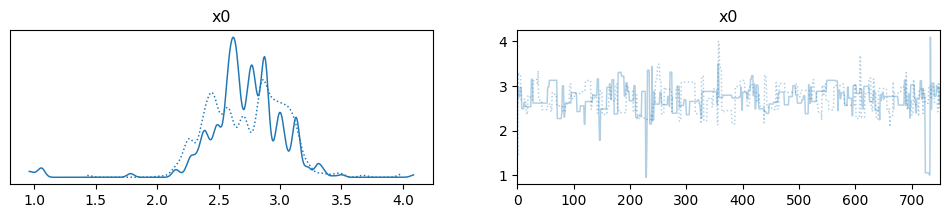

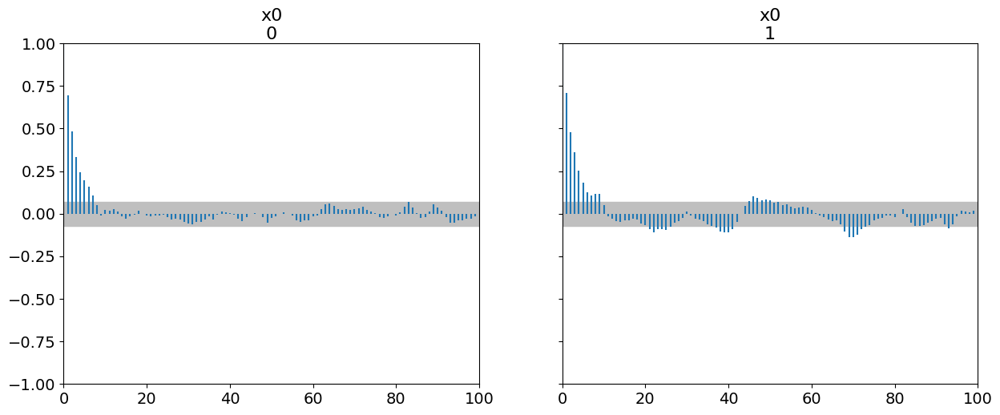

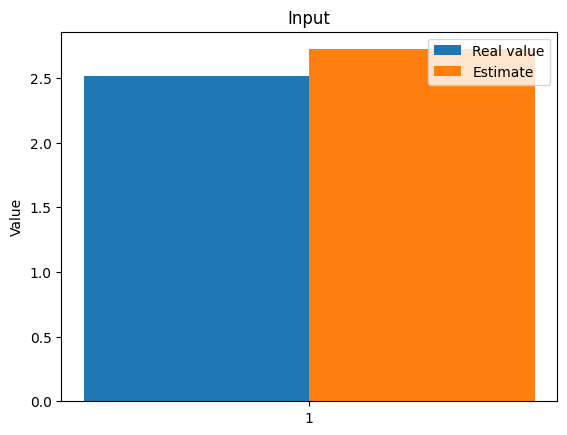

The function param_inverse took 4427.381108760834 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 2500/2500 [04:57<00:00,  8.41it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 2500/2500 [05:12<00:00,  7.99it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.956]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.956  0.906    1.28    4.683      0.051    0.036     313.0     273.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.44272588]



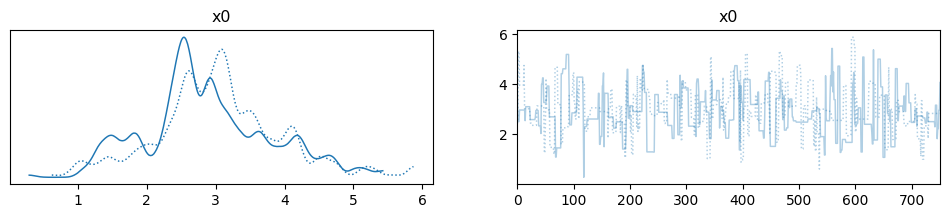

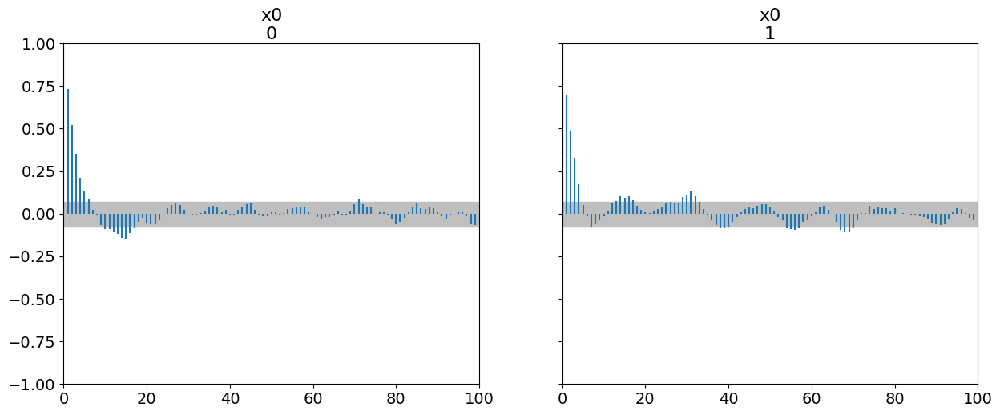

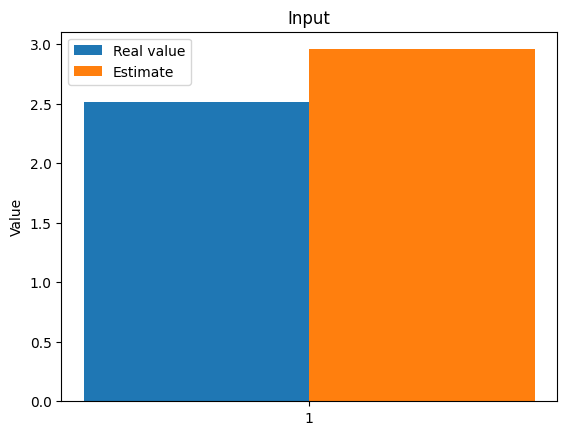

The function param_inverse took 611.917471408844 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 2500/2500 [06:07<00:00,  6.80it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 2500/2500 [09:41<00:00,  4.30it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.043]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.043  0.948   1.238    4.634      0.056    0.041     287.0     267.0   

    r_hat  
x0   1.03  
Autocorrelation...
the difference between estimated values [0.52972588]



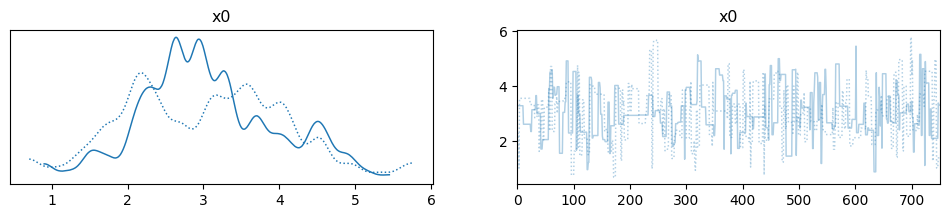

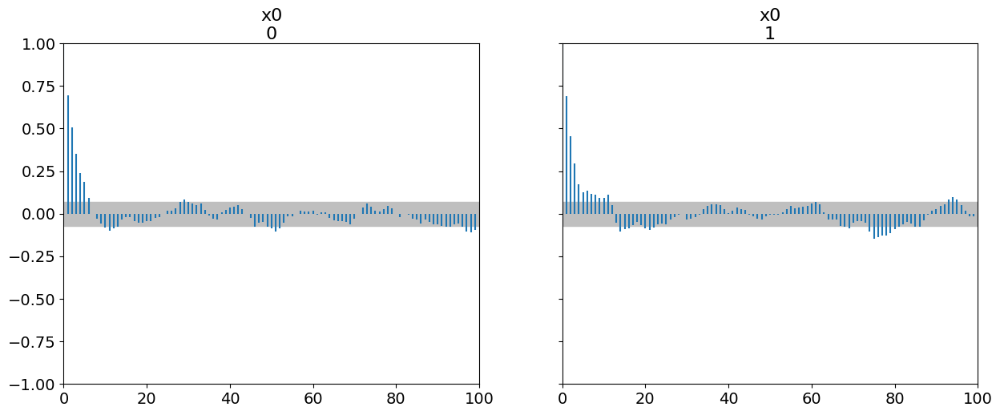

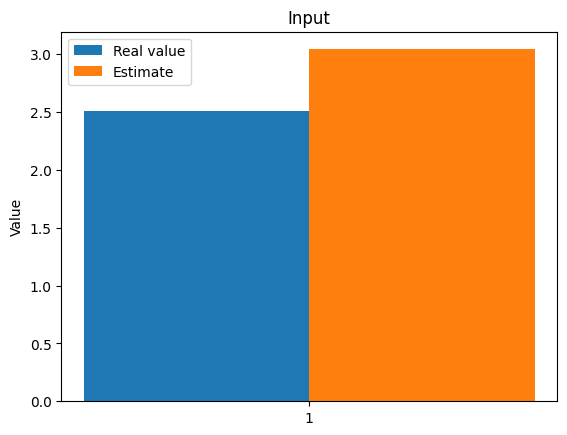

The function param_inverse took 952.645586013794 seconds.
The best estimate is given by: sigma_noise=0.05, number of data=50, sigma=0.5, rwmh_scaling=1.0
(50,)
real values are [2.51327412]
Sampling chain 1/2


IndexError: tuple index out of range

In [52]:
mean_prior = np.array([3.])
cov_prior = np.diag([1.])
sigma_noise = [0.05,0.1]
n_data = [50,30,10]
parameters = np.array([deltas[1]])
sigma = np.array([ 0.5,2.])
rwmh_scaling = np.array([2., 1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 2500
burnin = 1750
n_chains = 2
algo = "AM"


estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)

estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)





Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [04:24<00:00, 11.36it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [04:35<00:00, 10.90it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.608]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.608  0.129   2.375    2.821      0.007    0.005     358.0     341.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.09472588]



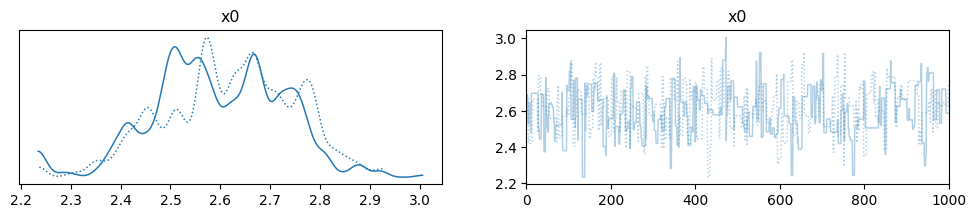

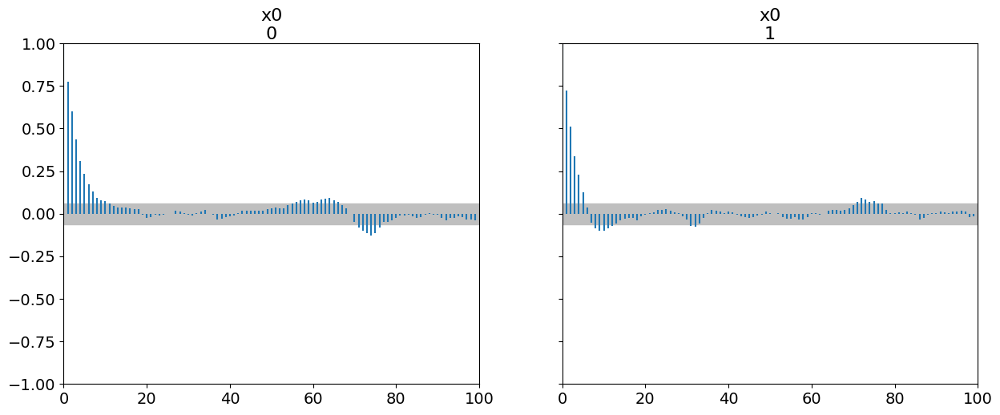

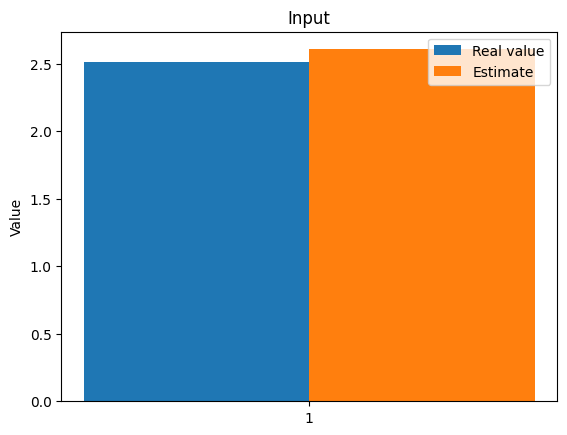

The function param_inverse took 540.6708943843842 seconds.
Sampling chain 1/2


Running chain, α = 0.17: 100%|██████████| 3000/3000 [04:44<00:00, 10.55it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [04:44<00:00, 10.56it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.604]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.604  0.125   2.357    2.833      0.006    0.004     407.0     286.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [0.09072588]



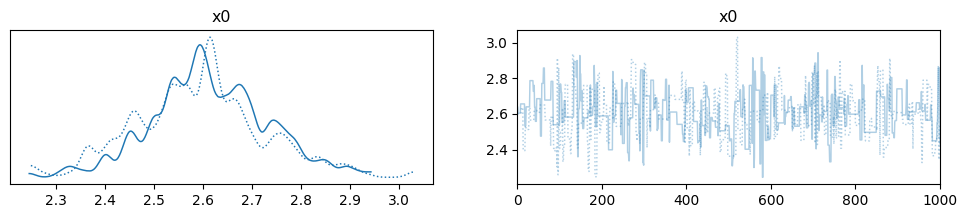

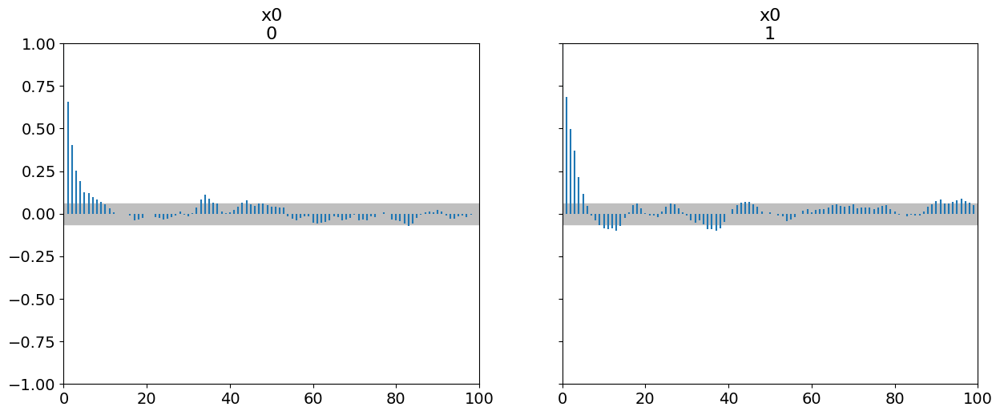

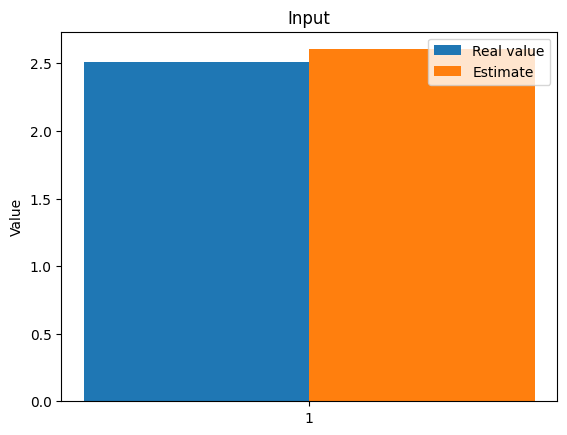

The function param_inverse took 569.5434086322784 seconds.
Sampling chain 1/2


Running chain, α = 0.15: 100%|██████████| 3000/3000 [06:47<00:00,  7.35it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [05:22<00:00,  9.31it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.609]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.609  0.133   2.363    2.857      0.009    0.006     219.0     255.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [0.09572588]



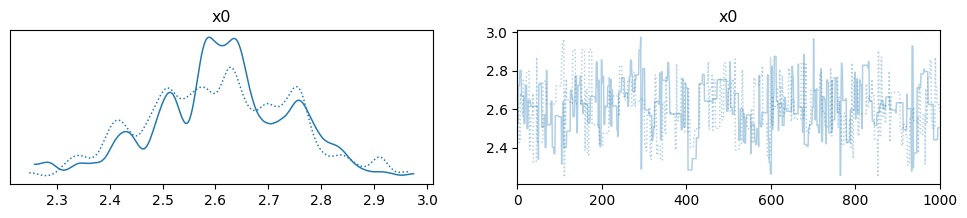

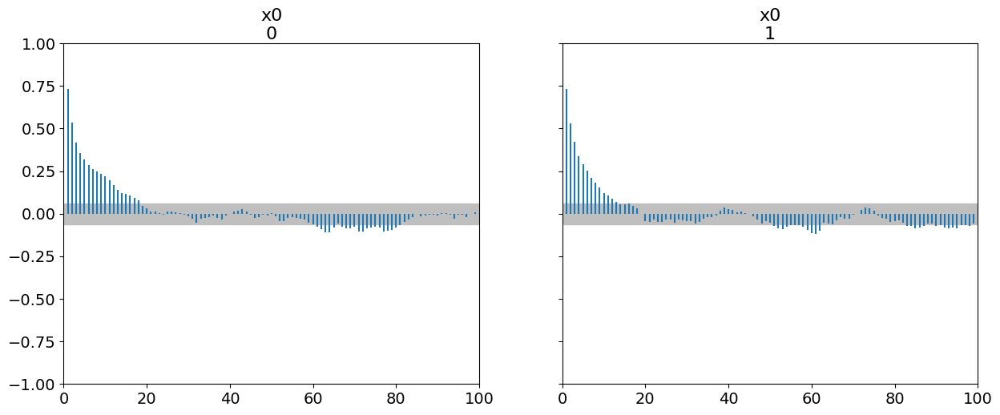

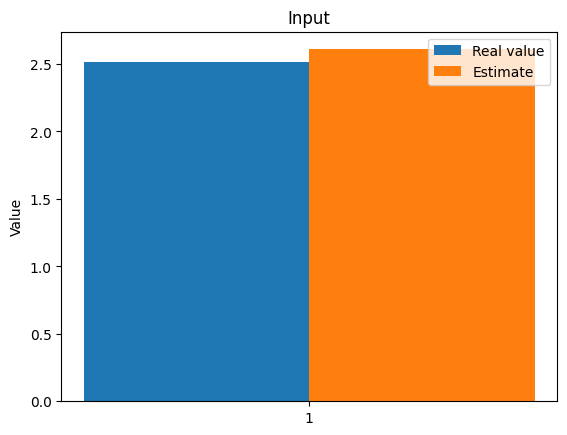

The function param_inverse took 731.4834735393524 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [05:05<00:00,  9.82it/s]


Sampling chain 2/2


Running chain, α = 0.16: 100%|██████████| 3000/3000 [05:10<00:00,  9.66it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.922]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.922  0.978   5.209    8.649      0.056     0.04     309.0     265.0   

    r_hat  
x0   1.02  
Autocorrelation...
the difference between estimated values [4.40872588]



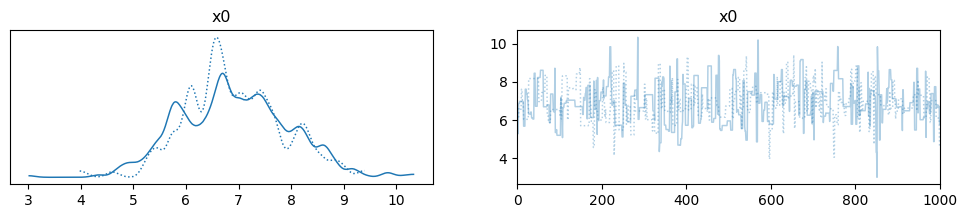

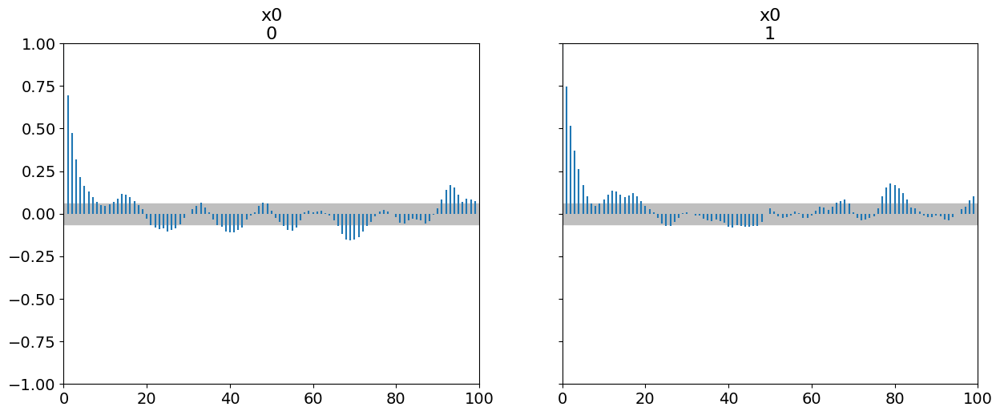

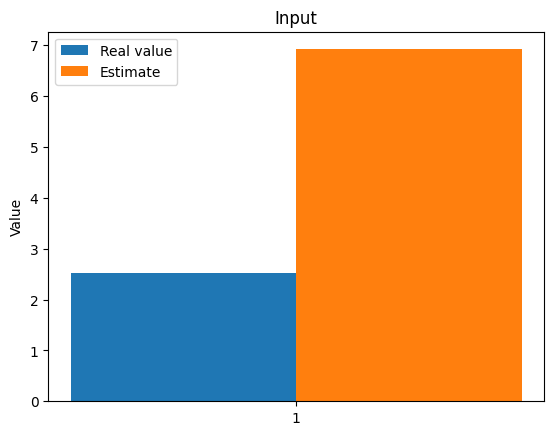

The function param_inverse took 617.1253545284271 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [05:11<00:00,  9.62it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [05:10<00:00,  9.67it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.885]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.885  0.935   5.026    8.426      0.045    0.032     430.0     311.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [4.37172588]



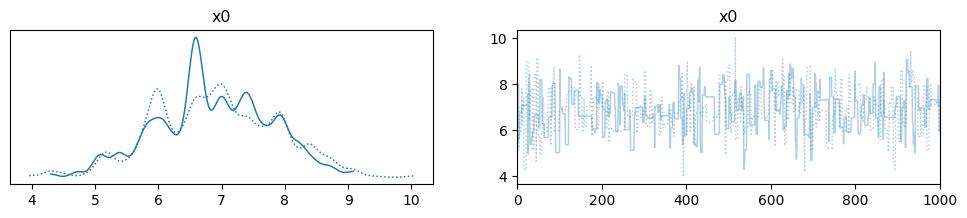

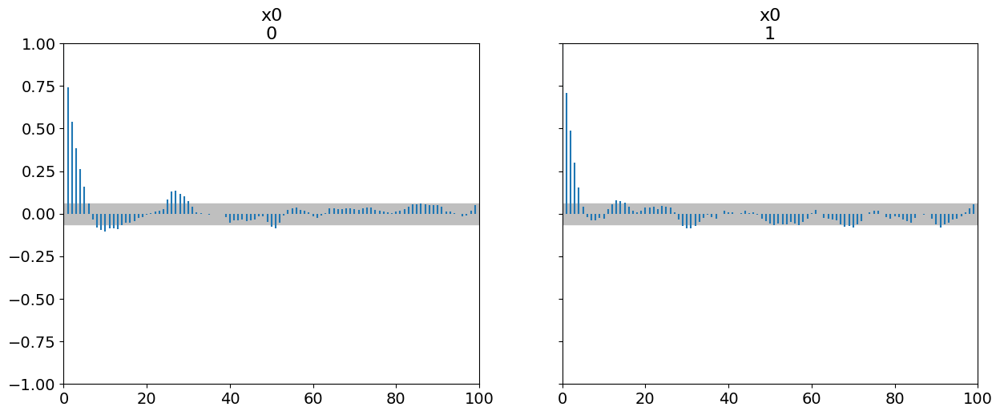

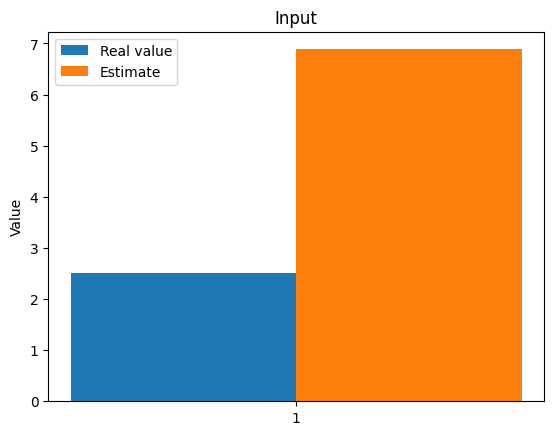

The function param_inverse took 623.3314845561981 seconds.
Sampling chain 1/2


Running chain, α = 0.35: 100%|██████████| 3000/3000 [05:11<00:00,  9.63it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [05:10<00:00,  9.65it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.968]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.968  1.012   5.361     9.02      0.052    0.037     389.0     385.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [4.45472588]



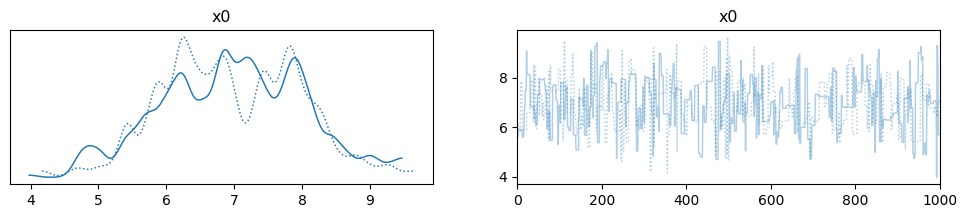

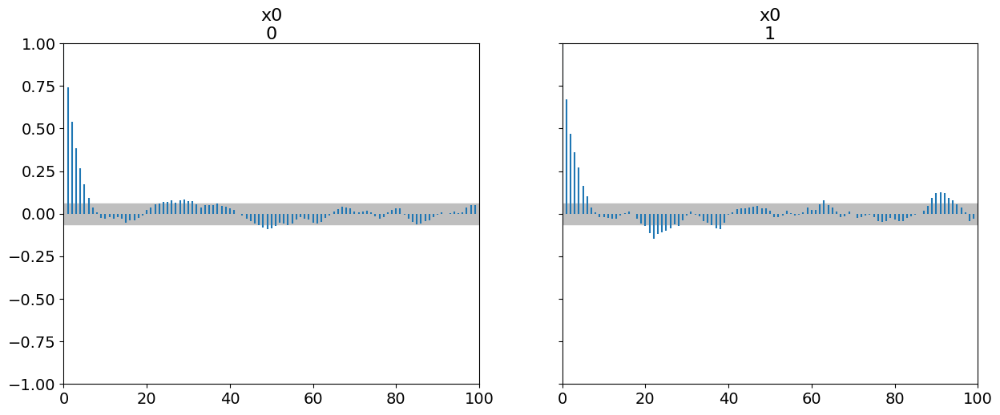

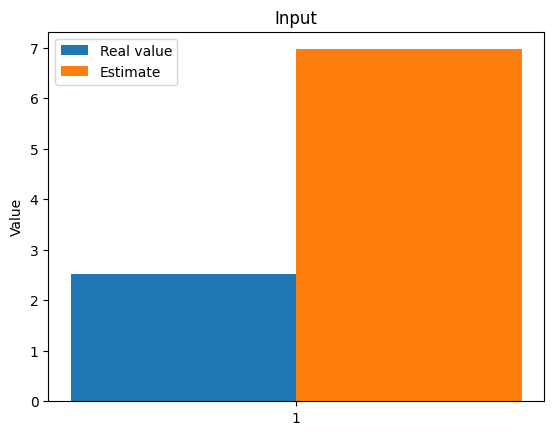

The function param_inverse took 623.5864355564117 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [05:12<00:00,  9.60it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 3000/3000 [05:10<00:00,  9.66it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.919]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.919  1.073   5.008    9.093      0.065    0.049     301.0     163.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [4.40572588]



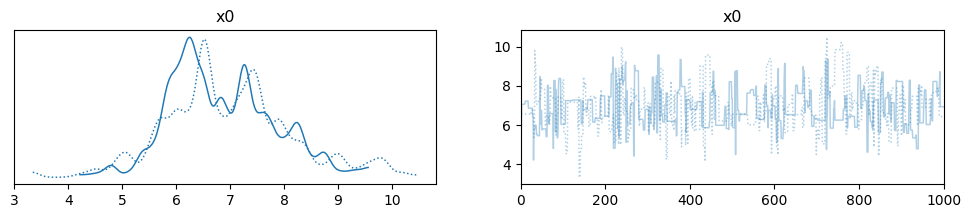

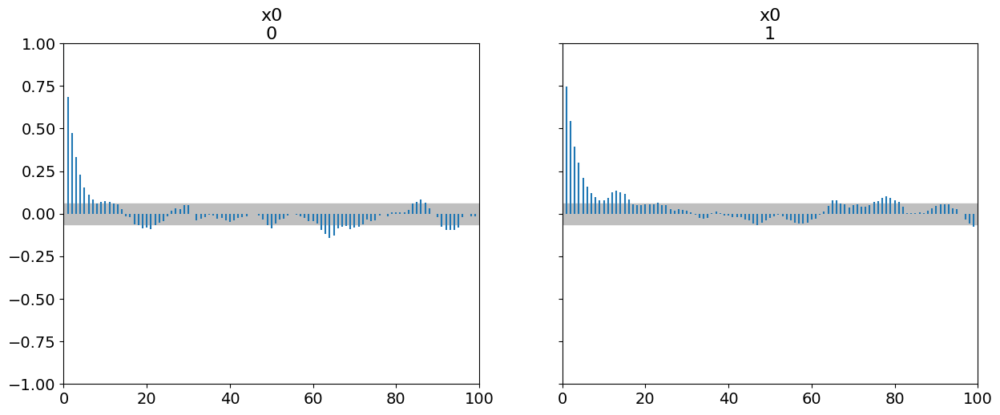

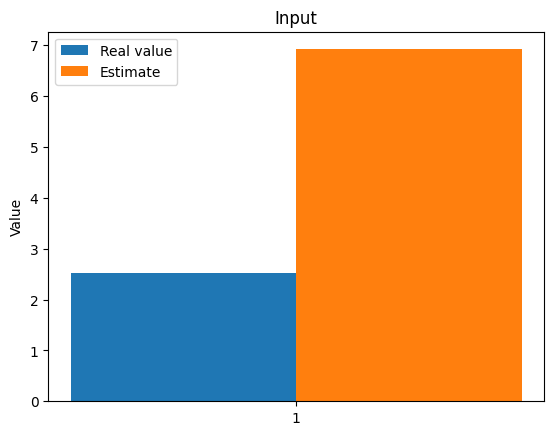

The function param_inverse took 632.6324179172516 seconds.
Sampling chain 1/2


Running chain, α = 0.11: 100%|██████████| 3000/3000 [08:58<00:00,  5.57it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [08:55<00:00,  5.60it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.893]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.893  1.049   5.008    8.781      0.074    0.053     193.0     233.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [4.37972588]



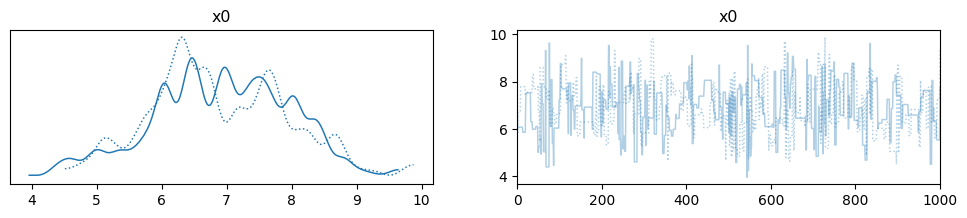

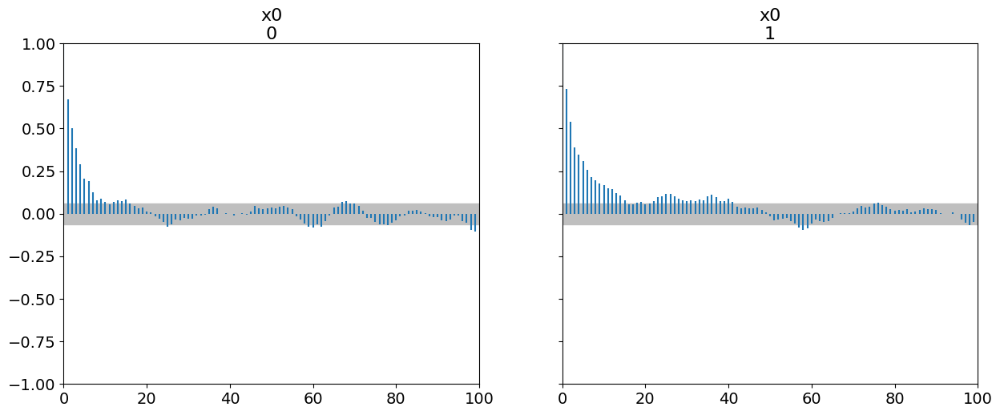

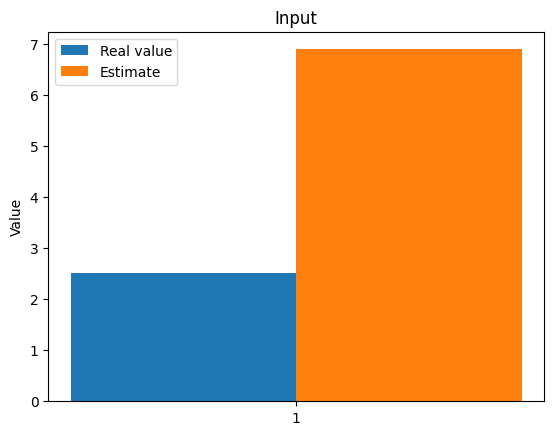

The function param_inverse took 1084.0924723148346 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [05:10<00:00,  9.66it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [05:10<00:00,  9.65it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.891]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.891  1.041   5.107    8.688      0.067    0.049     255.0     199.0   

    r_hat  
x0    1.0  
Autocorrelation...
the difference between estimated values [4.37772588]



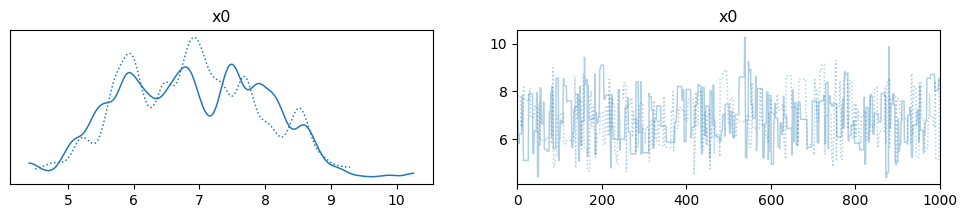

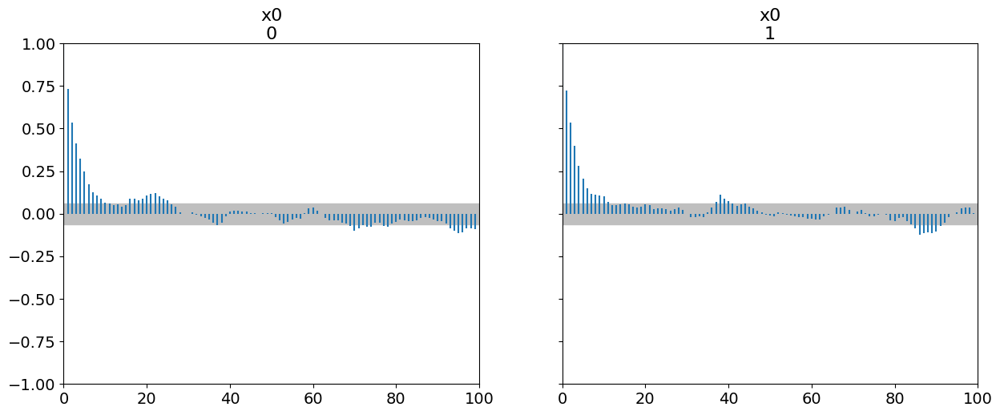

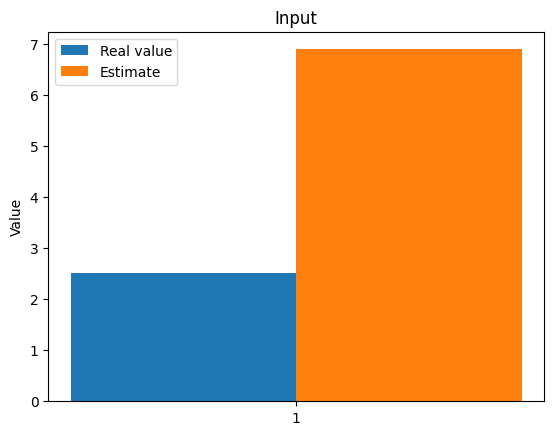

The function param_inverse took 631.9165685176849 seconds.
Sampling chain 1/2


Running chain, α = 0.17:  52%|█████▏    | 1570/3000 [02:34<02:20, 10.14it/s]


KeyboardInterrupt: 

In [36]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = np.array([10, 20, 30, 40, 50])
sigma_noise = [0.05,0.1]
n_data = [50,30]
parameters = np.array([deltas[1]])
sigma = np.array([ 0.5,4.,2.])
rwmh_scaling = np.array([2.,0.5, 1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 3000
burnin = 2000
n_chains = 2
algo = "MH"


estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)

estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)





(50,)
real values are [2.51327412]
Sampling chain 1/2


Running chain, α = 0.16: 100%|██████████| 3000/3000 [02:33<00:00, 19.54it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:49<00:00, 17.75it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.116]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.116  1.003   5.155    8.792      0.058    0.041     309.0     219.0   

    r_hat  
x0   1.01  
Autocorrelation...
the difference between estimated values [4.60272588]



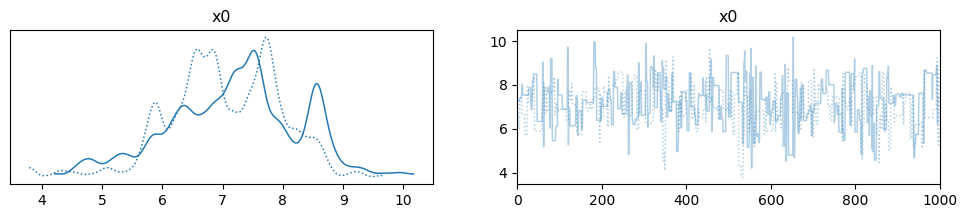

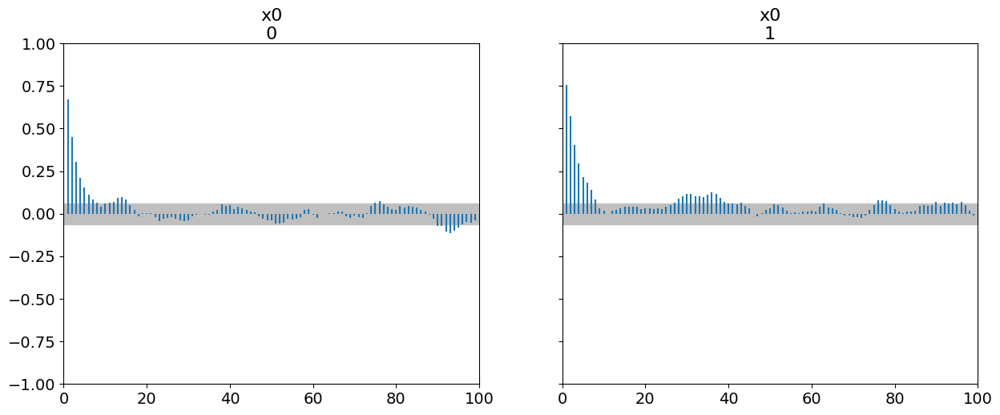

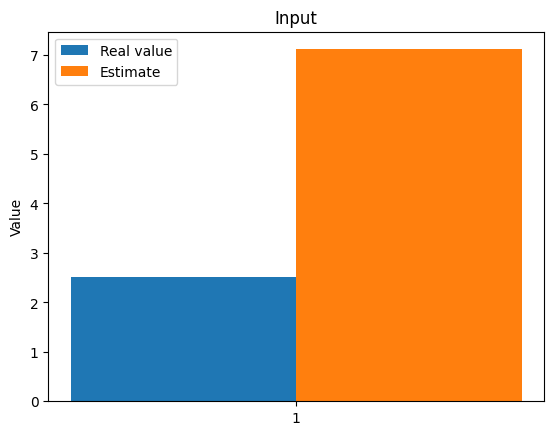

(50,)
real values are [2.51327412]
Sampling chain 1/2


Running chain, α = 0.35:  23%|██▎       | 684/3000 [00:39<02:13, 17.29it/s]


KeyboardInterrupt: 

In [23]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
sigma_noise = [0.05,0.1]
n_data = [50,30]
parameters = np.array([deltas[1]])
sigma = np.array([4.,2.])
rwmh_scaling = np.array([ 2.,1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 3000
burnin = 2000
n_chains = 2
algo = "MH"


estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)

estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)




In [ ]:
# Define inputs
mean_prior = np.array([3.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 3000
burn_in = 2000
number_chains = 2
algo = "MH"
x_real = np.array([deltas[-1]])
proposal_sd = [0.5,2.]
adapt = True
n_data = [50,30,10]

x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 







# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )
estimates=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model
) 


Sample 3000 / 3000

Average acceptance rate: 0.31 MCMC scale: 0.6249622686431184 

Mean values = [14.8533291]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.299 MCMC scale: 0.6130123585872429 

Mean values = [14.85638325]
(2, 1, 1000)


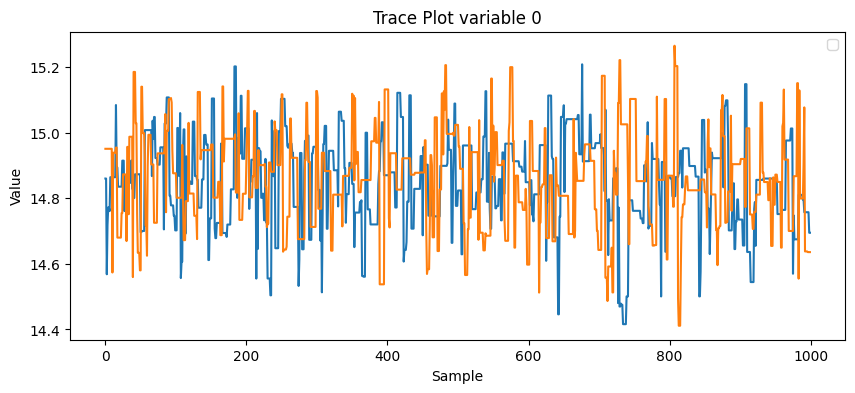

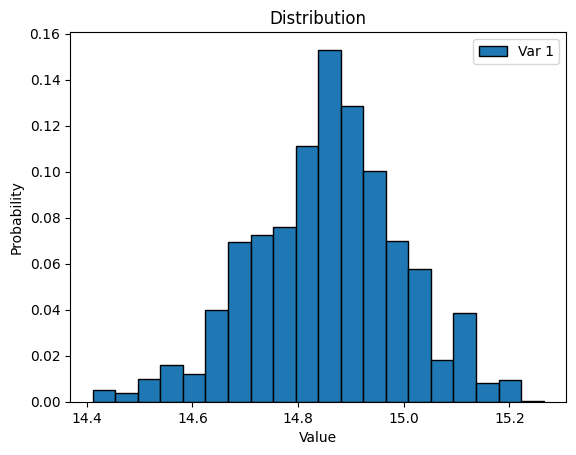

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 378.5746147278357


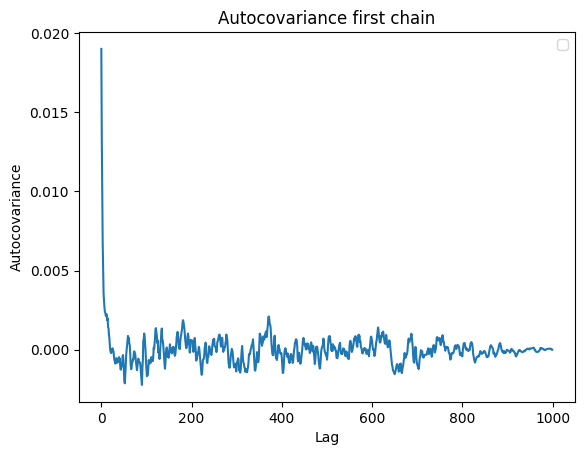

the difference between estimated values [0.14361675]



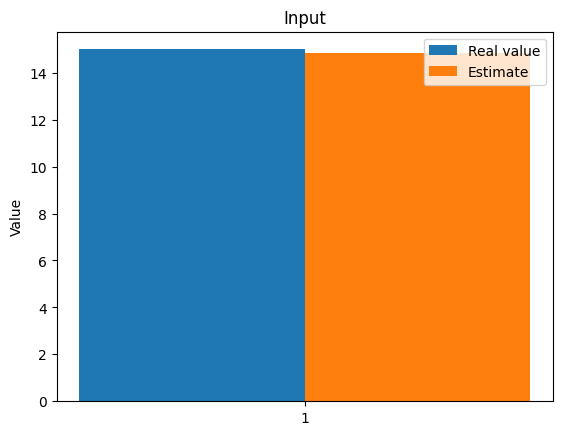

Sample 3000 / 3000

Average acceptance rate: 0.26 MCMC scale: 0.4367660225755193 

Mean values = [14.9228205]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.268 MCMC scale: 0.4541695530693019 

Mean values = [14.91729729]
(2, 1, 1000)


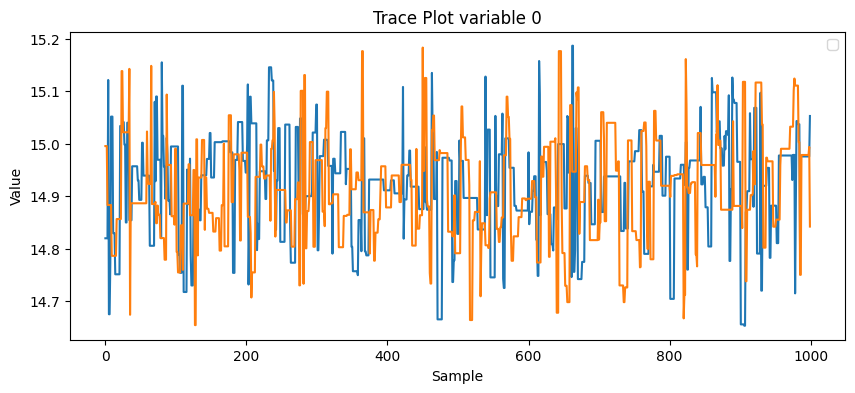

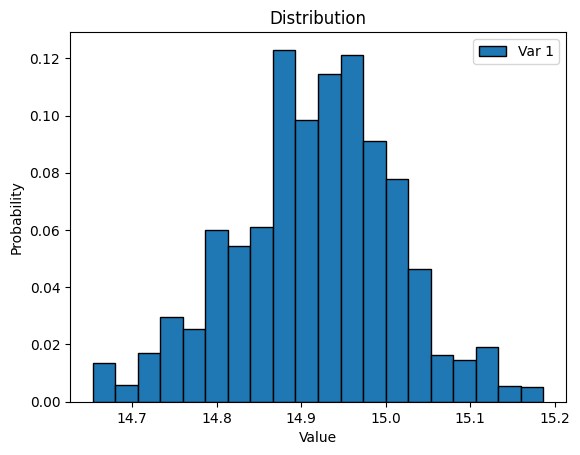

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 423.0425194756


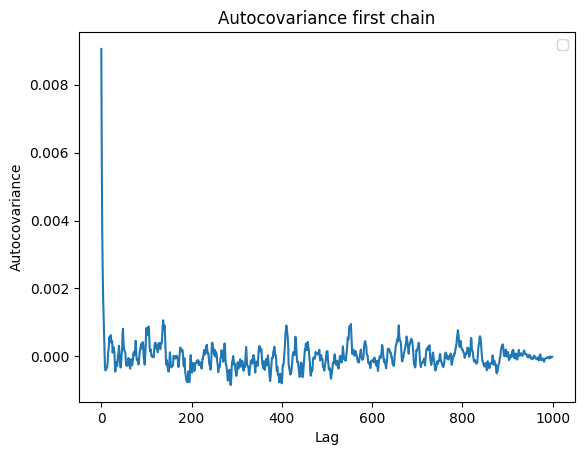

the difference between estimated values [0.08270271]



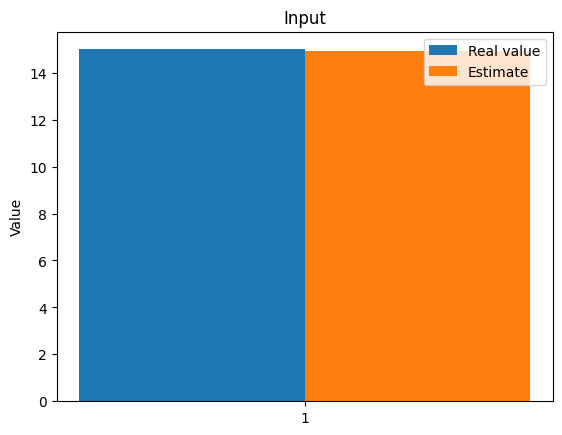

Sample 3000 / 3000

Average acceptance rate: 0.305 MCMC scale: 0.7763530803778186 

Mean values = [14.7505142]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.277 MCMC scale: 0.7344583613957313 

Mean values = [14.75779272]
(2, 1, 1000)


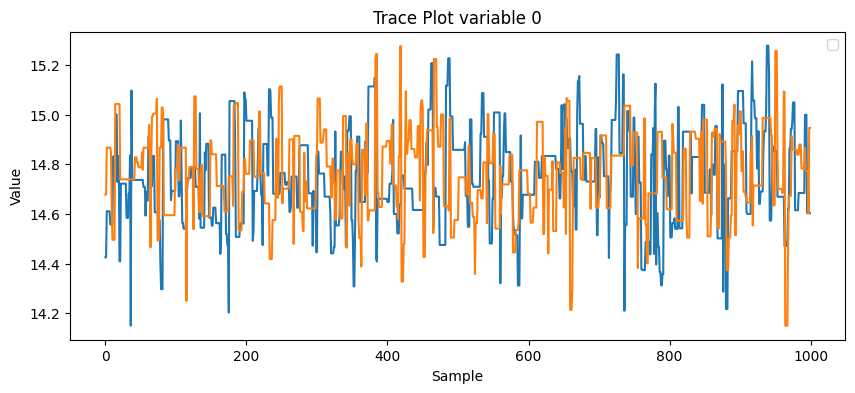

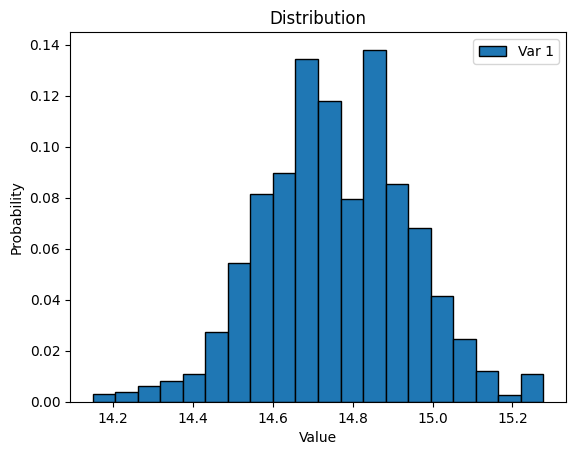

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 443.0052654580456


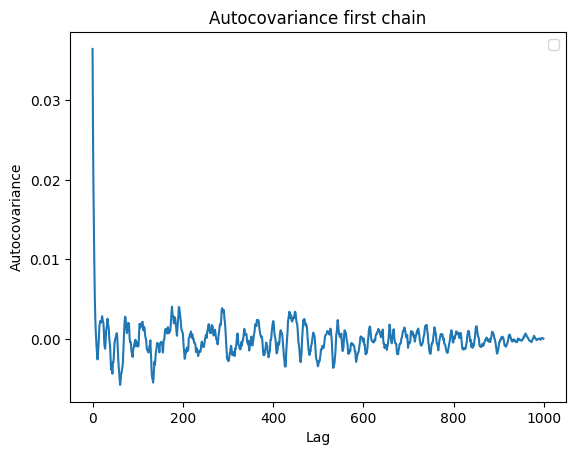

the difference between estimated values [0.24220728]



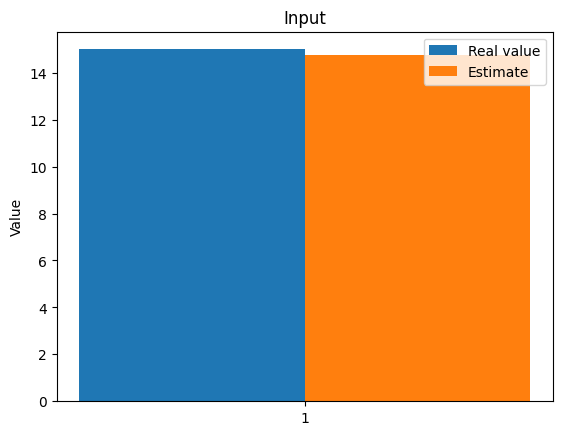

Sample 3000 / 3000

Average acceptance rate: 0.287 MCMC scale: 0.5578642808297212 

Mean values = [14.8650416]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.275 MCMC scale: 0.5949934253988892 

Mean values = [14.87005089]
(2, 1, 1000)


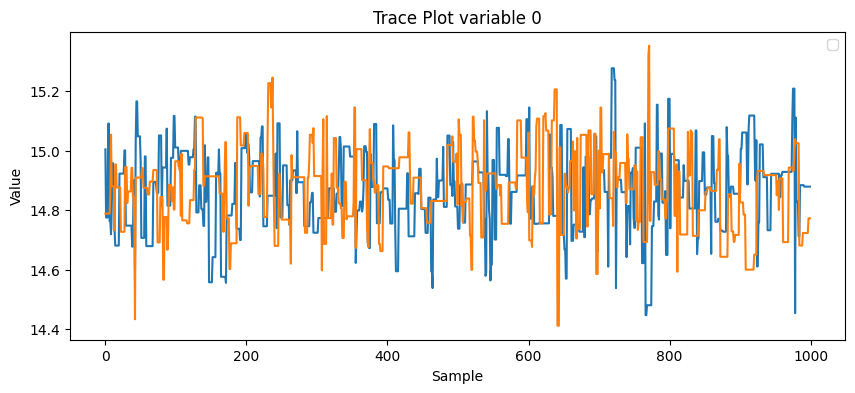

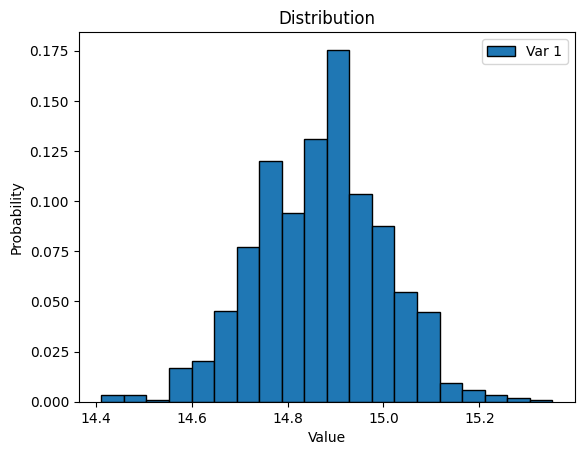

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 324.77619974295993


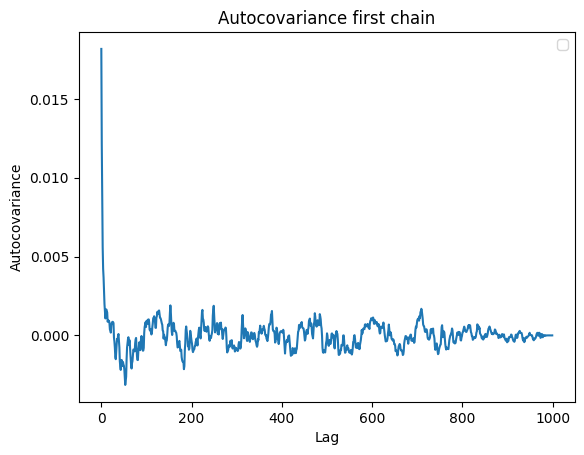

the difference between estimated values [0.12994911]



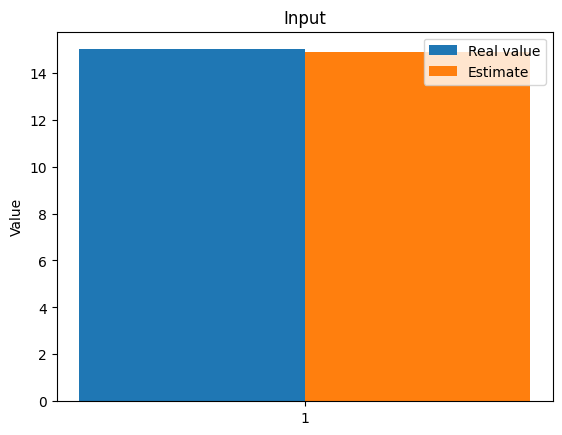

Sample 3000 / 3000

Average acceptance rate: 0.287 MCMC scale: 0.6360076776492017 

Mean values = [14.849556]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.308 MCMC scale: 0.6422882836555098 

Mean values = [14.84425001]
(2, 1, 1000)


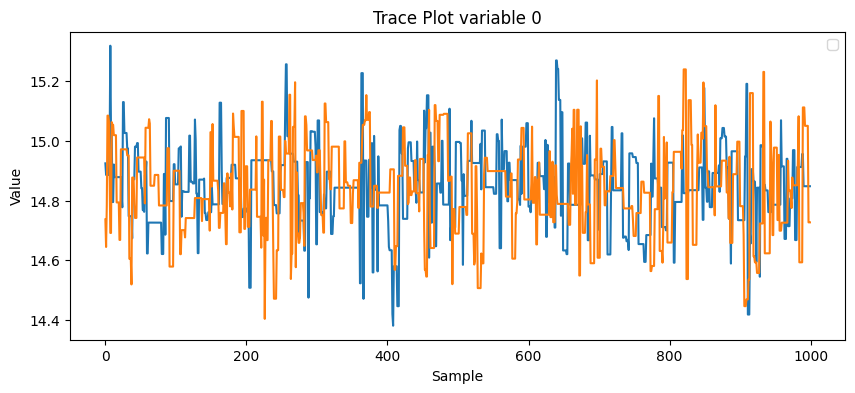

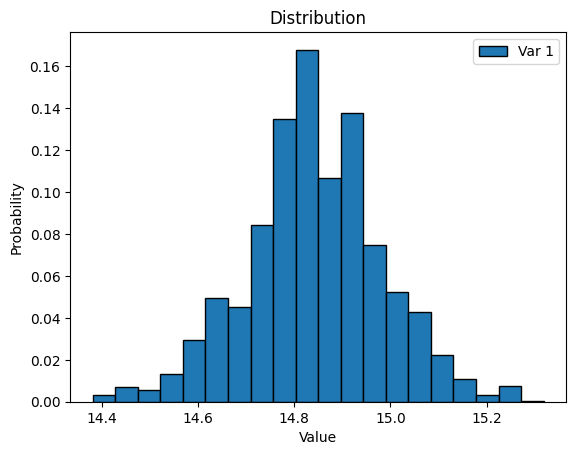

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 418.0888171575336


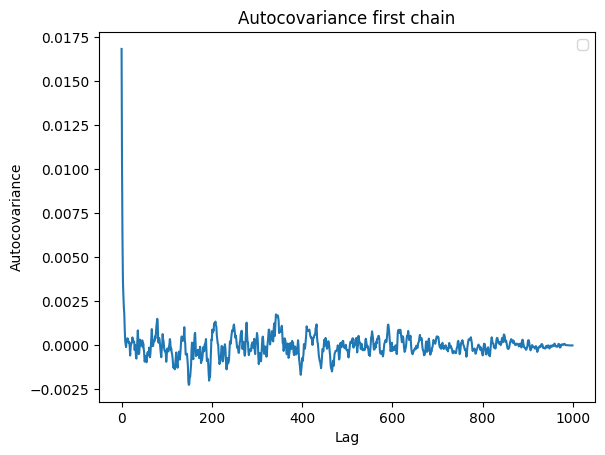

the difference between estimated values [0.15574999]



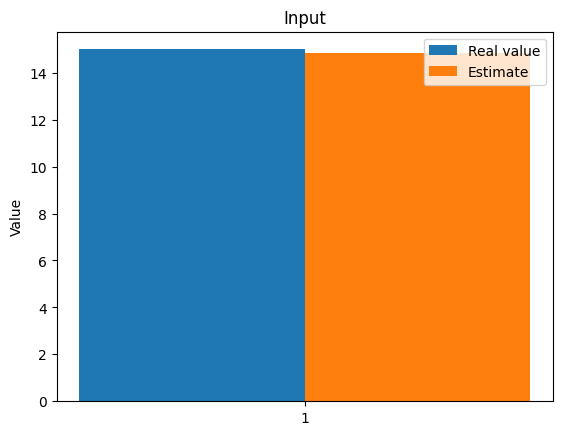

Sample 3000 / 3000

Average acceptance rate: 0.282 MCMC scale: 0.46465087216482126 

Mean values = [14.92725625]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.3 MCMC scale: 0.46064245220908323 

Mean values = [14.9289876]
(2, 1, 1000)


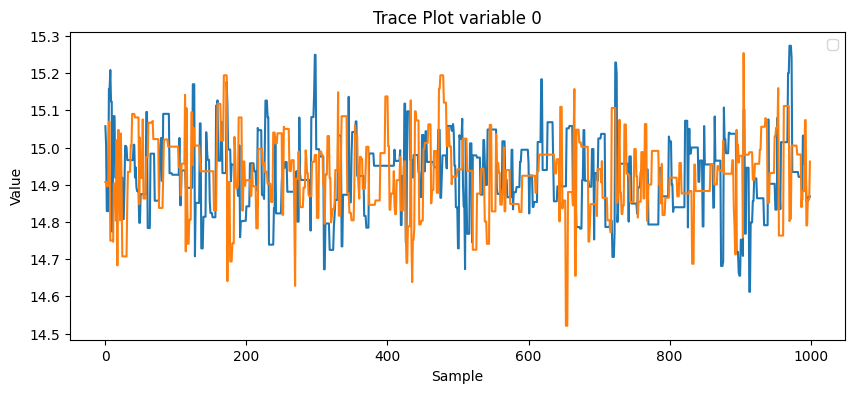

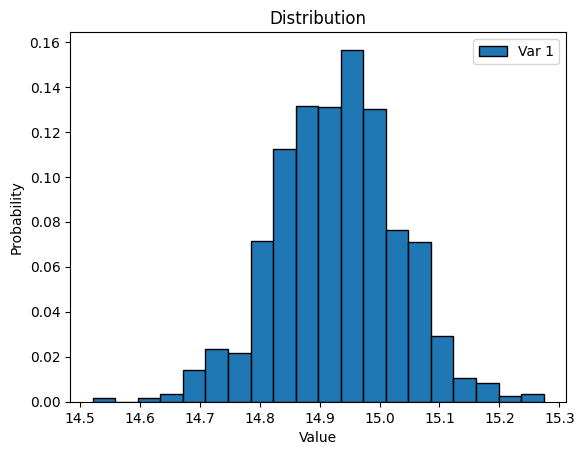

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 389.79802613337


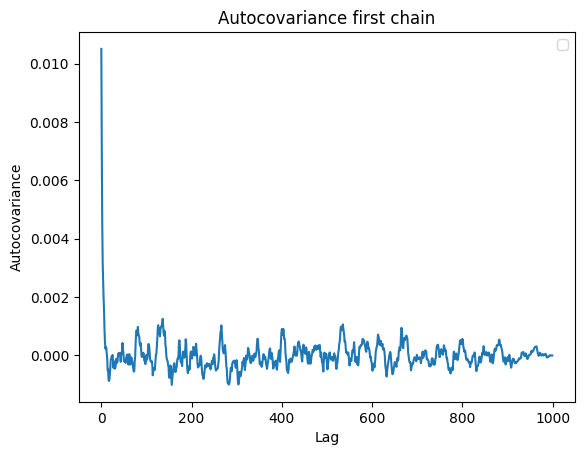

the difference between estimated values [0.0710124]



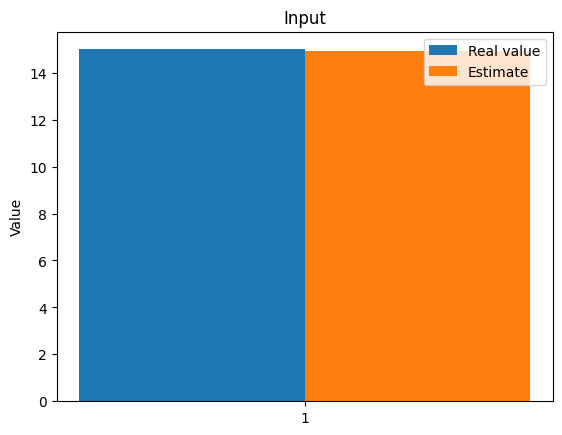

Sample 3000 / 3000

Average acceptance rate: 0.289 MCMC scale: 0.7922775411978211 

Mean values = [14.76791656]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.337 MCMC scale: 0.7632909606658906 

Mean values = [14.75423846]
(2, 1, 1000)


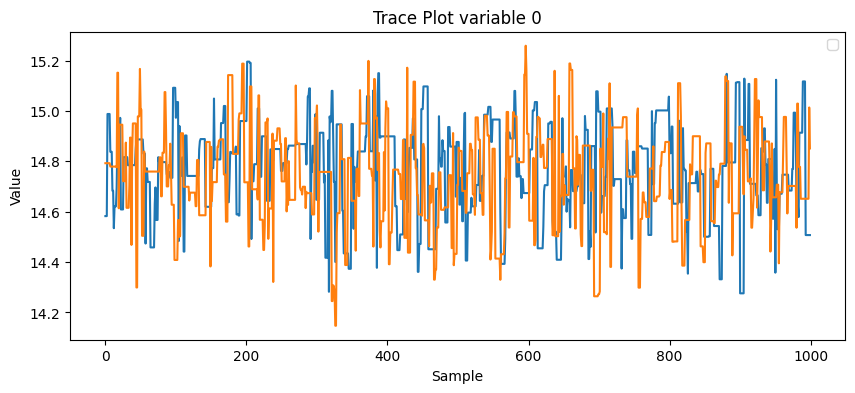

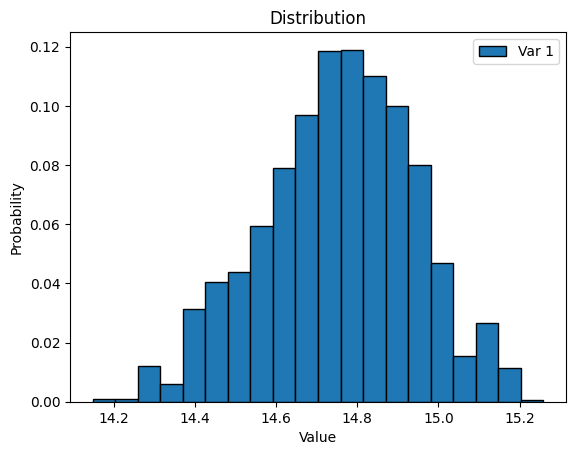

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 416.23731843630577


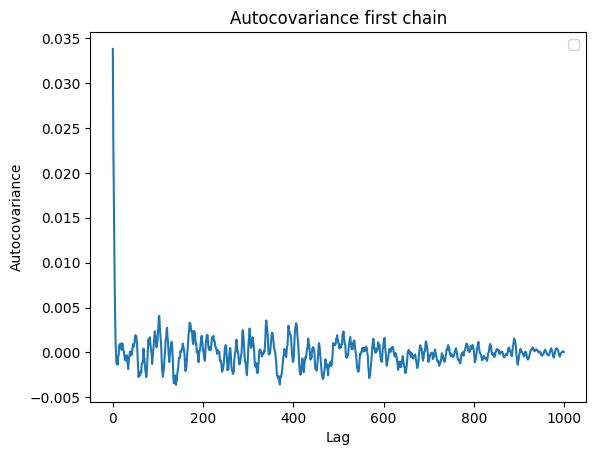

the difference between estimated values [0.24576154]



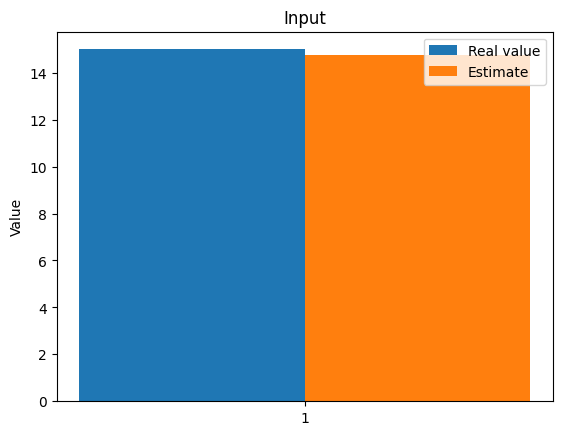

Sample 3000 / 3000

Average acceptance rate: 0.3 MCMC scale: 0.598474439023052 

Mean values = [14.88859857]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.298 MCMC scale: 0.6395843175826605 

Mean values = [14.88477948]
(2, 1, 1000)


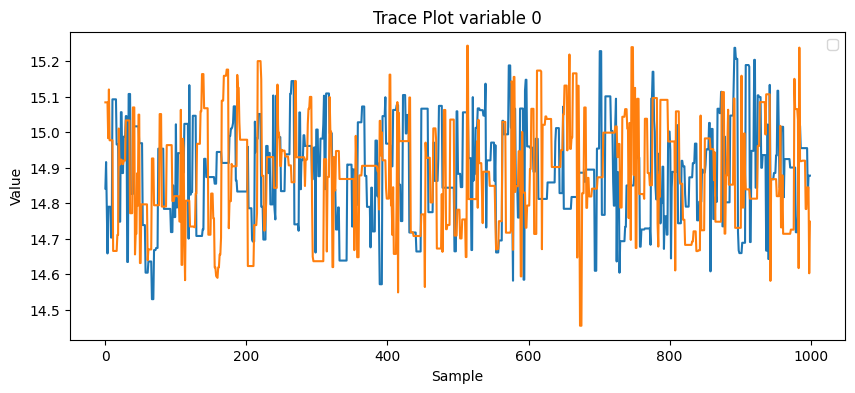

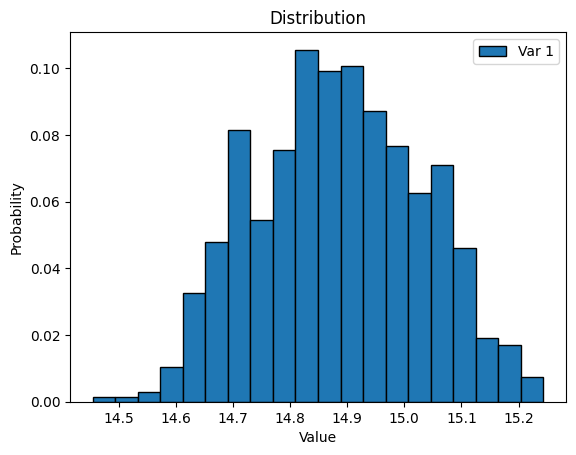

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 365.95467832527345


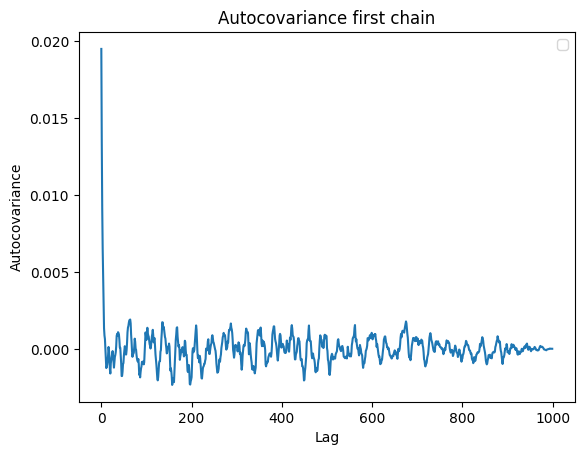

the difference between estimated values [0.11522052]



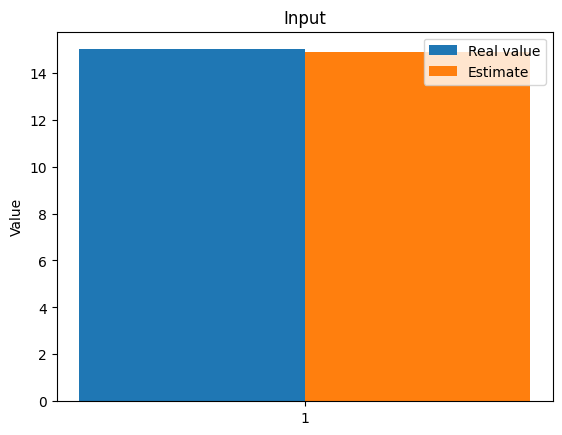

In [ ]:
# Define inputs
mean_prior = np.array([3.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 3000
burn_in = 2000
number_chains = 2
algo = "MH"
x_real = np.array([deltas[1]])
proposal_sd = [0.5,2.]
adapt = True
n_data = [50,30,10]

x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )
estimates=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model
) 


In [ ]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = np.array([10, 20, 30, 40, 50])
sigma_noise = [0.1, 0.05]
n_data = [30, 50]
parameters = np.array([deltas[-1]])
sigma = np.array([2., 4.])
rwmh_scaling = np.array([0.5, 1., 2.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 3000
burnin = 2000
n_chains = 2
algo = "MH"


estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)

estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)




In [ ]:
# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 3000
burn_in = 2000
number_chains = 2
algo = "MH"
x_real = np.array([deltas[-1]])
proposal_sd = [4.,2.]
adapt = True
n_data = [50,30]

x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )
estimates=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model
) 
